In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
import utils
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

import logging
from prophet import Prophet
from datetime import datetime, time, timedelta
from multiprocessing import cpu_count, Pool
import pycountry

## Upload all Data

In [2]:
dataT = pd.read_csv(r'/Users/edgartome_1/IronHack/IronProjects/Final_project/Original_Data_Code/extract.csv')
dataT.head()

,city,type,provider,ts,nb_trip,rain,snow,main,time_lost,before_lag,nb_vehic_avail
0,aarhus,CAR,32,2021-05-11T10:00:00Z,7,NaN,NaN,NaN,0.0,0,88.0
1,aarhus,CAR,32,2021-05-11T11:00:00Z,15,NaN,NaN,NaN,0.0,0,88.0
2,aarhus,CAR,32,2021-05-11T12:00:00Z,25,NaN,NaN,NaN,0.0,0,88.0
3,aarhus,CAR,32,2021-05-11T13:00:00Z,16,NaN,NaN,NaN,0.0,0,88.0
4,aarhus,CAR,32,2021-05-11T14:00:00Z,16,NaN,NaN,NaN,0.0,0,88.0


In [3]:
dataT.columns

Index(['city', 'type', 'provider', 'ts', 'nb_trip', 'rain', 'snow', 'main',
       'time_lost', 'before_lag', 'nb_vehic_avail'],
      dtype='object')

In [4]:
#How many citys

print('Name of the citys', dataT.city.unique())
print('Number of citys', dataT.city.nunique())

Name of the citys ['aarhus' 'amsterdam' 'antwerp' 'barcelona' 'bari' 'berlin' 'bilbao'
 'bonn' 'bordeaux' 'bratislava' 'bremen' 'bristol' 'bruxelles' 'budapest'
 'delft' 'dortmund' 'dublin' 'dusseldorf' 'eindhoven' 'enschede' 'essen'
 'frankfurt' 'gdansk' 'geneva' 'gothenburg' 'haarlem' 'hamburg' 'hanover'
 'heilbronn' 'helsingborg' 'helsinki' 'istanbul' 'karlsruhe' 'koln'
 'leipzig' 'lisbon' 'ljubljana' 'london' 'lubeck' 'lund' 'lyon' 'madrid'
 'malmo' 'milano' 'modena' 'munchen' 'munster' 'nice' 'norrkoping'
 'nuremberg' 'odense' 'orebro' 'oslo' 'paris' 'pisa' 'potsdam' 'prague'
 'reggio_emilia' 'riga' 'rome' 'rotterdam' 'seville' 'stockholm' 'tallinn'
 'the_hague' 'tilburg' 'torino' 'trondheim' 'vilnius' 'warsaw'
 'washington' 'wien' 'winterthur' 'zurich' 'zwolle']
Number of citys 75


In [5]:
#How many types sharing

print('Name of types sharing', dataT.type.unique())
print('Number of types sharing', dataT.type.nunique())

Name of types sharing ['CAR' 'BIKE' 'MOTORSCOOTER' 'SCOOTER']
Number of types sharing 4


In [6]:
#How many types of providers

print('Name of the provider', dataT.provider.unique())
print('Number of provider', dataT.provider.nunique())

Name of the provider [32  7 41 42 21 35 47 51  6 44 23 22 53 30 26 25 37 10 46 20 34 39 45 19
 14  5  8  9 24 36 27 16 31 13  3 12 15 17 38  4 40 49 18  1 52 11  2 28
 48 29 43 50 33]
Number of provider 53


In [7]:
#Transform time that was in object to date time type
dataT['ts'] = pd.to_datetime(dataT['ts'], format='%Y/%m/%d %H:%M:%S')

In [8]:
#Fuction to remove time zone

def time_n_zone(data):
    data['ts'] = data['ts'].astype(str)
    ogdata = list(data['ts'])
    newtime = []
    for time in ogdata:
        time = time[:-6]
        newtime.append(time)
    data['ts'] = newtime
    data['ts'] = data['ts'].apply(pd.to_datetime)

In [9]:
#Select data by city, type and provider. Change column names of ds to ts and nb_vehic_avail to y

def subsetDataFrame(city, type_s, provider_num):
    DataFrame = dataT[(dataT['city'] == city) & (dataT['type'] == type_s) & (dataT['provider'] == provider_num)]
    #del DataFrame['Unnamed: 0']
    time_n_zone(DataFrame)
    DataFrame.rename(columns = {'ts':'ds', 'nb_trip':'y'}, inplace = True)
    DataFrame = DataFrame.drop(['city', 'type', 'provider'], axis=1)
    le = LabelEncoder()
    DataFrame['main'] = le.fit_transform(DataFrame.main.values)
    return DataFrame

### Define new data for city, type of sharing and provider

In [10]:
data = subsetDataFrame('paris', 'CAR', 34)
data

,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
703414,2022-03-15 11:00:00,17,0.11,0.0,5,0.0,0,379.0
703415,2022-03-15 12:00:00,34,0.18,0.0,1,0.0,0,379.0
703416,2022-03-15 13:00:00,33,0.00,0.0,4,0.0,0,379.0
703417,2022-03-15 14:00:00,38,0.00,0.0,1,0.0,0,379.0
703418,2022-03-15 15:00:00,37,0.00,0.0,1,0.0,0,379.0
...,...,...,...,...,...,...,...,...
706044,2022-07-03 01:00:00,0,0.00,0.0,0,0.0,0,NaN
706045,2022-07-03 02:00:00,0,0.00,0.0,0,0.0,0,NaN
706046,2022-07-03 03:00:00,0,0.00,0.0,0,0.0,0,NaN
706047,2022-07-03 04:00:00,0,0.00,0.0,0,0.0,0,NaN


### EDA of Data

In [11]:
# Any missing data to remove, our fill
data.isnull().sum()

ds                 0
y                  0
rain               1
snow               1
main               0
time_lost          0
before_lag         0
nb_vehic_avail    30
dtype: int64

In [12]:
#Fill missing values with near values
for col in ['rain','snow','main','nb_vehic_avail']:
        data[col] = data[col].ffill()
        data[col] = data[col].bfill()

In [13]:
#Check
data.isnull().sum()

ds                0
y                 0
rain              0
snow              0
main              0
time_lost         0
before_lag        0
nb_vehic_avail    0
dtype: int64

In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2635 entries, 703414 to 706048
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   ds              2635 non-null   datetime64[ns]
 1   y               2635 non-null   int64         
 2   rain            2635 non-null   float64       
 3   snow            2635 non-null   float64       
 4   main            2635 non-null   int64         
 5   time_lost       2635 non-null   float64       
 6   before_lag      2635 non-null   int64         
 7   nb_vehic_avail  2635 non-null   float64       
dtypes: datetime64[ns](1), float64(4), int64(3)
memory usage: 185.3 KB


In [15]:
data.head()

,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
703414,2022-03-15 11:00:00,17,0.11,0.0,5,0.0,0,379.0
703415,2022-03-15 12:00:00,34,0.18,0.0,1,0.0,0,379.0
703416,2022-03-15 13:00:00,33,0.00,0.0,4,0.0,0,379.0
703417,2022-03-15 14:00:00,38,0.00,0.0,1,0.0,0,379.0
703418,2022-03-15 15:00:00,37,0.00,0.0,1,0.0,0,379.0


In [16]:
#What does each column mean?
data.describe().T

,count,mean,std,min,25%,50%,75%,max
y,2635.0,27.527514,15.445753,0.0,14.0,29.0,39.0,78.000000
rain,2635.0,0.031214,0.209415,0.0,0.0,0.0,0.0,7.350000
snow,2635.0,0.000892,0.015379,0.0,0.0,0.0,0.0,0.410000
main,2635.0,0.548008,1.153825,0.0,0.0,0.0,1.0,8.000000
time_lost,2635.0,0.001720,0.029567,0.0,0.0,0.0,0.0,0.903863
before_lag,2635.0,0.001139,0.033729,0.0,0.0,0.0,0.0,1.000000
nb_vehic_avail,2635.0,223.330171,45.345676,134.0,189.0,222.0,258.0,379.000000


In [17]:
#Quantitie of outliers
numcol = list(data.describe().columns)

for x in numcol:
    Q3 = data[x].quantile(0.75)
    Q1= data[x].quantile(0.25)
    IQR = Q3 - Q1
    filters = data[data[x]>Q3 + 1.5*IQR]
    print('Column', x)
    print('Number of outliers', len(filters))
    print('Percentage of outliers', "{:.1f}".format((len(filters)/len(data[x]))*100))
    print('\n')

Column y
Number of outliers 1
Percentage of outliers 0.0


Column rain
Number of outliers 189
Percentage of outliers 7.2


Column snow
Number of outliers 10
Percentage of outliers 0.4


Column main
Number of outliers 162
Percentage of outliers 6.1


Column time_lost
Number of outliers 12
Percentage of outliers 0.5


Column before_lag
Number of outliers 3
Percentage of outliers 0.1


Column nb_vehic_avail
Number of outliers 13
Percentage of outliers 0.5




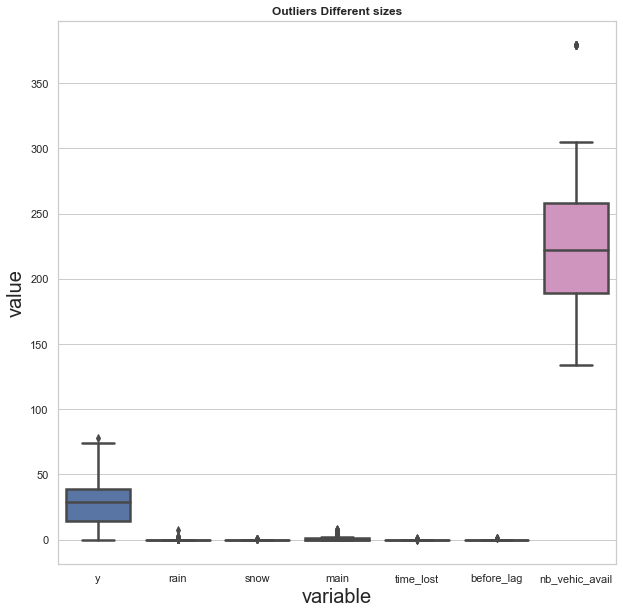

In [18]:
fig = plt.figure(figsize=(10,10))

sns.set_theme(style="whitegrid")

plt.title('Outliers Different sizes', fontweight='bold')

plt.xlabel("variable", fontsize = 20)
plt.ylabel("value", fontsize = 20)

sns.boxplot(data=data, linewidth=2.5)

plt.show()

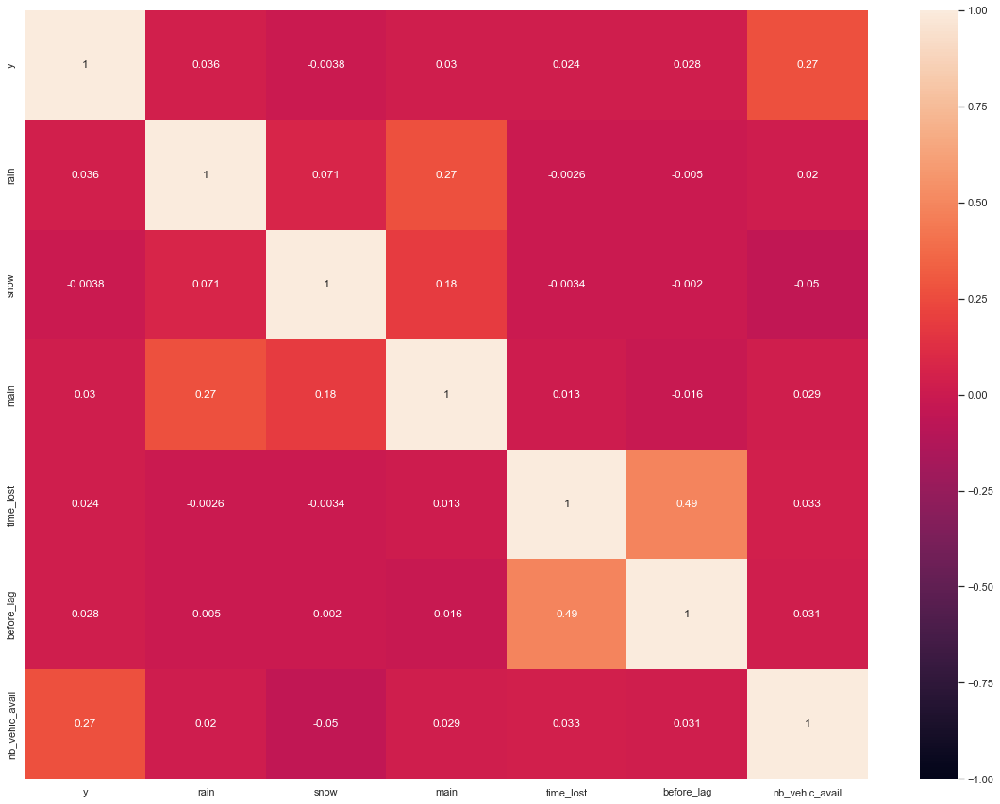

In [19]:
# Column collinearity - any high correlations?

plt.figure(figsize=(20, 15))

heatmap = sns.heatmap(data.corr(), vmin=-1, vmax=1, annot=True)

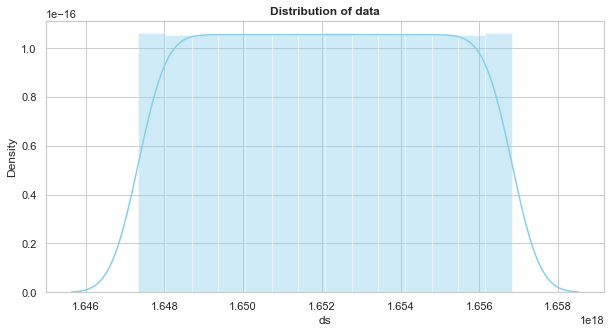

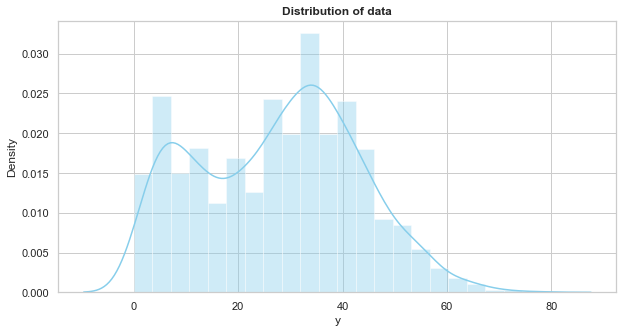

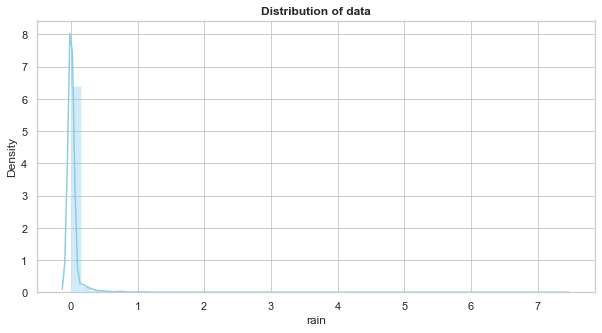

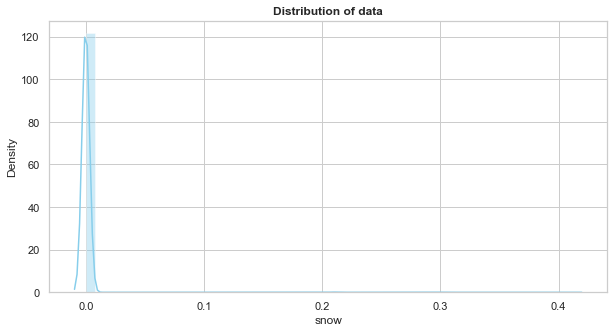

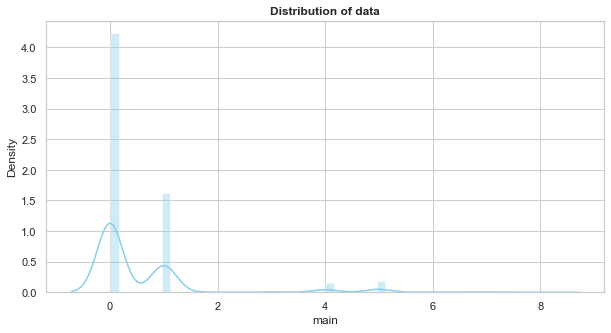

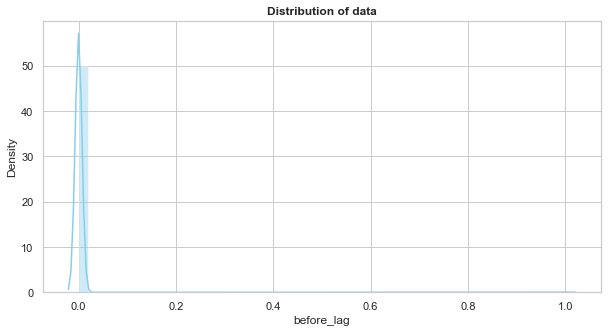

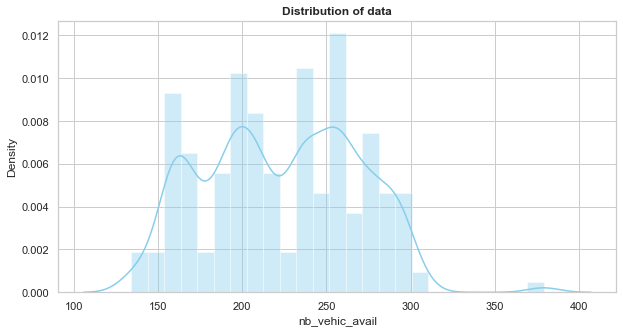

In [20]:
#Plot distribution of data of columns with numerical values
colum = ['ds','y', 'rain', 'snow', 'main', 'before_lag', 'nb_vehic_avail']
#colum = ['y', 'rain', 'snow', 'main', 'before_lag', 'nb_vehic_avail']
for col in colum:
    f, axes = plt.subplots(figsize=(10, 5), sharex=True)
    plt.title('Distribution of data', fontweight='bold')
    sns.distplot(data[col],hist=True, color="skyblue")
    plt.xlabel(col)
    plt.show()

In [21]:
data.to_csv(r'/Users/edgartome_1/IronHack/IronProjects/Final_project/Data clean/clean_data_france_paris_cars.csv')

## Apply model Prophet

In [22]:
x = len(data) - len(data)*0.8
x

527.0

In [23]:
#Train data set
data_train = data[:-527]
data_train


,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
703414,2022-03-15 11:00:00,17,0.11,0.0,5,0.0,0,379.0
703415,2022-03-15 12:00:00,34,0.18,0.0,1,0.0,0,379.0
703416,2022-03-15 13:00:00,33,0.00,0.0,4,0.0,0,379.0
703417,2022-03-15 14:00:00,38,0.00,0.0,1,0.0,0,379.0
703418,2022-03-15 15:00:00,37,0.00,0.0,1,0.0,0,379.0
...,...,...,...,...,...,...,...,...
705517,2022-06-11 02:00:00,34,0.00,0.0,0,0.0,0,270.0
705518,2022-06-11 03:00:00,11,0.00,0.0,0,0.0,0,270.0
705519,2022-06-11 04:00:00,15,0.00,0.0,0,0.0,0,270.0
705520,2022-06-11 05:00:00,12,0.00,0.0,0,0.0,0,270.0


In [24]:
#Test data set
data_test = data[-527:]
data_test

,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
705522,2022-06-11 07:00:00,14,0.0,0.0,0,0.0,0,270.0
705523,2022-06-11 08:00:00,25,0.0,0.0,1,0.0,0,270.0
705524,2022-06-11 09:00:00,41,0.0,0.0,1,0.0,0,270.0
705525,2022-06-11 10:00:00,46,0.0,0.0,1,0.0,0,270.0
705526,2022-06-11 11:00:00,53,0.0,0.0,1,0.0,0,270.0
...,...,...,...,...,...,...,...,...
706044,2022-07-03 01:00:00,0,0.0,0.0,0,0.0,0,234.0
706045,2022-07-03 02:00:00,0,0.0,0.0,0,0.0,0,234.0
706046,2022-07-03 03:00:00,0,0.0,0.0,0,0.0,0,234.0
706047,2022-07-03 04:00:00,0,0.0,0.0,0,0.0,0,234.0


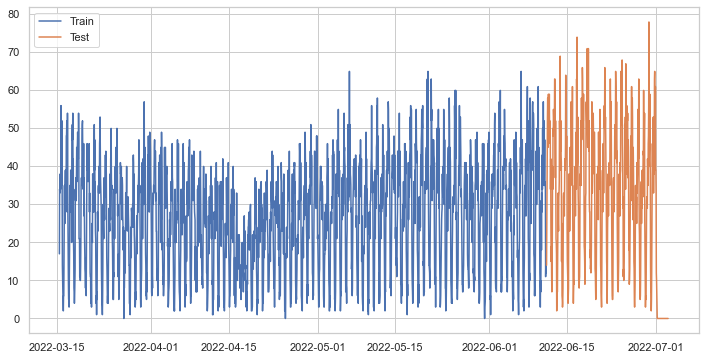

In [25]:
from matplotlib.pylab import rcParams

rcParams['figure.figsize']=12,6

#plotting the data
plt.plot(data_train['ds'],data_train['y'], label='Train')
plt.plot(data_test['ds'],data_test['y'], label='Test')
plt.legend()

In [26]:
#Aplly model

def fit_model(DATA, COUNTRY):
    m = Prophet(seasonality_mode='multiplicative', yearly_seasonality = True, changepoint_range=0.95)

    # GET COUNTRY CODE AND ADD PROPHET HOLIDAYS

    #COUNTRY = 'DENMARK'
    country_info = pycountry.countries.get(name=COUNTRY.replace("_"," ")) or pycountry.countries.get(official_name=COUNTRY.replace("_"," ")) or pycountry.countries.get(alpha_3=COUNTRY)
    m.add_country_holidays(country_name=country_info.alpha_2)
    
    
    # ADD REGRESSORS

    for reg in [e for e in list(DATA.columns) if e not in ('ds','y')]:
        m.add_regressor(reg)


    m.fit(DATA)
    return m

In [27]:
m = fit_model(data_train, 'FRANCE')

Initial log joint probability = -89.2859
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3776.15     0.0103484       122.267           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3783.45     0.0024565       96.7987           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3794.93    0.00452398       159.266           1           1      365   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3797.15   0.000590281       126.311           1           1      484   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3797.91    0.00016061       83.6733      0.1928      0.1928      609   
    Iter      log prob        ||dx||      ||grad||       alpha  

In [28]:
#To use forecast = m.predict(future), have to add future values of (rain,snow,main,time_lost,before_lag,nb_vehic_avail)
#Our use the model wihtout the regressoers for (rain,snow,main,time_lost,before_lag,nb_vehic_avail), and create data frame of future

forecast = m.predict(data_test)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
522,2022-07-03 01:00:00,5.990995,-2.260468,14.530493
523,2022-07-03 02:00:00,-1.729829,-9.919383,6.326698
524,2022-07-03 03:00:00,-7.025823,-15.823248,1.472956
525,2022-07-03 04:00:00,-8.933390,-16.999230,-0.989024
526,2022-07-03 05:00:00,-7.375904,-15.641678,0.773008


In [29]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Armistice 1918,Armistice 1918_lower,Armistice 1918_upper,Armistice 1945,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2022-06-11 07:00:00,9.896688,14.191890,30.781737,9.896688,9.896688,0.0,0.0,0.0,0.0,...,0.249663,0.249663,0.249663,2.117457,2.117457,2.117457,0.0,0.0,0.0,22.564100
1,2022-06-11 08:00:00,9.896859,20.723253,37.392073,9.896859,9.896859,0.0,0.0,0.0,0.0,...,0.241263,0.241263,0.241263,2.119953,2.119953,2.119953,0.0,0.0,0.0,29.115950
2,2022-06-11 09:00:00,9.897030,26.810036,42.690395,9.897030,9.897030,0.0,0.0,0.0,0.0,...,0.232272,0.232272,0.232272,2.122448,2.122448,2.122448,0.0,0.0,0.0,34.790368
3,2022-06-11 10:00:00,9.897201,30.231875,46.868394,9.897201,9.897201,0.0,0.0,0.0,0.0,...,0.222727,0.222727,0.222727,2.124943,2.124943,2.124943,0.0,0.0,0.0,38.781180
4,2022-06-11 11:00:00,9.897373,32.759132,49.709457,9.897373,9.897373,0.0,0.0,0.0,0.0,...,0.212663,0.212663,0.212663,2.127438,2.127438,2.127438,0.0,0.0,0.0,40.832074
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
522,2022-07-03 01:00:00,9.986036,-2.260468,14.530493,8.462167,11.712715,0.0,0.0,0.0,0.0,...,0.036697,0.036697,0.036697,0.596264,0.596264,0.596264,0.0,0.0,0.0,5.990995
523,2022-07-03 02:00:00,9.986207,-9.919383,6.326698,8.457828,11.718193,0.0,0.0,0.0,0.0,...,0.022830,0.022830,0.022830,0.586567,0.586567,0.586567,0.0,0.0,0.0,-1.729829
524,2022-07-03 03:00:00,9.986378,-15.823248,1.472956,8.453489,11.723672,0.0,0.0,0.0,0.0,...,0.008919,0.008919,0.008919,0.576862,0.576862,0.576862,0.0,0.0,0.0,-7.025823
525,2022-07-03 04:00:00,9.986549,-16.999230,-0.989024,8.449150,11.729150,0.0,0.0,0.0,0.0,...,-0.005019,-0.005019,-0.005019,0.567148,0.567148,0.567148,0.0,0.0,0.0,-8.933390


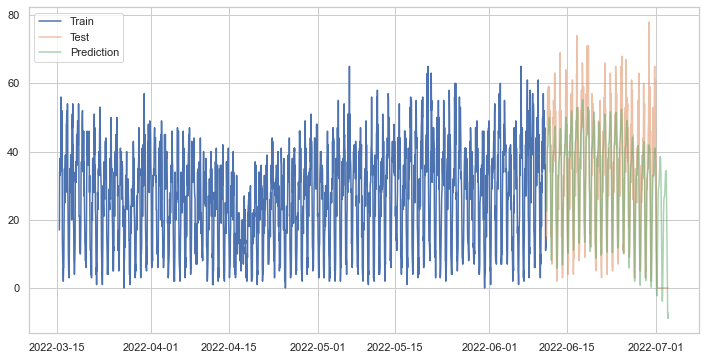

In [30]:
#Plot the train and test data on top the forecast
plt.plot(data_train.set_index('ds')['y'], label='Train')
plt.plot(data_test.set_index('ds')['y'], label='Test',alpha=0.5)
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',alpha=0.5)
plt.legend()

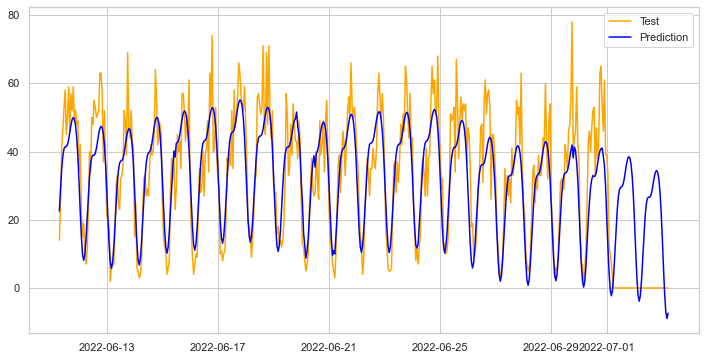

In [31]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
plt.legend()

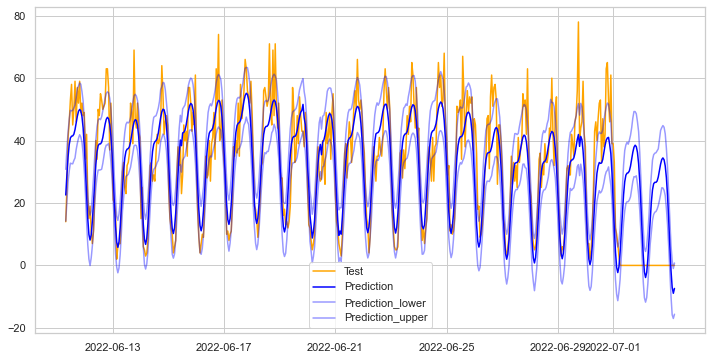

In [32]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
lower=plt.plot(forecast.set_index('ds')['yhat_lower'], label='Prediction_lower',alpha=0.4,color='blue')
upper=plt.plot(forecast.set_index('ds')['yhat_upper'], label='Prediction_upper',alpha=0.4,color='blue')
plt.legend()

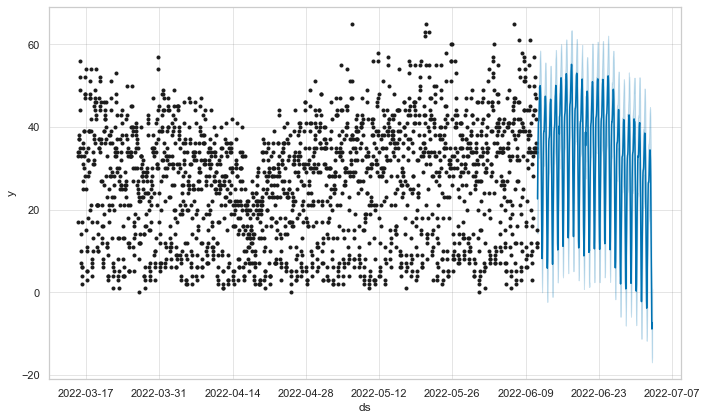

In [33]:
fig1 = m.plot(forecast)

In [34]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [35]:
plot_components_plotly(m, forecast)

## Test model - Cross validation

In [36]:
len(data_test['y'])


527

In [37]:
len(forecast['yhat'])

527

In [38]:
#calculate Root Mean Square  Error(RMSE)
from math import sqrt
from sklearn.metrics import mean_squared_error

rms = sqrt(mean_squared_error(data_test['y'],forecast['yhat']))

print('The root mean square error score for the model is: ', rms)

The root mean square error score for the model is:  11.449257976328047


In [39]:
#calculate Mean Absolute Error(MAE)
from math import sqrt
from sklearn.metrics import mean_squared_error

mae = mean_squared_error(data_test['y'],forecast['yhat'])

print('The mean absolute error score for the model is: ', mae)

The mean absolute error score for the model is:  131.0855082085114


In [40]:
#Coefficient of Determination or R^2
from sklearn.metrics import r2_score

r2 = r2_score(data_test['y'],forecast['yhat'])

print('The coefficient of determination of r2 score for the model is: ', r2)

The coefficient of determination of r2 score for the model is:  0.6478506566763791


In [41]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error

y_true = data_test['y'].values
y_pred = forecast['yhat'].values

mae_01 = mean_absolute_error(y_true, y_pred)
mape_01 = mean_absolute_percentage_error(y_true, y_pred)

print('The mean absolute error for the model is: ', mae_01)
print('\n')
print('The mean absolute percentage error for the model is: ', mape_01)

The mean absolute error for the model is:  8.437481218839501


The mean absolute percentage error for the model is:  8976028715692121.0


In [42]:
days_train = data['ds'].iloc[2108] - data['ds'].iloc[0]
days_train

Timedelta('87 days 20:00:00')

In [43]:
days_test = data['ds'].iloc[2634] - data['ds'].iloc[2108]
days_test

Timedelta('21 days 22:00:00')

In [44]:
total_days = days_train + days_test
total_days

Timedelta('109 days 18:00:00')

In [45]:
import warnings
warnings.filterwarnings("ignore")

In [46]:
# Cross validation
#Train on the first 200 days, aply to next 5 days and loop each 5 days to reach final data
from prophet.diagnostics import cross_validation

df_cv = cross_validation(m, initial='20 days', period='5 days', horizon = '20 days', parallel="processes")

INFO:prophet:Making 10 forecasts with cutoffs between 2022-04-07 06:00:00 and 2022-05-22 06:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd958dc6d00>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -43.9887
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1360.5    0.00148099       84.2988      0.5807      0.5807      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -37.3195
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1361.73    0.00105801       96.0678      0.3258           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87        946.64   4.01617e-08        76.339       0.322           1      114   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     229       1361.94   0.000150918       83.4936   1.967e-06       0.001      294  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       1362.01   1.26134e-06       88.7205      0.1656      0.1656      389   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -44.3536
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -47.0536
     330       1362.02   5.02734e-08       70.6595      0.3238      0.8233      431   
Optimization terminated normally: 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -54.4411
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1567.27   5.54101e-06       96.9205      0.1535      0.1535      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       1567.28   2.60687e-05       104.772

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -44.1461
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       1991.37    0.00332455       424.418   2.565e-05       0.001      271  LS failed, Hessian reset 
     199       1782.95    0.00527755       156.581           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       1152.42   0.000105154       101.831   1.127e-06       0.001      145  LS failed, Hessian reset 
      99       1152.43   4.04689e-06       73.4578      0.2888      0.2888      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2573.72    0.00338542       135.151       3.221      0.3221      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1582.33   0.000430716       102.971      0.6783      0.6783      509   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     595       1999.16   6.85548e-05       75.9472   8.923e-07       0.001      861  LS failed, Hessian reset 
     599       1999.16   1.11432e-05       62.5912           1           1      866   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     367       2583.98    0.00082727       127.942    9.04e-06       0.001      588  LS failed, Hessian reset 
     399        2584.2    0.00280814       108.606           1           1      625   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     619       1999.16   1.58672e-06       75.4825   2.187e-08       0.001      926  LS failed, Hessian reset 
     638       1999.16   3.53648e-07       67.5446   4.657e-09       0.001      988  LS failed, Hessian reset 
     643       1999.16   5.63101e-08       72.8715      0.3115      0.3115      996   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     699       2586.31    0.00282332       82.3624           1           1      980   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       2586.62   0.000390256       73.9761         2.2        0.22     1098   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       2590.38     0.0945328       1060.34      0.5019           1     1205   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       2598.08    0.00952023       474.845      0.2399           1     1327   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       2605.63    0.00376637       75.4566       0.867       0.867     1446   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1164        2607.1   8.81516e-06       96.7749   7.836e-08       0.001     1574  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -68.9321
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -65.3183
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2791.81    0.00237359       92.9019      0.1893           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2986.4    0.00661857       138.061      0.1486       0.685      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2796.55     0.0100522       169.815           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     195       2990.97    0.00105644       273.501   8.126e-06       0.001      276  LS failed, Hessian reset 
     199       2991.47    0.00212599       109.832           1           1      280   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1299       3010.87   0.000172878       74.7877      0.5257      0.5257     1660   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       3011.07   2.17477e-06       82.1232           1           1     1789   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499        3011.1   1.66969e-05       69.2587      0.5811      0.5811     1910   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       3011.12   0.000254549       80.1941      0.8149      0.8149     2041   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1633       3011.14   3.62474e-07       59.3153      0.7368      0.7368     2092   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

In [47]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2022-04-07 07:00:00,17.817127,10.037649,25.144211,20,2022-04-07 06:00:00
1,2022-04-07 08:00:00,22.500532,14.374240,30.781752,27,2022-04-07 06:00:00
2,2022-04-07 09:00:00,27.038816,18.962878,34.655851,15,2022-04-07 06:00:00
3,2022-04-07 10:00:00,29.971635,22.256691,37.890193,16,2022-04-07 06:00:00
4,2022-04-07 11:00:00,32.498217,25.258349,40.496836,25,2022-04-07 06:00:00


In [48]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

INFO:prophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,smape,coverage
0,2 days 00:00:00,45.057285,6.712472,5.314917,0.186428,0.303829,0.760417
1,2 days 01:00:00,45.497284,6.745167,5.333680,0.184624,0.304164,0.758333
2,2 days 02:00:00,45.733424,6.762649,5.338166,0.183930,0.304087,0.756250
3,2 days 03:00:00,45.560263,6.749834,5.341094,0.183930,0.304198,0.760417
4,2 days 04:00:00,46.261621,6.801590,5.393918,0.186428,0.305933,0.758333


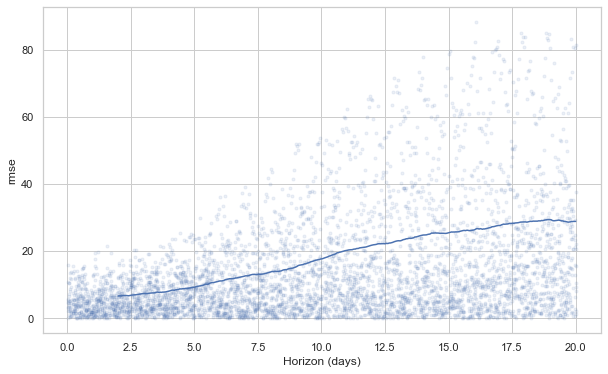

In [49]:
from prophet.plot import plot_cross_validation_metric

fig = plot_cross_validation_metric(df_cv, metric='rmse')


### Hyper Parameter Tuning

In [50]:
# Python
import itertools

param_grid = {  
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0], 
    'holidays_prior_scale': [0.01, 0.1, 1.0, 10.0]}

In [51]:
# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]

In [52]:
dictest = all_params[1]

In [53]:
dictest.values()

dict_values([0.001, 0.01, 0.1])

In [54]:
from prophet.diagnostics import cross_validation

# Use cross validation to evaluate all parameters
# By default, the initial training period is set to three times the horizon, and cutoffs are made every half a horizon.

rmses = []  # Store the RMSEs for each parameters here
d = {}
for params in all_params:
    liskeys = list(params.values())
    key = (liskeys[0],liskeys[1], liskeys[2])
    m = Prophet(**params, yearly_seasonality=True).fit(data)  # Fit model with given parameters
    data_cv = cross_validation(m, initial='20 days', period='5 days', horizon = '20 days', parallel="processes")
    data_p = performance_metrics(data_cv, rolling_window=1)
    rmses.append(data_p['rmse'].values[0])
    d[key] = data_p['rmse'].values[0]

INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd91957a4c0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       4391.62   5.28351e-07       4897.12   1.063e-10       0.001      165  LS failed, Hessian reset 
      99       4391.62   3.76705e-07       5112.04           1           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       4391.62   8.45023e-09       4686.89      0.4374      0.4374      180   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -29.2526             0       637.161       1e-12       0.001       26   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -300.606
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.1022             0       947.803       1e-12       0.001       23   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made
       1      -51.7186             0       861.075       1e-12       0.001       23   
Optimization terminated with error: 
  Line search faile

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -49.9013             0       1028.86       1e-12       0.001       29   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -652.073
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration  2. Log joint probability =    640.012. Improved by 267.448.
Iteration  1. Log joint probability =    231.337. Improved by 664.682.
      75       2331.87   0.000151684       4963.99   3.042e-08       0.001      134  LS failed, Hessian reset 
      91        1690.9   8.66363e-09       4814.37      0.4283      0.4283      116   
Optimization terminated normally: 
  Convergence detec

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     108       2114.23   0.000177507       5029.45   3.544e-08       0.001      223  LS failed, Hessian reset 
Iteration  1. Log joint probability =     573.51. Improved by 1225.58.
Iteration  4. Log joint probability =    710.944. Improved by 22.9184.
Iteration  2. Log joint probability =    495.758. Improved by 57.5003.
     164       2115.13   6.97025e-09       4821.52      0.6876      0.6876      295   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  3. Log joint probability =    884.126. Improved by 154.323.
Iteration  5. Log joint probability =    712.958. Improved by 2.01368.
Iteration  2. Log joint probability =    972.485. Improved by 398.975.
Iteration  3. Log joint probability =    1005.91. Improved by 510.155.
Iteration  6. Log joint probability =    713.007. Improved by 0.0490796.
Iteration  4. Log joint probability =    902.982. Improved by 18.8564.
Iteration  7. Log joint probability =    713.139. Improv

Iteration 39. Log joint probability =    713.333. Improved by 0.000328757.
Iteration 27. Log joint probability =    1122.73. Improved by 8.16388e-06.
Iteration 32. Log joint probability =    917.141. Improved by 4.84922e-06.
Iteration 24. Log joint probability =    1318.28. Improved by 0.00943823.
Iteration 40. Log joint probability =    713.333. Improved by 0.000118661.
Iteration 33. Log joint probability =    917.141. Improved by 2.91277e-06.
Iteration 28. Log joint probability =    1122.73. Improved by 0.00028432.
Iteration 41. Log joint probability =    713.333. Improved by 2.58551e-07.
Iteration 25. Log joint probability =     1318.3. Improved by 0.0191038.
Iteration 42. Log joint probability =    713.333. Improved by 1.06216e-05.
Iteration 34. Log joint probability =    917.141. Improved by 7.66973e-07.
Iteration 29. Log joint probability =    1122.73. Improved by 5.69961e-05.
Iteration 26. Log joint probability =    1318.31. Improved by 0.00955493.
Iteration 43. Log joint probab

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 51. Log joint probability =    713.333. Improved by 1.51023e-06.
Iteration 32. Log joint probability =    1318.39. Improved by 0.0120746.
Iteration 36. Log joint probability =    1122.73. Improved by 1.23597e-06.
Iteration 52. Log joint probability =    713.333. Improved by 9.53562e-07.
Iteration 53. Log joint probability =    713.333. Improved by 4.91804e-07.
Iteration 33. Log joint probability =     1318.4. Improved by 0.00942891.
Iteration 37. Log joint probability =    1122.73. Improved by 7.48355e-06.
Iteration 54. Log joint probability =    713.333. Improved by 4.32547e-07.
Iteration 38. Log joint probability =    1122.73. Improved by 3.42839e-06.
Iteration 34. Log joint probability =    1318.41. Improved by 0.0142045.
Iteration 55. Log joint probability =    713.333. Improved by 3.17021e-07.
Iteration 35. Log joint probability =    1318.42. Improved by 0.00544732.
Iteration 39. Log joint probability =    1122.73. Improved by 3.8683e-06.
Iteration 56. Log joint probabil

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      76       2577.05   7.71579e-09       5079.01      0.3456           1       95   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 38. Log joint probability =    1318.46. Improved by 0.0181444.
Iteration 60. Log joint probability =    713.333. Improved by 4.42731e-09.
Iteration 42. Log joint probability =    1122.73. Improved by 1.05674e-06.
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 39. Log joint probability =    1318.46. Improved by 0.000399869.
Iteration 43. Log joint probability =    1122.73. Improved by 1.82546e-07.
      94       2906.09   8.32027e-09       4941.79      0.5043      0.5043      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter chan

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 40. Log joint probability =    1318.48. Improved by 0.0188449.
Iteration 44. Log joint probability =    1122.73. Improved by 5.69858e-07.
      95        3098.1   2.48146e-07       4953.04   4.959e-11       0.001      189  LS failed, Hessian reset 
      99        3098.1   7.11095e-08       4856.16      0.1951           1      194   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110        3098.1   7.06692e-09       4913.89      0.3944      0.3944      208   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 41. Log joint probability =    1318.55. Improved by 0.0730059.
Iteration 45. Log joint probability =    1122.73. Improved by 2.47381e-07.
Iteration 42. Log joint probability =    1318.56. Improved by 0.016587.
Iteration 46. Log joint probability =    1122.73. Improved by 4.18931e-08.
Iteration 43. Log joint probability =    1318.59. Improved by 0.0295484.
It

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 46. Log joint probability =    1318.63. Improved by 0.00403943.
Iteration 47. Log joint probability =    1318.64. Improved by 0.0102203.
Iteration 48. Log joint probability =    1318.64. Improved by 0.00415946.
Iteration 49. Log joint probability =    1318.64. Improved by 0.000158219.
Iteration 50. Log joint probability =    1318.64. Improved by 0.000391057.
Iteration 51. Log joint probability =    1318.64. Improved by 0.000116756.
Iteration 52. Log joint probability =    1318.64. Improved by 0.000434927.
Iteration 53. Log joint probability =    1318.64. Improved by 7.19139e-05.
Iteration 54. Log joint probability =    1318.64. Improved by 0.000459884.
Iteration 55. Log joint probability =    1318.64. Improved by 6.14434e-05.
Iteration 56. Log joint probability =    1318.64. Improved by 0.000456784.
Iteration 57. Log joint probability =    1318.64. Improved by 3.97885e-05.
Iteration 58. Log joint probability =    1318.64. Improved by 0.000517312.
Iteration 59. Log joint proba

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 73. Log joint probability =    1318.65. Improved by 3.05954e-05.
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      70       3299.66     2.641e-09        4969.3      0.1576      0.1576       90   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 74. Log joint probability =    1318.65. Improved by 1.8328e-05.
Iteration 75. Log joint probability =    1318.65. Improved by 1.00273e-05.
Iteration 76. Log joint probability =    1318.65. Improved by 3.15125e-06.
Iteration 77. Log joint probability =    1318.65. Improved by 1.75279e-06.
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      70       3449.47    6.9461e-09       5078.06      0.1581           1       93   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 78. Log joint probability =    1318.65. Improved by 1.99718e-06.
Iteration 79. Log joint probability =    1318.65. Improved by 8.83047e-07.
Iteration 80. Log joint probability =    1318.65. Improved by 4.84561e-07.
Iteration 81. Log joint probability =    1318.65. Improved by 3.40836e-07.
Iteration 82. Log joint probability =    1318.65. Improved by 1.97931e-07.
Iteration 83. Log joint probability =    1318.65. Improved by 1.68781e-07.
Iteration 84. Log joint probability =    1318.65. Improved by 1.54239e-07.
Iteration 85. Log joint probability =    1318.65. Improved by 7.55988e-08.
Iteration 86. Log joint probability =    1318.65. Improved by 3.88861e-08.
Iteration 87. Log joint probability =    1318.65. Improved by 6.81321e-08.
Iteration 88. Log joint probability =    1318.65. Improved

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd9191c2880>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       4391.62   5.28351e-07       4897.12   1.063e-10       0.001      165  LS failed, Hessian reset 
      99       4391.62   3.76705e-07       5112.04           1           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       4391.62   8.45023e-09       4686.89      0.4374      0.4374      180   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.1022
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.7186             0       861.075       1e-12       0.001       23   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -433.345
       1      -51.1022             0       947.803       1e-12       0.001       23   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -543.001
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -29.2526             0       637.161       1e-12       0.001       26   
Optimization t

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration  1. Log joint probability =    438.258. Improved by 981.259.
      91        1690.9   8.66363e-09       4814.37      0.4283      0.4283      116   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      75       2331.87   0.000151684       4963.99   3.042e-08       0.001      134  LS failed, Hessian reset 
Iteration  1. Log joint probability =    372.564. Improved by 673.171.
      96       1489.21   9.04015e-09       5045.43      0.5503      0.5503      130   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       2332.39   1.31107e-07       4980.61      0.8749      0.8749      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       2107.32    0.00104455       4982.76   2.084e-07       0.001      130  LS failed, Hessian reset 
     101       2332.39   9.38536e-09       5078.37      0.1092      0.109

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration  3. Log joint probability =    884.126. Improved by 154.323.
Iteration  3. Log joint probability =    1005.91. Improved by 510.155.
Iteration  2. Log joint probability =    972.485. Improved by 398.975.
Iteration  3. Log joint probability =    688.026. Improved by 48.0142.
Iteration  4. Log joint probability =    902.982. Improved by 18.8564.
Iteration  4. Log joint probability =    710.944. Improved by 22.9184.
Iteration  4. Log joint probability =    1083.65. Improved by 77.7335.
Iteration  5. Log joint probability =    910.293. Improved by 7.31129.
Iteration  3. Log joint probability =    1301.47. Improved by 328.989.
Iteration  5. Log joint probability =    712.958. Improved by 2.01368.
Iteration  5. Log joint probability =    1095.18. Improved by 11.5355.
Iteration  6. Log joint probability =    913.757. Improved by 3.46416.
Iteration  6. Log joint probability =    713.007. Improved by 0.0490796.
Iteration  4. Log joint probability =    1307.07. Improved by 5.59405.
Iter

Iteration 29. Log joint probability =    1122.73. Improved by 5.69961e-05.
Iteration 39. Log joint probability =    713.333. Improved by 0.000328757.
Iteration 35. Log joint probability =    917.141. Improved by 5.67049e-07.
Iteration 26. Log joint probability =    1318.31. Improved by 0.00955493.
Iteration 40. Log joint probability =    713.333. Improved by 0.000118661.
Iteration 30. Log joint probability =    1122.73. Improved by 0.000158736.
Iteration 36. Log joint probability =    917.141. Improved by 2.02167e-07.
Iteration 41. Log joint probability =    713.333. Improved by 2.58551e-07.
Iteration 31. Log joint probability =    1122.73. Improved by 3.79425e-05.
Iteration 27. Log joint probability =    1318.33. Improved by 0.0170652.
Iteration 37. Log joint probability =    917.141. Improved by 3.42724e-08.
Iteration 42. Log joint probability =    713.333. Improved by 1.06216e-05.
Iteration 32. Log joint probability =    1122.73. Improved by 2.45127e-05.
Iteration 43. Log joint prob

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 47. Log joint probability =    713.333. Improved by 9.01006e-06.
Iteration 35. Log joint probability =    1122.73. Improved by 1.62545e-05.
Iteration 31. Log joint probability =    1318.38. Improved by 0.0124348.
Iteration 48. Log joint probability =    713.333. Improved by 6.32194e-07.
Iteration 36. Log joint probability =    1122.73. Improved by 1.23597e-06.
Iteration 49. Log joint probability =    713.333. Improved by 3.72596e-06.
Iteration 32. Log joint probability =    1318.39. Improved by 0.0120746.
Iteration 37. Log joint probability =    1122.73. Improved by 7.48355e-06.
Iteration 50. Log joint probability =    713.333. Improved by 2.2799e-06.
Iteration 33. Log joint probability =     1318.4. Improved by 0.00942891.
Iteration 51. Log joint probability =    713.333. Improved by 1.51023e-06.
Iteration 38. Log joint probability =    1122.73. Improved by 3.42839e-06.
Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 34. Log joint probability =    1318.41. Improved by 0.0142045.
      71       2538.57   3.68804e-09       5033.69      0.2891      0.2891       98   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 39. Log joint probability =    1122.73. Improved by 3.8683e-06.
Iteration 53. Log joint probability =    713.333. Improved by 4.91804e-07.
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 35. Log joint probability =    1318.42. Improved by 0.00544732.
Iteration 54. Log joint probability =    713.333. Improved by 4.32547e-07.
      76       2577.05   7.71579e-09       5079.01      0.3456           1       95   
Optimization terminated normally: 
  Convergence detected: absolute parameter change

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       2906.09   8.32027e-09       4941.79      0.5043      0.5043      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 55. Log joint probability =    713.333. Improved by 3.17021e-07.
Iteration 36. Log joint probability =    1318.44. Improved by 0.0168458.
Iteration 41. Log joint probability =    1122.73. Improved by 1.66134e-07.
Iteration 56. Log joint probability =    713.333. Improved by 1.22817e-07.
Iteration 57. Log joint probability =    713.333. Improved by 7.75351e-08.
      95        3098.1   2.48146e-07       4953.04   4.959e-11       0.001      189  LS failed, Hessian reset 
      99        3098.1   7.11095e-08       4856.16      0.1951           1      194   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 37. Log joint probability =    1318.44. Imp

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 44. Log joint probability =    1122.73. Improved by 5.69858e-07.
Iteration 60. Log joint probability =    713.333. Improved by 4.42731e-09.
Iteration 39. Log joint probability =    1318.46. Improved by 0.000399869.
Iteration 45. Log joint probability =    1122.73. Improved by 2.47381e-07.
Iteration 40. Log joint probability =    1318.48. Improved by 0.0188449.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 46. Log joint probability =    1122.73. Improved by 4.18931e-08.
Iteration 41. Log joint probability =    1318.55. Improved by 0.0730059.
Iteration 47. Log joint probability =    1122.73. Improved by 1.51414e-07.
Iteration 42. Log joint probability =    1318.56. Improved by 0.016587.
Iteration 48. Log joint probability =    1122.73. Improved by 5.43635e-08.
Iteration 43. Log joint probability =    1318.59. Improved by 0.0295484.
Iteration 49. Log joint probability =    1122.73. Improved by 8.02765e-09.
Iteration 44. Log joint probability =    1318.61. Improved by 0.015321.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 45. Log joint probability =    1318.62. Improved by 0.0131324.
Iteration 46. Log joint probability =    1318.63. Improved by 0.00403943.
Iteration 47. Log joint probability =    1318.64. Improved by 0.0102203.
Iteration 48. Log joint probability =    1318.64. Improved by 0.00415946.
Iteration 49. Log joint probability =    1318.64. Improved by 0.000158219.
Iteration 50. Log joint probability =    1318.64. Improved by 0.000391057.
Iteration 51. Log joint probability =    1318.64. Improved by 0.000116756.
Iteration 52. Log joint probability =    1318.64. Improved by 0.000434927.
Iteration 53. Log joint probability =    1318.64. Improved by 7.19139e-05.
Iteration 54. Log joint probability =    1318.64. Improved by 0.000459884.
Iteration 55. Log joint probability =    1318.64. Improved by 6.14434e-05.
Iteration 56. Log joint probability =    1318.64. Improved by 0.000456784.
Iteration 57. Log joint probability =    1318.64. Improved by 3.97885e-05.
Iteration 58. Log joint probabi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 68. Log joint probability =    1318.65. Improved by 0.000352261.
Iteration 69. Log joint probability =    1318.65. Improved by 4.41139e-05.
Iteration 70. Log joint probability =    1318.65. Improved by 0.000106704.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 71. Log joint probability =    1318.65. Improved by 1.89999e-05.
      70       3449.47    6.9461e-09       5078.06      0.1581           1       93   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 72. Log joint probability =    1318.65. Improved by 3.24101e-05.
Iteration 73. Log joint probability =    1318.65. Improved by 3.05954e-05.
Iteration 74. Log joint probability =    1318.65. Improved by 1.8328e-05.
Iteration 75. Log joint probability =    1318.65. Improved by 1.00273e-05.
Iteration 76. Log joint probability =    1318.65. Improved by 3.15125e-06.
Iteration 77. Log joint probability =    1318.65. Improved by 1.75279e-06.
Iteration 78. Log joint probability =    1318.65. Improved by 1.99718e-06.
Iteration 79. Log joint probability =    1318.65. Improved by 8.83047e-07.
I

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd9180d8220>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       4391.62   5.28351e-07       4897.12   1.063e-10       0.001      165  LS failed, Hessian reset 
      99       4391.62   3.76705e-07       5112.04           1           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       4391.62   8.45023e-09       4686.89      0.4374      0.4374      180   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -29.2526             0       637.161       1e-12       0.001       26   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -300.606
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -49.9013             0       1028.86       1e-12       0.001       29   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -652.073
Iteration  1. Log joint probability =    372.564. Improved by 673.171.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.7186             0       861.075       1e-12       0.001       23   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

Initial log joint probability = -433.345
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration  2. Log joint probability =    640.012. Improved by 267.448.
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.1022             0       947.803       1e-12       0.001       23   
Optimization terminated with error: 
  Line search failed to 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration  1. Log joint probability =    438.258. Improved by 981.259.
Iteration  4. Log joint probability =    710.944. Improved by 22.9184.
      71       2107.32    0.00104455       4982.76   2.084e-07       0.001      130  LS failed, Hessian reset 
      96       1489.21   9.04015e-09       5045.43      0.5503      0.5503      130   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  2. Log joint probability =    972.485. Improved by 398.975.
      99       2111.46   1.85257e-05       5105.16           1           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration  2. Log joint probability =    729.802. Improved by 498.466.
     108       2114.23   0.000177507       5029.45   3.544e-08       0.001      223  LS failed, Hessian reset 
Iteration  5. Log joint probability =    712.958. Improved by 2.01368.
     164       2115.13   6.97025e-09       4821.52  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration  7. Log joint probability =    713.139. Improved by 0.131592.
Iteration  4. Log joint probability =    902.982. Improved by 18.8564.
Iteration  3. Log joint probability =    1005.91. Improved by 510.155.
Iteration  4. Log joint probability =    1307.07. Improved by 5.59405.
Iteration  8. Log joint probability =    713.187. Improved by 0.0486934.
Iteration  5. Log joint probability =    910.293. Improved by 7.31129.
Iteration  4. Log joint probability =    1083.65. Improved by 77.7335.
Iteration  9. Log joint probability =    713.233. Improved by 0.0457105.
Iteration  5. Log joint probability =    1315.54. Improved by 8.47352.
Iteration  6. Log joint probability =    913.757. Improved by 3.46416.
Iteration 10. Log joint probability =    713.265. Improved by 0.0315667.
Iteration  5. Log joint probability =    1095.18. Improved by 11.5355.
Iteration  7. Log joint probability =    915.425. Improved by 1.66766.
Iteration  6. Log joint probability =    1317.64. Improved by 2.09789.

Iteration 30. Log joint probability =    1122.73. Improved by 0.000158736.
Iteration 45. Log joint probability =    713.333. Improved by 1.89718e-05.
Iteration 35. Log joint probability =    917.141. Improved by 5.67049e-07.
Iteration 28. Log joint probability =    1318.34. Improved by 0.0102271.
Iteration 46. Log joint probability =    713.333. Improved by 1.1942e-05.
Iteration 31. Log joint probability =    1122.73. Improved by 3.79425e-05.
Iteration 36. Log joint probability =    917.141. Improved by 2.02167e-07.
Iteration 29. Log joint probability =    1318.35. Improved by 0.0148197.
Iteration 47. Log joint probability =    713.333. Improved by 9.01006e-06.
Iteration 37. Log joint probability =    917.141. Improved by 3.42724e-08.
Iteration 32. Log joint probability =    1122.73. Improved by 2.45127e-05.
Iteration 48. Log joint probability =    713.333. Improved by 6.32194e-07.
Iteration 30. Log joint probability =    1318.37. Improved by 0.010945.
Iteration 38. Log joint probabili

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 51. Log joint probability =    713.333. Improved by 1.51023e-06.
Iteration 32. Log joint probability =    1318.39. Improved by 0.0120746.
Iteration 35. Log joint probability =    1122.73. Improved by 1.62545e-05.
Iteration 52. Log joint probability =    713.333. Improved by 9.53562e-07.
Iteration 33. Log joint probability =     1318.4. Improved by 0.00942891.
Iteration 53. Log joint probability =    713.333. Improved by 4.91804e-07.
Iteration 36. Log joint probability =    1122.73. Improved by 1.23597e-06.
Iteration 54. Log joint probability =    713.333. Improved by 4.32547e-07.
Iteration 34. Log joint probability =    1318.41. Improved by 0.0142045.
Iteration 37. Log joint probability =    1122.73. Improved by 7.48355e-06.
Iteration 55. Log joint probability =    713.333. Improved by 3.17021e-07.
Iteration 35. Log joint probability =    1318.42. Improved by 0.00544732.
Iteration 38. Log joint probability =    1122.73. Improved by 3.42839e-06.
Iteration 56. Log joint probabi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 57. Log joint probability =    713.333. Improved by 7.75351e-08.
Iteration 39. Log joint probability =    1122.73. Improved by 3.8683e-06.
Iteration 36. Log joint probability =    1318.44. Improved by 0.0168458.
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 58. Log joint probability =    713.333. Improved by 3.4872e-08.
      71       2538.57   3.68804e-09       5033.69      0.2891      0.2891       98   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 37. Log joint probability =    1318.44. Improved by 0.00215465.
Iteration 40. Log joint probability =    1122.73. Improved by 1.75756e-06.
Iteration 59. Log joint probability =    713.333. Improved by 1.61048e-08.
      94       2906.09   8.32027e-09       4941.79      0.5043      0.5043      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 60. Log joint probability =    713.333. Improved by 4.42731e-09.
      95        3098.1   2.48146e-07       4953.04   4.959e-11       0.001      189  LS failed, Hessian reset 
Iteration 38. Log joint probability =    1318.46. Improved by 0.0181444.
      99        3098.1   7.11095e-08       4856.16      0.1951           1      194   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 41. Log joint probability =    1122.73. Improved by 1.66134e-07.
     110        3098.1   7.06692e-09       4913.89      0.3944      0.3

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 47. Log joint probability =    1318.64. Improved by 0.0102203.
Iteration 48. Log joint probability =    1318.64. Improved by 0.00415946.
Iteration 49. Log joint probability =    1318.64. Improved by 0.000158219.
Iteration 50. Log joint probability =    1318.64. Improved by 0.000391057.
Iteration 51. Log joint probability =    1318.64. Improved by 0.000116756.
Iteration 52. Log joint probability =    1318.64. Improved by 0.000434927.
Iteration 53. Log joint probability =    1318.64. Improved by 7.19139e-05.
Iteration 54. Log joint probability =    1318.64. Improved by 0.000459884.
Iteration 55. Log joint probability =    1318.64. Improved by 6.14434e-05.
Iteration 56. Log joint probability =    1318.64. Improved by 0.000456784.
Iteration 57. Log joint probability =    1318.64. Improved by 3.97885e-05.
Iteration 58. Log joint probability =    1318.64. Improved by 0.000517312.
Iteration 59. Log joint probability =    1318.65. Improved by 0.00246405.
Iteration 60. Log joint proba

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 67. Log joint probability =    1318.65. Improved by 0.000119372.
      70       3299.66     2.641e-09        4969.3      0.1576      0.1576       90   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 68. Log joint probability =    1318.65. Improved by 0.000352261.
Iteration 69. Log joint probability =    1318.65. Improved by 4.41139e-05.
Iteration 70. Log joint probability =    1318.65. Improved by 0.000106704.
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 71. Log joint probability =    1318.65. Improved by 1.89999e-05.
      70       3449.47    6.9461e-09       5078.06      0.1581           1       93   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 72. Log joint probability =    1318.65. Improved by 3.24101e-05.
Iteration 73. Log joint probability =    1318.65. Improved by 3.05954e-05.
Iteration 74. Log joint probability =    1318.65. Improved by 1.8328e-05.
Iteration 75. Log joint probability =    1318.65. Improved by 1.00273e-05.
Iteration 76. Log joint probability =    1318.65. Improved by 3.15125e-06.
Iteration 77. Log joint probability =    1318.65. Improved by 1.75279e-06.
Iteration 78. Log joint probability =    1318.65. Improved by 1.99718e-06.
Iteration 79. Log joint probability =    1318.65. Improved by 8.83047e-07.
Iteration 80. Log joint probability =    1318.65. Improved by 4.84561e-07.
Iteration 81. Log joint probability =    1318.65. Improved 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd9180d3f70>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       4391.62   5.28351e-07       4897.12   1.063e-10       0.001      165  LS failed, Hessian reset 
      99       4391.62   3.76705e-07       5112.04           1           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       4391.62   8.45023e-09       4686.89      0.4374      0.4374      180   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.1022             0       947.803       1e-12       0.001       23   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -543.001
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -29.2526             0       637.161       1e-12       0.001       26   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -300.606
      96       1489.21   9.04015e-09       5045.43      0.5503      0.5503      130   
Optimization t

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration  1. Log joint probability =    438.258. Improved by 981.259.
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration  1. Log joint probability =    372.564. Improved by 673.171.
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration  1. Log joint probability =    231.337. Improved by 664.682.
      71       2107.32    0.00104455       4982.76   2.084e-07       0.001      130  LS failed, Hessian reset 
      75       2331.87   0.000151684       4963.99   3.042e-08       0.001      134  LS failed, Hessian reset 
      99       2111.46   1.85257e-05       5105.16           1           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration  1. Log joint probability =     573.51. Improved by 1225.58.
      99       2332.39   1.31107e-07       4980.61

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration  2. Log joint probability =    729.802. Improved by 498.466.
     108       2114.23   0.000177507       5029.45   3.544e-08       0.001      223  LS failed, Hessian reset 
Iteration  3. Log joint probability =    688.026. Improved by 48.0142.
     164       2115.13   6.97025e-09       4821.52      0.6876      0.6876      295   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  2. Log joint probability =    972.485. Improved by 398.975.
Iteration  3. Log joint probability =    1005.91. Improved by 510.155.
Iteration  3. Log joint probability =    884.126. Improved by 154.323.
Iteration  4. Log joint probability =    710.944. Improved by 22.9184.
Iteration  4. Log joint probability =    1083.65. Improved by 77.7335.
Iteration  4. Log joint probability =    902.982. Improved by 18.8564.
Iteration  5. Log joint probability =    712.958. Improved by 2.01368.
Iteration  3. Log joint probability =    1301.47. Improved

Iteration 32. Log joint probability =    917.141. Improved by 4.84922e-06.
Iteration 25. Log joint probability =     1318.3. Improved by 0.0191038.
Iteration 39. Log joint probability =    713.333. Improved by 0.000328757.
Iteration 29. Log joint probability =    1122.73. Improved by 5.69961e-05.
Iteration 40. Log joint probability =    713.333. Improved by 0.000118661.
Iteration 33. Log joint probability =    917.141. Improved by 2.91277e-06.
Iteration 26. Log joint probability =    1318.31. Improved by 0.00955493.
Iteration 30. Log joint probability =    1122.73. Improved by 0.000158736.
Iteration 41. Log joint probability =    713.333. Improved by 2.58551e-07.
Iteration 34. Log joint probability =    917.141. Improved by 7.66973e-07.
Iteration 31. Log joint probability =    1122.73. Improved by 3.79425e-05.
Iteration 42. Log joint probability =    713.333. Improved by 1.06216e-05.
Iteration 27. Log joint probability =    1318.33. Improved by 0.0170652.
Iteration 35. Log joint probab

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      71       2538.57   3.68804e-09       5033.69      0.2891      0.2891       98   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 36. Log joint probability =    1122.73. Improved by 1.23597e-06.
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 49. Log joint probability =    713.333. Improved by 3.72596e-06.
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 32. Log joint probability =    1318.39. Improved by 0.0120746.
      76       2577.05   7.71579e-09       5079.01      0.3456           1       95   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 50. Log joint probability =    713.333. Improved by 2.2799e-06.
Iteration 37. Log joint probability =    1122.73. Imp

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 33. Log joint probability =     1318.4. Improved by 0.00942891.
Iteration 51. Log joint probability =    713.333. Improved by 1.51023e-06.
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 38. Log joint probability =    1122.73. Improved by 3.42839e-06.
Iteration 52. Log joint probability =    713.333. Improved by 9.53562e-07.
Iteration 34. Log joint probability =    1318.41. Improved by 0.0142045.
Iteration 53. Log joint probability =    713.333. Improved by 4.91804e-07.
      95        3098.1   2.48146e-07       4953.04   4.959e-11       0.001      189  LS failed, Hessian reset 
Iteration 39. Log joint probability =    1122.73. Improved by 3.8683e-06.
      99        3098.1   7.11095e-08       4856.16      0.1951           1      194   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110        3098.1   7.06692e-09       4913.89      

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 41. Log joint probability =    1122.73. Improved by 1.66134e-07.
Iteration 56. Log joint probability =    713.333. Improved by 1.22817e-07.
Iteration 37. Log joint probability =    1318.44. Improved by 0.00215465.
Iteration 57. Log joint probability =    713.333. Improved by 7.75351e-08.
Iteration 42. Log joint probability =    1122.73. Improved by 1.05674e-06.
Iteration 58. Log joint probability =    713.333. Improved by 3.4872e-08.
Iteration 38. Log joint probability =    1318.46. Improved by 0.0181444.
Iteration 43. Log joint probability =    1122.73. Improved by 1.82546e-07.
Iteration 59. Log joint probability =    713.333. Improved by 1.61048e-08.
Iteration 39. Log joint probability =    1318.46. Improved by 0.000399869.
Iteration 60. Log joint probability =    713.333. Improved by 4.42731e-09.
Iteration 44. Log joint probability =    1122.73. Improved by 5.69858e-07.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 40. Log joint probability =    1318.48. Improved by 0.0188449.
Iteration 45. Log joint probability =    1122.73. Improved by 2.47381e-07.
Iteration 41. Log joint probability =    1318.55. Improved by 0.0730059.
Iteration 46. Log joint probability =    1122.73. Improved by 4.18931e-08.
Iteration 42. Log joint probability =    1318.56. Improved by 0.016587.
Iteration 47. Log joint probability =    1122.73. Improved by 1.51414e-07.
Iteration 48. Log joint probability =    1122.73. Improved by 5.43635e-08.
Iteration 43. Log joint probability =    1318.59. Improved by 0.0295484.
Iteration 49. Log joint probability =    1122.73. Improved by 8.02765e-09.
Iteration 44. Log joint probability =    1318.61. Improved by 0.015321.
Iteration 45. Log joint probability =    1318.62. Improved by 0.0131324.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 46. Log joint probability =    1318.63. Improved by 0.00403943.
Iteration 47. Log joint probability =    1318.64. Improved by 0.0102203.
Iteration 48. Log joint probability =    1318.64. Improved by 0.00415946.
Iteration 49. Log joint probability =    1318.64. Improved by 0.000158219.
Iteration 50. Log joint probability =    1318.64. Improved by 0.000391057.
Iteration 51. Log joint probability =    1318.64. Improved by 0.000116756.
Iteration 52. Log joint probability =    1318.64. Improved by 0.000434927.
Iteration 53. Log joint probability =    1318.64. Improved by 7.19139e-05.
Iteration 54. Log joint probability =    1318.64. Improved by 0.000459884.
Iteration 55. Log joint probability =    1318.64. Improved by 6.14434e-05.
Iteration 56. Log joint probability =    1318.64. Improved by 0.000456784.
Iteration 57. Log joint probability =    1318.64. Improved by 3.97885e-05.
Iteration 58. Log joint probability =    1318.64. Improved by 0.000517312.
Iteration 59. Log joint proba

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      70       3299.66     2.641e-09        4969.3      0.1576      0.1576       90   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 66. Log joint probability =    1318.65. Improved by 0.000512641.
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 67. Log joint probability =    1318.65. Improved by 0.000119372.
      70       3449.47    6.9461e-09       5078.06      0.1581           1       93   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 68. Log joint probability =    1318.65. Improved by 0.000352261.
Iteration 69. Log joint probability =    1318.65. Improved by 4.41139e-05.
Iteration 70. Log joint probability =    1318.65. Improved by 0.000106704.
Iteration 71. Log joint probability =    1318.65. Improved by 1.89999e-05.
Iteration 72. Log joint probability =    1318.65. Improved by 3.24101e-05.
Iteration 73. Log joint probability =    1318.65. Improved by 3.05954e-05.
Iteration 74. Log joint probability =    1318.65. Improved by 1.8328e-05.
Iteration 75. Log joint probability =    1318.65. Improved by 1.00273e-05.
Iteration 76. Log joint probability =    1318.65. Improved by 3.15125e-06.
Iteration 77. Log joint probability =    1318.65. Improved by 1.75279e-06.
Iteration 78. Log joint probability =    1318.65. Improved by 1.99718e-06.
Iteration 79. Log joint probability =    1318.65. Improved by 8.83047e-07.
Iteration 80. Log joint probability =    1318.65. Improved by 4.84561e-07.
Iteration 81. Log joint pr

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd9191c2880>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78        4681.2   2.44878e-06       4936.93   4.966e-10       0.001      144  LS failed, Hessian reset 
      99        4681.2    1.2173e-07       4803.33           1           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       4681.21   3.37414e-07       4801.42   6.659e-11       0.001      223  LS failed, Hessian reset 
     127       4681.21   3.60572e-09       4978.88      0.1318      0.1318      242   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -29.2526             0       637.161       1e-12       0.001       27   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made
       1      -51.7186             0       861.075       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -378.894

Initial log joint probability = -511.633
      97       1774.42   5.80557e-07       5069.68   1.158e-10       0.001      162  LS failed, Hessi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       1774.44   8.03094e-07       4979.18   1.586e-10       0.001      333  LS failed, Hessian reset 
Iteration  1. Log joint probability =    482.181. Improved by 993.814.
     185       1774.45   5.22801e-09       4977.58      0.2926      0.2926      371   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  1. Log joint probability =    460.163. Improved by 839.057.
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       2000.34   4.07524e-07       5120.13   8.023e-11       0.001      156  LS failed, Hessian reset 
      99       2000.34   2.74551e-07        4971.4           1           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
I

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration  3. Log joint probability =    1364.45. Improved by 274.931.
Iteration  5. Log joint probability =    1000.18. Improved by 1.33783.
Iteration  4. Log joint probability =    1202.41. Improved by 0.374251.
Iteration  3. Log joint probability =    1479.97. Improved by 251.71.
Iteration  6. Log joint probability =    1002.55. Improved by 2.3701.
Iteration  4. Log joint probability =    1384.22. Improved by 19.7629.
Iteration  5. Log joint probability =    1217.76. Improved by 15.351.
Iteration  7. Log joint probability =    1010.51. Improved by 7.96218.
Iteration  4. Log joint probability =     1535.1. Improved by 55.1317.
Iteration  5. Log joint probability =    1401.02. Improved by 16.8056.
Iteration  6. Log joint probability =    1218.26. Improved by 0.503757.
Iteration  8. Log joint probability =    1011.12. Improved by 0.609396.
Iteration  5. Log joint probability =    1551.81. Improved by 16.702.
Iteration  9. Log joint probability =    1011.44. Improved by 0.32304.
Iterati

Iteration 29. Log joint probability =    1403.75. Improved by 6.19826e-07.
Iteration 34. Log joint probability =    1220.57. Improved by 5.66352e-07.
Iteration 42. Log joint probability =    1011.62. Improved by 2.98149e-08.
Iteration 27. Log joint probability =    1616.49. Improved by 0.0114129.
Iteration 30. Log joint probability =    1403.75. Improved by 1.98828e-06.
Iteration 43. Log joint probability =    1011.62. Improved by 1.49429e-08.
Iteration 35. Log joint probability =    1220.57. Improved by 5.52768e-07.
Iteration 28. Log joint probability =     1616.5. Improved by 0.00465414.
Iteration 44. Log joint probability =    1011.62. Improved by 1.61841e-08.
Iteration 31. Log joint probability =    1403.75. Improved by 2.85332e-07.
Iteration 36. Log joint probability =    1220.57. Improved by 7.5662e-08.
Iteration 45. Log joint probability =    1011.62. Improved by 1.05603e-08.
Iteration 29. Log joint probability =    1616.51. Improved by 0.0115095.
Iteration 37. Log joint probabi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 30. Log joint probability =    1616.51. Improved by 0.00446211.
Iteration 38. Log joint probability =    1220.57. Improved by 1.12396e-07.
Iteration 33. Log joint probability =    1403.75. Improved by 6.30033e-07.
Iteration 39. Log joint probability =    1220.57. Improved by 9.13647e-08.
Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 31. Log joint probability =    1616.53. Improved by 0.0116074.
Iteration 34. Log joint probability =    1403.75. Improved by 3.087e-07.
      72       2811.89   8.73899e-09       5001.09      0.8492      0.8492       93   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 40. Log joint probability =    1220.57. Improved by 9.97511e-09.
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      72       2995.07   3.95873e-09       4986.91      0.2446      0.2446       95   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 32. Log joint probability =    1616.53. Improved by 0.00427146.
Iteration 35. Log joint probability =    1403.75. Improved by 3.13878e-07.
      78       3198.07   7.07716e-09       5033.11      0.3413      0.3413       97   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 33. Log joint probability =    1616.54. Improved by 0.0117067.
Iteration 36. Log joint probability =    1403.75. Improved by 1.10939e-07.
      41       3400.02    0.00243064       5126.62   4.756e-07       0.001       88  LS failed, Hessian reset 
Iteration 37. Log joint probability =    1403.75. Improved by 3.92963e-08.
Iteration 34. Log joint probability =    1616.55. Improved by 0.00408214.
      99       3409.47   2.05926e-08       4736.25      0.3751      0.3751      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       3409.47   9.42137e-09       4798.78      0.4745      0.4745      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 38. Log joint probability =    1403.75. Improved by 5.68377e-08.
Iteration 35. Log joint probability =    1616.56. Improved by 0.0118073.
Iteration 39. Log joint probability =    1403.75. Improved by 3.68493e-08.
Iteration 36. Log joint probability =    1616.56. Improved by 0.00389412.
Iteration 40. Log joint probability =    1403.75. Improved by 1.94473e-09.
Iteration 37. Log joint probability =    1616.57. Improved by 0.0119091.
Iteration 38. Log joint probability =    1616.58. Improved by 0.00370736.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 39. Log joint probability =    1616.59. Improved by 0.0120122.
Iteration 40. Log joint probability =    1616.59. Improved by 0.00352181.
Iteration 41. Log joint probability =     1616.6. Improved by 0.0121165.
Iteration 42. Log joint probability =    1616.61. Improved by 0.00333746.
Iteration 43. Log joint probability =    1616.62. Improved by 0.0122219.
Iteration 44. Log joint probability =    1616.62. Improved by 0.00315426.
Iteration 45. Log joint probability =    1616.64. Improved by 0.0123285.
Iteration 46. Log joint probability =    1616.64. Improved by 0.00297218.
Iteration 47. Log joint probability =    1616.65. Improved by 0.0124362.
Iteration 48. Log joint probability =    1616.65. Improved by 0.00279118.
Iteration 49. Log joint probability =    1616.67. Improved by 0.0125449.
Iteration 50. Log joint probability =    1616.67. Improved by 0.00261125.
Iteration 51. Log joint probability =    1616.67. Improved by 0.00101322.
Iteration 52. Log joint probability =    161

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 67. Log joint probability =    1616.69. Improved by 0.00179086.
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      63       3596.31   5.05734e-05       5050.19   9.984e-09       0.001      121  LS failed, Hessian reset 
Iteration 68. Log joint probability =    1616.69. Improved by 3.56309e-05.
      99       3596.45   1.29888e-08       4988.79       0.358           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       3596.45   3.89968e-09       4964.18      0.2761      0.2761      169   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 69. Log joint probability =    1616.69. Improved by 0.00175909.
      82          3772   3.02548e-08       5151.22   5.989e-12       0.001      145  LS failed, Hessian reset 
      85          3772    6.4248e-09       4941.72      0.4725      0.4725      148   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 70. Log joint probability =    1616.69. Improved by 1.43546e-05.
Iteration 71. Log joint probability =    1616.69. Improved by 0.00172809.
Iteration 72. Log joint probability =    1616.72. Improved by 0.0326494.
Iteration 73. Log joint probability =    1616.74. Improved by 0.0149479.
Iteration 74. Log joint probability =    1616.75. Improved by 0.0119867.
Iteration 75. Log joint probability =    1616.75. Improved by 0.00200694.
Iteration 76. Log joint probability =    1616.76. Improved by 0.0089177.
Iteration 77. Log joint probability =    1616.76. Improved by 0.000650992.
Iteration 78. Log joint probabili

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd9180d3f70>


Iteration 104. Log joint probability =    1616.77. Improved by 8.19659e-09.
Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78        4681.2   2.44878e-06       4936.93   4.966e-10       0.001      144  LS failed, Hessian reset 
      99        4681.2    1.2173e-07       4803.33           1           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       4681.21   3.37414e-07       4801.42   6.659e-11       0.001      223  LS failed, Hessian reset 
     127       4681.21   3.60572e-09       4978.88      0.1318      0.1318      242   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -29.2526             0       637.161       1e-12       0.001       27   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -378.894
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.1022             0       947.803       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

Initial log joint probability = -621.289
Iteration  1. Log joint probability =    460.163. Improved by 839.057.
Initial log joint probability 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2588.67   6.06747e-07       4814.87      0.6564      0.6564      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.7186             0       861.075       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

Initial log joint probability = -511.633
       1      -49.9013             0       1028.86       1e-12       0.001       30   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made
      97       1774.42   5.80557e-07       5069.68   1.158e-10       0.001      162  LS failed, H

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration  2. Log joint probability =    1089.52. Improved by 491.757.
Iteration  1. Log joint probability =    550.909. Improved by 1281.27.
Iteration  4. Log joint probability =    998.841. Improved by 1.06442.
Iteration  2. Log joint probability =    773.996. Improved by 291.815.
Iteration  5. Log joint probability =    1000.18. Improved by 1.33783.
Iteration  3. Log joint probability =    1364.45. Improved by 274.931.
Iteration  2. Log joint probability =    1228.26. Improved by 677.354.
Iteration  3. Log joint probability =    1202.03. Improved by 428.038.
Iteration  6. Log joint probability =    1002.55. Improved by 2.3701.
Iteration  4. Log joint probability =    1384.22. Improved by 19.7629.
Iteration  7. Log joint probability =    1010.51. Improved by 7.96218.
Iteration  4. Log joint probability =    1202.41. Improved by 0.374251.
Iteration  3. Log joint probability =    1479.97. Improved by 251.71.
Iteration  8. Log joint probability =    1011.12. Improved by 0.609396.
Iterat

Iteration 24. Log joint probability =    1616.47. Improved by 0.00504247.
Iteration 32. Log joint probability =    1220.57. Improved by 1.56843e-06.
Iteration 28. Log joint probability =    1403.75. Improved by 1.24859e-06.
Iteration 40. Log joint probability =    1011.62. Improved by 1.26162e-07.
Iteration 25. Log joint probability =    1616.48. Improved by 0.0113178.
Iteration 33. Log joint probability =    1220.57. Improved by 1.35472e-06.
Iteration 29. Log joint probability =    1403.75. Improved by 6.19826e-07.
Iteration 41. Log joint probability =    1011.62. Improved by 5.21553e-08.
Iteration 34. Log joint probability =    1220.57. Improved by 5.66352e-07.
Iteration 26. Log joint probability =    1616.48. Improved by 0.00484758.
Iteration 42. Log joint probability =    1011.62. Improved by 2.98149e-08.
Iteration 30. Log joint probability =    1403.75. Improved by 1.98828e-06.
Iteration 35. Log joint probability =    1220.57. Improved by 5.52768e-07.
Iteration 43. Log joint proba

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 40. Log joint probability =    1220.57. Improved by 9.97511e-09.
Iteration 31. Log joint probability =    1616.53. Improved by 0.0116074.
Iteration 35. Log joint probability =    1403.75. Improved by 3.13878e-07.
Iteration 32. Log joint probability =    1616.53. Improved by 0.00427146.
Iteration 36. Log joint probability =    1403.75. Improved by 1.10939e-07.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 33. Log joint probability =    1616.54. Improved by 0.0117067.
      72       2811.89   8.73899e-09       5001.09      0.8492      0.8492       93   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      78       3198.07   7.07716e-09       5033.11      0.3413      0.3413       97   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      72   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 34. Log joint probability =    1616.55. Improved by 0.00408214.
Iteration 38. Log joint probability =    1403.75. Improved by 5.68377e-08.
Iteration 35. Log joint probability =    1616.56. Improved by 0.0118073.
Iteration 39. Log joint probability =    1403.75. Improved by 3.68493e-08.
Iteration 36. Log joint probability =    1616.56. Improved by 0.00389412.
Iteration 40. Log joint probability =    1403.75. Improved by 1.94473e-09.
Iteration 37. Log joint probability =    1616.57. Improved by 0.0119091.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 38. Log joint probability =    1616.58. Improved by 0.00370736.
Iteration 39. Log joint probability =    1616.59. Improved by 0.0120122.
Iteration 40. Log joint probability =    1616.59. Improved by 0.00352181.
Iteration 41. Log joint probability =     1616.6. Improved by 0.0121165.
Iteration 42. Log joint probability =    1616.61. Improved by 0.00333746.
Iteration 43. Log joint probability =    1616.62. Improved by 0.0122219.
Iteration 44. Log joint probability =    1616.62. Improved by 0.00315426.
Iteration 45. Log joint probability =    1616.64. Improved by 0.0123285.
Iteration 46. Log joint probability =    1616.64. Improved by 0.00297218.
Iteration 47. Log joint probability =    1616.65. Improved by 0.0124362.
Iteration 48. Log joint probability =    1616.65. Improved by 0.00279118.
Iteration 49. Log joint probability =    1616.67. Improved by 0.0125449.
Iteration 50. Log joint probability =    1616.67. Improved by 0.00261125.
Iteration 51. Log joint probability =    161

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 64. Log joint probability =    1616.68. Improved by 8.89123e-05.
      63       3596.31   5.05734e-05       5050.19   9.984e-09       0.001      121  LS failed, Hessian reset 
      99       3596.45   1.29888e-08       4988.79       0.358           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       3596.45   3.89968e-09       4964.18      0.2761      0.2761      169   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 65. Log joint probability =    1616.69. Improved by 0.0018193.
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 66. Log joint probability =    1616.69. Improved by 5.76956e-05.
      82          3772   3.02548e-08       5151.22   5.989e-12       0.001      145  LS failed, Hessian reset 
      85          3772    6.4248e-09       4941.72      0.4725      0.4725      148   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 67. Log joint probability =    1616.69. Improved by 0.00179086.
Iteration 68. Log joint probability =    1616.69. Improved by 3.56309e-05.
Iteration 69. Log joint probability =    1616.69. Improved by 0.00175909.
Iteration 70. Log joint probability =    1616.69. Improved by 1.43546e-05.
Iteration 71. Log joint probability =    1616.69. Improved by 0.00172809.
Iteration 72. Log joint probability =    1616.72. Improved by 0.0326494.
Iteration 73. Log joint probability =    1616.74. Improved by 0.0149479.
Iteration 74. Log joint probability =    1616.75. Improved by 0.0119867.
Iteration 75. Log joint probabi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.pro

Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78        4681.2   2.44878e-06       4936.93   4.966e-10       0.001      144  LS failed, Hessian reset 
      99        4681.2    1.2173e-07       4803.33           1           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       4681.21   3.37414e-07       4801.42   6.659e-11       0.001      223  LS failed, Hessian reset 
     127       4681.21   3.60572e-09       4978.88      0.1318      0.1318      242   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -29.2526             0       637.161       1e-12       0.001       27   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -378.894
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.7186             0       861.075       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -511.633
Iteration  1. Log joint probability =    460.163. Improved by 839.057.
Initial log joint probability 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con


Initial log joint probability = -730.361
      97       1774.42   5.80557e-07       5069.68   1.158e-10       0.001      162  LS failed, Hessian reset 
      99       1774.42   1.56943e-07       4967.36      0.2137           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.1022             0       947.803       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made
      90       2000.34   4.07524e-07       5120.13   8.023e-11       0.001      156  LS failed, Hessian reset 
     124       1774.43   2.81335e-07       5060.98   5.632e-11       0.001      242  LS failed, Hessian reset 
      99       2000.34   2.74551e-07        4971.4           1           1      167   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration  3. Log joint probability =    997.776. Improved by 181.616.
Iteration  2. Log joint probability =    773.996. Improved by 291.815.
Iteration  1. Log joint probability =    597.764. Improved by 1219.05.
     164       2590.89   2.20049e-07       5079.21   4.412e-11       0.001      235  LS failed, Hessian reset 
     175       2590.89   7.32414e-09       5049.35      0.3565           1      250   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  4. Log joint probability =    998.841. Improved by 1.06442.
Iteration  2. Log joint probability =    1228.26. Improved by 677.354.
Iteration  3. Log joint probability =    1202.03. Improved by 428.038.
Iteration  5. Log joint probability =    1000.18. Improved by 1.33783.
Iteration  2. Log joint probability =    1089.52. Improved by 491.757.
Iteration  6. Log joint probability =    1002.55. Improved by 2.3701.
Iteration  4. Log joint probability =    1202.41. Improved 

Iteration 23. Log joint probability =    1616.46. Improved by 0.0112241.
Iteration 37. Log joint probability =    1011.62. Improved by 5.52091e-07.
Iteration 25. Log joint probability =    1403.75. Improved by 2.97981e-06.
Iteration 31. Log joint probability =    1220.57. Improved by 3.63438e-07.
Iteration 38. Log joint probability =    1011.62. Improved by 4.33797e-08.
Iteration 24. Log joint probability =    1616.47. Improved by 0.00504247.
Iteration 39. Log joint probability =    1011.62. Improved by 3.17365e-07.
Iteration 32. Log joint probability =    1220.57. Improved by 1.56843e-06.
Iteration 26. Log joint probability =    1403.75. Improved by 4.92695e-06.
Iteration 25. Log joint probability =    1616.48. Improved by 0.0113178.
Iteration 40. Log joint probability =    1011.62. Improved by 1.26162e-07.
Iteration 33. Log joint probability =    1220.57. Improved by 1.35472e-06.
Iteration 27. Log joint probability =    1403.75. Improved by 6.65773e-06.
Iteration 41. Log joint probab

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 40. Log joint probability =    1220.57. Improved by 9.97511e-09.
Iteration 31. Log joint probability =    1616.53. Improved by 0.0116074.
Iteration 33. Log joint probability =    1403.75. Improved by 6.30033e-07.
Iteration 32. Log joint probability =    1616.53. Improved by 0.00427146.
Iteration 34. Log joint probability =    1403.75. Improved by 3.087e-07.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 35. Log joint probability =    1403.75. Improved by 3.13878e-07.
Iteration 33. Log joint probability =    1616.54. Improved by 0.0117067.
Iteration 36. Log joint probability =    1403.75. Improved by 1.10939e-07.
Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 34. Log joint probability =    1616.55. Improved by 0.00408214.
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      72       2811.89   8.73899e-09       5001.09      0.8492      0.8492       93   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      72       2995.07   3.95873e-09       4986.91      0.2446      0.2446       95   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 37. Log joint probability =    1403.75. Improved by 3.92963e-08.
Iteration 35. Log joint probability =    1616.56. Improved by 0.0118073.
      78       3198.07   7.07716e-09       5033.11      0.3413      0.3413       97   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      41       3400.02    0.00243064       5126.62   4.756e-07       0.001       88  LS failed, Hessian reset 
Iteration 38. Log joint probabil

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 36. Log joint probability =    1616.56. Improved by 0.00389412.
      99       3409.47   2.05926e-08       4736.25      0.3751      0.3751      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       3409.47   9.42137e-09       4798.78      0.4745      0.4745      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 39. Log joint probability =    1403.75. Improved by 3.68493e-08.
Iteration 37. Log joint probability =    1616.57. Improved by 0.0119091.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 40. Log joint probability =    1403.75. Improved by 1.94473e-09.
Iteration 38. Log joint probability =    1616.58. Improved by 0.00370736.
Iteration 39. Log joint probability =    1616.59. Improved by 0.0120122.
Iteration 40. Log joint probability =    1616.59. Improved by 0.00352181.
Iteration 41. Log joint probability =     1616.6. Improved by 0.0121165.
Iteration 42. Log joint probability =    1616.61. Improved by 0.00333746.
Iteration 43. Log joint probability =    1616.62. Improved by 0.0122219.
Iteration 44. Log joint probability =    1616.62. Improved by 0.00315426.
Iteration 45. Log joint probability =    1616.64. Improved by 0.0123285.
Iteration 46. Log joint probability =    1616.64. Improved by 0.00297218.
Iteration 47. Log joint probability =    1616.65. Improved by 0.0124362.
Iteration 48. Log joint probability =    1616.65. Improved by 0.00279118.
Iteration 49. Log joint probability =    1616.67. Improved by 0.0125449.
Iteration 50. Log joint probability =    16

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      63       3596.31   5.05734e-05       5050.19   9.984e-09       0.001      121  LS failed, Hessian reset 
Iteration 64. Log joint probability =    1616.68. Improved by 8.89123e-05.
      99       3596.45   1.29888e-08       4988.79       0.358           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       3596.45   3.89968e-09       4964.18      0.2761      0.2761      169   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 65. Log joint probability =    1616.69. Improved by 0.0018193.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 66. Log joint probability =    1616.69. Improved by 5.76956e-05.
Iteration 67. Log joint probability =    1616.69. Improved by 0.00179086.
      82          3772   3.02548e-08       5151.22   5.989e-12       0.001      145  LS failed, Hessian reset 
      85          3772    6.4248e-09       4941.72      0.4725      0.4725      148   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 68. Log joint probability =    1616.69. Improved by 3.56309e-05.
Iteration 69. Log joint probability =    1616.69. Improved by 0.00175909.
Iteration 70. Log joint probability =    1616.69. Improved by 1.43546e-05.
Iteration 71. Log joint probability =    1616.69. Improved by 0.00172809.
Iteration 72. Log joint probability =    1616.72. Improved by 0.0326494.
Iteration 73. Log joint probability =    1616.74. Improved by 0.0149479.
Iteration 74. Log joint probability =    1616.75. Improved by 0.0119867.
Iteration 75. Log joint probability =    1616.75. Improved by 0.00200694.
Iteration 76. Log joint probability =    1616.76. Improved by 0.0089177.
Iteration 77. Log joint probability =    1616.76. Improved by 0.000650992.
Iteration 78. Log joint probability =    1616.77. Improved by 0.00585375.
Iteration 79. Log joint probability =    1616.77. Improved by 0.00182313.
Iteration 80. Log joint probability =    1616.77. Improved by 0.000758109.
Iteration 81. Log joint probability = 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd958c6ef10>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78        4681.2   2.44878e-06       4936.93   4.966e-10       0.001      144  LS failed, Hessian reset 
      99        4681.2    1.2173e-07       4803.33           1           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       4681.21   3.37414e-07       4801.42   6.659e-11       0.001      223  LS failed, Hessian reset 
     127       4681.21   3.60572e-09       4978.88      0.1318      0.1318      242   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.1022             0       947.803       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -621.289
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -49.9013             0       1028.86       1e-12       0.001       30   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made
Initial log joint probability = -49.7142
       1      -51.7186             0       861.075       1e-12       0.001       25   
Optimization te

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration  1. Log joint probability =    597.764. Improved by 1219.05.
Iteration  1. Log joint probability =    482.181. Improved by 993.814.
      90       2000.34   4.07524e-07       5120.13   8.023e-11       0.001      156  LS failed, Hessian reset 
      80       2395.91   4.65415e-09       4985.14      0.1821      0.1821      103   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  1. Log joint probability =    550.909. Improved by 1281.27.
      99       2000.34   2.74551e-07        4971.4           1           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       1774.44   8.03094e-07       4979.18   1.586e-10       0.001      333  LS failed, Hessian reset 
      99       2588.67   6.06747e-07       4814.87      0.6564      0.6564      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     185       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration  3. Log joint probability =    997.776. Improved by 181.616.
Iteration  3. Log joint probability =    1479.97. Improved by 251.71.
Iteration  4. Log joint probability =    1202.41. Improved by 0.374251.
Iteration  3. Log joint probability =    1364.45. Improved by 274.931.
Iteration  4. Log joint probability =    998.841. Improved by 1.06442.
Iteration  5. Log joint probability =    1217.76. Improved by 15.351.
Iteration  4. Log joint probability =     1535.1. Improved by 55.1317.
Iteration  4. Log joint probability =    1384.22. Improved by 19.7629.
Iteration  5. Log joint probability =    1000.18. Improved by 1.33783.
Iteration  6. Log joint probability =    1218.26. Improved by 0.503757.
Iteration  6. Log joint probability =    1002.55. Improved by 2.3701.
Iteration  5. Log joint probability =    1551.81. Improved by 16.702.
Iteration  5. Log joint probability =    1401.02. Improved by 16.8056.
Iteration  7. Log joint probability =    1220.17. Improved by 1.90218.
Iteratio

Iteration 34. Log joint probability =    1220.57. Improved by 5.66352e-07.
Iteration 38. Log joint probability =    1011.62. Improved by 4.33797e-08.
Iteration 29. Log joint probability =    1403.75. Improved by 6.19826e-07.
Iteration 39. Log joint probability =    1011.62. Improved by 3.17365e-07.
Iteration 35. Log joint probability =    1220.57. Improved by 5.52768e-07.
Iteration 27. Log joint probability =    1616.49. Improved by 0.0114129.
Iteration 40. Log joint probability =    1011.62. Improved by 1.26162e-07.
Iteration 36. Log joint probability =    1220.57. Improved by 7.5662e-08.
Iteration 30. Log joint probability =    1403.75. Improved by 1.98828e-06.
Iteration 28. Log joint probability =     1616.5. Improved by 0.00465414.
Iteration 41. Log joint probability =    1011.62. Improved by 5.21553e-08.
Iteration 37. Log joint probability =    1220.57. Improved by 2.1235e-07.
Iteration 31. Log joint probability =    1403.75. Improved by 2.85332e-07.
Iteration 42. Log joint probab

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 35. Log joint probability =    1403.75. Improved by 3.13878e-07.
      72       2995.07   3.95873e-09       4986.91      0.2446      0.2446       95   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      72       2811.89   8.73899e-09       5001.09      0.8492      0.8492       93   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 33. Log joint probability =    1616.54. Improved by 0.0117067.
      78       3198.07   7.07716e-09       5033.11      0.3413      0.3413       97   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      41  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 34. Log joint probability =    1616.55. Improved by 0.00408214.
      99       3409.47   2.05926e-08       4736.25      0.3751      0.3751      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       3409.47   9.42137e-09       4798.78      0.4745      0.4745      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 37. Log joint probability =    1403.75. Improved by 3.92963e-08.
Iteration 35. Log joint probability =    1616.56. Improved by 0.0118073.
Iteration 38. Log joint probability =    1403.75. Improved by 5.68377e-08.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 36. Log joint probability =    1616.56. Improved by 0.00389412.
Iteration 39. Log joint probability =    1403.75. Improved by 3.68493e-08.
Iteration 37. Log joint probability =    1616.57. Improved by 0.0119091.
Iteration 40. Log joint probability =    1403.75. Improved by 1.94473e-09.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 38. Log joint probability =    1616.58. Improved by 0.00370736.
Iteration 39. Log joint probability =    1616.59. Improved by 0.0120122.
Iteration 40. Log joint probability =    1616.59. Improved by 0.00352181.
Iteration 41. Log joint probability =     1616.6. Improved by 0.0121165.
Iteration 42. Log joint probability =    1616.61. Improved by 0.00333746.
Iteration 43. Log joint probability =    1616.62. Improved by 0.0122219.
Iteration 44. Log joint probability =    1616.62. Improved by 0.00315426.
Iteration 45. Log joint probability =    1616.64. Improved by 0.0123285.
Iteration 46. Log joint probability =    1616.64. Improved by 0.00297218.
Iteration 47. Log joint probability =    1616.65. Improved by 0.0124362.
Iteration 48. Log joint probability =    1616.65. Improved by 0.00279118.
Iteration 49. Log joint probability =    1616.67. Improved by 0.0125449.
Iteration 50. Log joint probability =    1616.67. Improved by 0.00261125.
Iteration 51. Log joint probability =    161

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 64. Log joint probability =    1616.68. Improved by 8.89123e-05.
      63       3596.31   5.05734e-05       5050.19   9.984e-09       0.001      121  LS failed, Hessian reset 
      99       3596.45   1.29888e-08       4988.79       0.358           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       3596.45   3.89968e-09       4964.18      0.2761      0.2761      169   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 65. Log joint probability =    1616.69. Improved by 0.0018193.
      82          3772   3.02548e-08       5151.22   5.989e-12       0.001      145  LS failed, Hessian reset 
      85          3772    6.4248e-09       4941.72      0.4725      0.4725      148   
Optimization terminated normally: 
  Co

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 66. Log joint probability =    1616.69. Improved by 5.76956e-05.
Iteration 67. Log joint probability =    1616.69. Improved by 0.00179086.
Iteration 68. Log joint probability =    1616.69. Improved by 3.56309e-05.
Iteration 69. Log joint probability =    1616.69. Improved by 0.00175909.
Iteration 70. Log joint probability =    1616.69. Improved by 1.43546e-05.
Iteration 71. Log joint probability =    1616.69. Improved by 0.00172809.
Iteration 72. Log joint probability =    1616.72. Improved by 0.0326494.
Iteration 73. Log joint probability =    1616.74. Improved by 0.0149479.
Iteration 74. Log joint probability =    1616.75. Improved by 0.0119867.
Iteration 75. Log joint probability =    1616.75. Improved by 0.00200694.
Iteration 76. Log joint probability =    1616.76. Improved by 0.0089177.
Iteration 77. Log joint probability =    1616.76. Improved by 0.000650992.
Iteration 78. Log joint probability =    1616.77. Improved by 0.00585375.
Iteration 79. Log joint probability = 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd938769b50>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4687.12   1.31799e-07       5063.92           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       4687.12   6.32277e-09       5070.43      0.2966      0.2966      139   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.1022             0       947.803       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -699.577
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1747.49   6.26347e-08       5040.89      0.5366      0.5366      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       1747.49   3.78843e-09       5089.12      0.2135      0.2135      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration  1. Log joint probability =      578.8. Improved by 1278.38.
      95        2390.6   6.91592e-09       5001.41      0.1925      0.1925      116   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  1. Log joint probability =    413.497. Improved by 870.679.
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       1974.38   2.95399e-05       5037.27   5.879e-09       0.001      133  LS failed, Hessian reset 
       1      -51.7186             0       861.075       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -589.921
      99       1974.57   5.88221e-07       5001.33      0.8545      0.8545      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration  4. Log joint probability =    971.321. Improved by 31.1675.
Iteration  4. Log joint probability =    1306.61. Improved by 212.336.
Iteration  3. Log joint probability =    1571.53. Improved by 386.544.
Iteration  5. Log joint probability =    989.675. Improved by 18.3538.
Iteration  3. Log joint probability =    1216.94. Improved by 284.223.
Iteration  5. Log joint probability =    1359.98. Improved by 53.3696.
Iteration  6. Log joint probability =    999.024. Improved by 9.34976.
Iteration  4. Log joint probability =    1218.33. Improved by 1.3858.
Iteration  4. Log joint probability =    1599.93. Improved by 28.3969.
Iteration  7. Log joint probability =    1016.98. Improved by 17.9543.
Iteration  6. Log joint probability =    1398.33. Improved by 38.3505.
Iteration  5. Log joint probability =    1227.92. Improved by 9.59602.
Iteration  5. Log joint probability =    1622.53. Improved by 22.5977.
Iteration  8. Log joint probability =    1018.56. Improved by 1.58624.
Iterati

Iteration 30. Log joint probability =    1229.21. Improved by 0.000783395.
Iteration 29. Log joint probability =    1409.87. Improved by 0.000124409.
Iteration 41. Log joint probability =    1020.83. Improved by 1.6934e-06.
Iteration 27. Log joint probability =    1626.94. Improved by 3.56065e-05.
Iteration 31. Log joint probability =    1229.21. Improved by 0.00102351.
Iteration 42. Log joint probability =    1020.83. Improved by 5.83132e-07.
Iteration 30. Log joint probability =    1409.87. Improved by 6.91122e-05.
Iteration 28. Log joint probability =    1626.94. Improved by 1.58461e-05.
Iteration 32. Log joint probability =    1229.21. Improved by 0.000734692.
Iteration 43. Log joint probability =    1020.83. Improved by 9.95398e-07.
Iteration 31. Log joint probability =    1409.87. Improved by 6.02946e-06.
Iteration 44. Log joint probability =    1020.83. Improved by 6.49863e-07.
Iteration 29. Log joint probability =    1626.94. Improved by 1.52355e-05.
Iteration 33. Log joint pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 45. Log joint probability =    1020.83. Improved by 2.83467e-07.
Iteration 32. Log joint probability =    1409.87. Improved by 4.40574e-05.
      78       2813.22    6.7516e-09       4984.77      0.7832      0.7832      100   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 30. Log joint probability =    1626.94. Improved by 1.04325e-05.
Iteration 34. Log joint probability =    1229.21. Improved by 0.000686001.
      75       2997.89   4.70672e-09       5027.72      0.4224      0.4224       97   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 46. Log joint probability =    1020.83. Improved by 6.89853e-08.
Iteration 33. Log joint probability =    1409.87. Improved by 1.32497e-05.
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 35. Log joint probability =    1229.21. Improved by 0.00110728.
Iteration 47. Log joint probability =    1020.83. Improved by 1.364e-08.
Iteration 31. Log joint probability =    1626.94. Improved by 5.08168e-06.
Iteration 34. Log joint probability =    1409.87. Improved by 7.19902e-07.
      68       3203.54   5.29415e-05       4996.07   1.054e-08       0.001      125  LS failed, Hessian reset 
Iteration 48. Log joint probability =    1020.83. Improved by 7.28907e-08.
Iteration 36. Log joint probability =    1229.21. Improved by 0.000637325.
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       3203.76   6.54782e-09        5008.7      0.3042      0.3042      163   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 32. Log joint probability =    1626.94. Improved by 8.37129e-06.
Iteration 49. Log joint probability =    1020.83. Improved by 3.72062e-08.
Iteration 35. Log joint probability =    1409.87. Improved by 6.82622e-06.
Iteration 37. Log joint probability =    1229.21. Improved by 0.00114918.
Iteration 50. Log joint probability =    1020.83. Improved by 1.47944e-08.
      92        3410.6   8.09196e-07       5037.81    1.62e-10       0.001      160  LS failed, Hessian reset 
      99        3410.6   2.33572e-07       4976.39      0.3671           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113        3410.6   9.98177e-09        5094.2      0.5059      0.5059      184   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 33. Log joint probability =    1626.94. Improved by 4.51789e-06.
Iteration 36. Log joint probability =    1409.87. Improved by 6.03656

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 38. Log joint probability =    1229.21. Improved by 0.000588662.
Iteration 51. Log joint probability =    1020.83. Improved by 4.5718e-09.
Iteration 34. Log joint probability =    1626.94. Improved by 1.96846e-06.
Iteration 39. Log joint probability =    1229.21. Improved by 0.0011911.
Iteration 37. Log joint probability =    1409.87. Improved by 1.33848e-06.
Iteration 40. Log joint probability =    1229.21. Improved by 0.000540012.
Iteration 35. Log joint probability =    1626.94. Improved by 5.63731e-07.
Iteration 38. Log joint probability =    1409.87. Improved by 1.50818e-06.
Iteration 41. Log joint probability =    1229.22. Improved by 0.00123302.
Iteration 39. Log joint probability =    1409.87. Improved by 1.666e-06.
Iteration 36. Log joint probability =    1626.94. Improved by 1.00395e-06.
Iteration 42. Log joint probability =    1229.22. Improved by 0.000491376.
Iteration 40. Log joint probability =    1409.87. Improved by 2.80363e-07.
Iteration 37. Log joint probabi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 41. Log joint probability =    1409.87. Improved by 1.13699e-06.
Iteration 44. Log joint probability =    1229.22. Improved by 0.000442754.
Iteration 45. Log joint probability =    1229.22. Improved by 0.00131692.
Iteration 42. Log joint probability =    1409.87. Improved by 4.2578e-09.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 46. Log joint probability =    1229.22. Improved by 0.000394144.
Iteration 47. Log joint probability =    1229.22. Improved by 0.00135889.
Iteration 48. Log joint probability =    1229.22. Improved by 0.000345548.
Iteration 49. Log joint probability =    1229.22. Improved by 0.00140087.
Iteration 50. Log joint probability =    1229.22. Improved by 0.000296965.
Iteration 51. Log joint probability =    1229.22. Improved by 0.00144286.
Iteration 52. Log joint probability =    1229.22. Improved by 0.000248395.
Iteration 53. Log joint probability =    1229.23. Improved by 0.00148486.
Iteration 54. Log joint probability =    1229.23. Improved by 0.000199839.
Iteration 55. Log joint probability =    1229.23. Improved by 0.00152688.
Iteration 56. Log joint probability =    1229.23. Improved by 0.000151295.
Iteration 57. Log joint probability =    1229.23. Improved by 0.00156891.
Iteration 58. Log joint probability =    1229.23. Improved by 0.000102764.
Iteration 59. Log joint probabi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      68        3597.2   9.51302e-09       5028.72      0.4604      0.4604       87   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 71. Log joint probability =    1229.24. Improved by 9.90447e-05.
Iteration 72. Log joint probability =    1229.24. Improved by 7.81531e-06.
      99       3776.88   1.56851e-07       4781.71      0.8894      0.8894      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       3776.88   6.37765e-09       5074.48      0.3765      0.3765      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 73. Log joint probability =    1229.24. Improved by 9.31324e-05.
Iteration 74. Log joint probability =    1229.24. Improved by 1.4194e-05.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 75. Log joint probability =    1229.24. Improved by 8.70246e-05.
Iteration 76. Log joint probability =    1229.24. Improved by 2.04424e-05.
Iteration 77. Log joint probability =    1229.24. Improved by 8.07513e-05.
Iteration 78. Log joint probability =    1229.24. Improved by 2.66908e-05.
Iteration 79. Log joint probability =    1229.24. Improved by 7.44779e-05.
Iteration 80. Log joint probability =    1229.24. Improved by 3.29392e-05.
Iteration 81. Log joint probability =    1229.24. Improved by 6.82045e-05.
Iteration 82. Log joint probability =    1229.24. Improved by 3.91876e-05.
Iteration 83. Log joint probability =    1229.24. Improved by 6.19312e-05.
Iteration 84. Log joint probability =    1229.24. Improved by 4.5436e-05.
Iteration 85. Log joint probability =    1229.24. Improved by 5.56579e-05.
Iteration 86. Log joint probability =    1229.25. Improved by 5.11629e-05.
Iteration 87. Log joint probability =    1229.25. Improved by 5.04269e-05.
Iteration 88. Log joint pr

Iteration 186. Log joint probability =    1229.25. Improved by 3.40566e-07.
Iteration 187. Log joint probability =    1229.25. Improved by 6.56869e-08.
Iteration 188. Log joint probability =    1229.25. Improved by 3.39524e-07.
Iteration 189. Log joint probability =    1229.25. Improved by 6.51082e-08.
Iteration 190. Log joint probability =    1229.25. Improved by 3.38687e-07.
Iteration 191. Log joint probability =    1229.25. Improved by 6.90254e-08.
Iteration 192. Log joint probability =    1229.25. Improved by 3.34584e-07.
Iteration 193. Log joint probability =    1229.25. Improved by 7.33226e-08.
Iteration 194. Log joint probability =    1229.25. Improved by 3.30264e-07.
Iteration 195. Log joint probability =    1229.25. Improved by 7.76138e-08.
Iteration 196. Log joint probability =    1229.25. Improved by 3.2597e-07.
Iteration 197. Log joint probability =    1229.25. Improved by 8.1915e-08.
Iteration 198. Log joint probability =    1229.25. Improved by 3.21664e-07.
Iteration 199.

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd92c318850>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4687.12   1.31799e-07       5063.92           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       4687.12   6.32277e-09       5070.43      0.2966      0.2966      139   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.1022             0       947.803       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -699.577
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -29.2526             0       637.161       1e-12       0.001       27   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

Initial log joint probability = -457.182
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alp

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration  1. Log joint probability =      578.8. Improved by 1278.38.
Iteration  1. Log joint probability =    413.497. Improved by 870.679.
       1      -49.9013             0       1028.86       1e-12       0.001       30   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -808.649
Iteration  1. Log joint probability =    430.829. Improved by 1020.75.
      7

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration  2. Log joint probability =    658.269. Improved by 244.772.
     116       1974.59    1.7777e-06       5070.86   3.465e-10       0.001      225  LS failed, Hessian reset 
     131       1974.59   9.47443e-09       4947.77      0.2492      0.2492      245   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  2. Log joint probability =    652.375. Improved by 73.5748.
Iteration  2. Log joint probability =    932.717. Improved by 501.887.
Iteration  1. Log joint probability =    691.775. Improved by 1500.42.
Iteration  3. Log joint probability =    940.153. Improved by 281.884.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration  3. Log joint probability =    1094.27. Improved by 441.897.
Iteration  3. Log joint probability =    1216.94. Improved by 284.223.
Iteration  2. Log joint probability =    1184.99. Improved by 493.214.
Iteration  4. Log joint probability =    971.321. Improved by 31.1675.
Iteration  4. Log joint probability =    1218.33. Improved by 1.3858.
Iteration  5. Log joint probability =    989.675. Improved by 18.3538.
Iteration  4. Log joint probability =    1306.61. Improved by 212.336.
Iteration  3. Log joint probability =    1571.53. Improved by 386.544.
Iteration  5. Log joint probability =    1227.92. Improved by 9.59602.
Iteration  6. Log joint probability =    999.024. Improved by 9.34976.
Iteration  5. Log joint probability =    1359.98. Improved by 53.3696.
Iteration  7. Log joint probability =    1016.98. Improved by 17.9543.
Iteration  6. Log joint probability =    1229.06. Improved by 1.14043.
Iteration  4. Log joint probability =    1599.93. Improved by 28.3969.
Iterati

Iteration 40. Log joint probability =    1020.83. Improved by 9.42616e-07.
Iteration 25. Log joint probability =    1626.94. Improved by 0.000163955.
Iteration 28. Log joint probability =    1409.87. Improved by 9.17733e-05.
Iteration 32. Log joint probability =    1229.21. Improved by 0.000734692.
Iteration 41. Log joint probability =    1020.83. Improved by 1.6934e-06.
Iteration 29. Log joint probability =    1409.87. Improved by 0.000124409.
Iteration 26. Log joint probability =    1626.94. Improved by 5.24378e-05.
Iteration 33. Log joint probability =    1229.21. Improved by 0.00106538.
Iteration 42. Log joint probability =    1020.83. Improved by 5.83132e-07.
Iteration 43. Log joint probability =    1020.83. Improved by 9.95398e-07.
Iteration 30. Log joint probability =    1409.87. Improved by 6.91122e-05.
Iteration 34. Log joint probability =    1229.21. Improved by 0.000686001.
Iteration 27. Log joint probability =    1626.94. Improved by 3.56065e-05.
Iteration 44. Log joint pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 33. Log joint probability =    1626.94. Improved by 4.51789e-06.
Iteration 42. Log joint probability =    1229.22. Improved by 0.000491376.
Iteration 37. Log joint probability =    1409.87. Improved by 1.33848e-06.
Iteration 43. Log joint probability =    1229.22. Improved by 0.00127497.
Iteration 34. Log joint probability =    1626.94. Improved by 1.96846e-06.
Iteration 38. Log joint probability =    1409.87. Improved by 1.50818e-06.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 44. Log joint probability =    1229.22. Improved by 0.000442754.
Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 35. Log joint probability =    1626.94. Improved by 5.63731e-07.
Iteration 39. Log joint probability =    1409.87. Improved by 1.666e-06.
      78       2813.22    6.7516e-09       4984.77      0.7832      0.7832      100   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 45. Log joint probability =    1229.22. Improved by 0.00131692.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 40. Log joint probability =    1409.87. Improved by 2.80363e-07.
Iteration 36. Log joint probability =    1626.94. Improved by 1.00395e-06.
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 46. Log joint probability =    1229.22. Improved by 0.000394144.
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 41. Log joint probability =    1409.87. Improved by 1.13699e-06.
      75       2997.89   4.70672e-09       5027.72      0.4224      0.4224       97   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 37. Log joint probability =    1626.94. Improved by 3.07068e-09.
      68       3203.54   5.29415e-

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      97       3203.76   6.54782e-09        5008.7      0.3042      0.3042      163   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 47. Log joint probability =    1229.22. Improved by 0.00135889.
      92        3410.6   8.09196e-07       5037.81    1.62e-10       0.001      160  LS failed, Hessian reset 
      99        3410.6   2.33572e-07       4976.39      0.3671           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113        3410.6   9.98177e-09        5094.2      0.5059      0.5059      184   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 42. Log joint probability =    1409.87. Improved by 4.2578e-09.
Iteration 48. Log joint probability =    1229.22. Improved by 0.000345548.
Iteration 49. Log joint probability =    1229.22. Improved by 0.00140087.
Iteration 50. Log joint proba

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 83. Log joint probability =    1229.24. Improved by 6.19312e-05.
      99       3776.88   1.56851e-07       4781.71      0.8894      0.8894      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       3776.88   6.37765e-09       5074.48      0.3765      0.3765      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 84. Log joint probability =    1229.24. Improved by 4.5436e-05.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 85. Log joint probability =    1229.24. Improved by 5.56579e-05.
Iteration 86. Log joint probability =    1229.25. Improved by 5.11629e-05.
Iteration 87. Log joint probability =    1229.25. Improved by 5.04269e-05.
Iteration 88. Log joint probability =    1229.25. Improved by 5.63581e-05.
Iteration 89. Log joint probability =    1229.25. Improved by 4.52182e-05.
Iteration 90. Log joint probability =    1229.25. Improved by 6.14149e-05.
Iteration 91. Log joint probability =    1229.25. Improved by 4.02626e-05.
Iteration 92. Log joint probability =    1229.25. Improved by 6.5993e-05.
Iteration 93. Log joint probability =    1229.25. Improved by 3.60131e-05.
Iteration 94. Log joint probability =    1229.25. Improved by 7.02176e-05.
Iteration 95. Log joint probability =    1229.25. Improved by 3.17636e-05.
Iteration 96. Log joint probability =    1229.25. Improved by 7.44421e-05.
Iteration 97. Log joint probability =    1229.25. Improved by 2.75141e-05.
Iteration 98. Log joint pr

Iteration 195. Log joint probability =    1229.25. Improved by 7.76138e-08.
Iteration 196. Log joint probability =    1229.25. Improved by 3.2597e-07.
Iteration 197. Log joint probability =    1229.25. Improved by 8.1915e-08.
Iteration 198. Log joint probability =    1229.25. Improved by 3.21664e-07.
Iteration 199. Log joint probability =    1229.25. Improved by 8.62151e-08.
Iteration 200. Log joint probability =    1229.25. Improved by 3.174e-07.
Iteration 201. Log joint probability =    1229.25. Improved by 9.051e-08.
Iteration 202. Log joint probability =    1229.25. Improved by 3.13071e-07.
Iteration 203. Log joint probability =    1229.25. Improved by 9.48096e-08.
Iteration 204. Log joint probability =    1229.25. Improved by 3.08772e-07.
Iteration 205. Log joint probability =    1229.25. Improved by 9.6423e-08.
Iteration 206. Log joint probability =    1229.25. Improved by 3.09834e-07.
Iteration 207. Log joint probability =    1229.25. Improved by 9.32307e-08.
Iteration 208. Log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd91841f7c0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4687.12   1.31799e-07       5063.92           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       4687.12   6.32277e-09       5070.43      0.2966      0.2966      139   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -49.9013             0       1028.86       1e-12       0.001       30   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -808.649
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.7186             0       861.075       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made
       1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration  1. Log joint probability =    691.775. Improved by 1500.42.
Iteration  1. Log joint probability =    413.497. Improved by 870.679.
      74       1974.38   2.95399e-05       5037.27   5.879e-09       0.001      133  LS failed, Hessian reset 
Iteration  1. Log joint probability =    430.829. Improved by 1020.75.
      99       1974.57   5.88221e-07       5001.33      0.8545      0.8545      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration  1. Log joint probability =      578.8. Improved by 1278.38.
     116       1974.59    1.7777e-06       5070.86   3.465e-10       0.001      225  LS failed, Hessian reset 
Iteration  2. Log joint probability =    1184.99. Improved by 493.214.
     131       1974.59   9.47443e-09       4947.77      0.2492      0.2492      245   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -67.016
    Iter    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration  2. Log joint probability =    932.717. Improved by 501.887.
      76       2561.62   2.79289e-09       5052.37      0.1219      0.1219      100   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      95        2390.6   6.91592e-09       5001.41      0.1925      0.1925      116   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  3. Log joint probability =    1571.53. Improved by 386.544.
Iteration  2. Log joint probability =    652.375. Improved by 73.5748.
Iteration  3. Log joint probability =    940.153. Improved by 281.884.
Iteration  3. Log joint probability =    1216.94. Improved by 284.223.
Iteration  3. Log joint probability =    1094.27. Improved by 441.897.
Iteration  4. Log joint probability =    971.321. Improved by 31.1675.
Iteration  4. Log joint probability =    1599.93. Improved by 28.3969.
Iteration  4. Log joint probability =    1218.33

Iteration 26. Log joint probability =    1409.87. Improved by 0.000705835.
Iteration 30. Log joint probability =    1229.21. Improved by 0.000783395.
Iteration 38. Log joint probability =    1020.83. Improved by 6.72214e-07.
Iteration 26. Log joint probability =    1626.94. Improved by 5.24378e-05.
Iteration 27. Log joint probability =    1409.87. Improved by 0.00013411.
Iteration 39. Log joint probability =    1020.83. Improved by 4.10715e-06.
Iteration 31. Log joint probability =    1229.21. Improved by 0.00102351.
Iteration 27. Log joint probability =    1626.94. Improved by 3.56065e-05.
Iteration 40. Log joint probability =    1020.83. Improved by 9.42616e-07.
Iteration 28. Log joint probability =    1409.87. Improved by 9.17733e-05.
Iteration 32. Log joint probability =    1229.21. Improved by 0.000734692.
Iteration 41. Log joint probability =    1020.83. Improved by 1.6934e-06.
Iteration 28. Log joint probability =    1626.94. Improved by 1.58461e-05.
Iteration 29. Log joint prob

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 45. Log joint probability =    1020.83. Improved by 2.83467e-07.
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 46. Log joint probability =    1020.83. Improved by 6.89853e-08.
      75       2997.89   4.70672e-09       5027.72      0.4224      0.4224       97   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 36. Log joint probability =    1229.21. Improved by 0.000637325.
Iteration 31. Log joint probability =    1626.94. Improved by 5.08168e-06.
Iteration 32. Log joint probability =    1409.87. Improved by 4.40574e-05.
      68       3203.54   5.29415e-05       4996.07   1.054e-08       0.001      125  LS failed, Hessian reset 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 47. Log joint probability =    1020.83. Improved by 1.364e-08.
      97       3203.76   6.54782e-09        5008.7      0.3042      0.3042      163   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 37. Log joint probability =    1229.21. Improved by 0.00114918.
Iteration 33. Log joint probability =    1409.87. Improved by 1.32497e-05.
Iteration 32. Log joint probability =    1626.94. Improved by 8.37129e-06.
Iteration 48. Log joint probability =    1020.83. Improved by 7.28907e-08.
      92        3410.6   8.09196e-07       5037.81    1.62e-10       0.001      160  LS failed, Hessian reset 
      99        3410.6   2.33572e-07       4976.39      0.3671           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113        3410.6   9.98177e-09        5094.2      0.5059      0.5059      184   
Optimization terminated normally: 
  Convergence detected: 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 49. Log joint probability =    1020.83. Improved by 3.72062e-08.
Iteration 34. Log joint probability =    1409.87. Improved by 7.19902e-07.
Iteration 33. Log joint probability =    1626.94. Improved by 4.51789e-06.
Iteration 50. Log joint probability =    1020.83. Improved by 1.47944e-08.
Iteration 39. Log joint probability =    1229.21. Improved by 0.0011911.
Iteration 35. Log joint probability =    1409.87. Improved by 6.82622e-06.
Iteration 51. Log joint probability =    1020.83. Improved by 4.5718e-09.
Iteration 34. Log joint probability =    1626.94. Improved by 1.96846e-06.
Iteration 40. Log joint probability =    1229.21. Improved by 0.000540012.
Iteration 36. Log joint probability =    1409.87. Improved by 6.03656e-06.
Iteration 41. Log joint probability =    1229.22. Improved by 0.00123302.
Iteration 35. Log joint probability =    1626.94. Improved by 5.63731e-07.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 37. Log joint probability =    1409.87. Improved by 1.33848e-06.
Iteration 42. Log joint probability =    1229.22. Improved by 0.000491376.
Iteration 36. Log joint probability =    1626.94. Improved by 1.00395e-06.
Iteration 38. Log joint probability =    1409.87. Improved by 1.50818e-06.
Iteration 43. Log joint probability =    1229.22. Improved by 0.00127497.
Iteration 37. Log joint probability =    1626.94. Improved by 3.07068e-09.
Iteration 44. Log joint probability =    1229.22. Improved by 0.000442754.
Iteration 39. Log joint probability =    1409.87. Improved by 1.666e-06.
Iteration 45. Log joint probability =    1229.22. Improved by 0.00131692.
Iteration 40. Log joint probability =    1409.87. Improved by 2.80363e-07.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 46. Log joint probability =    1229.22. Improved by 0.000394144.
Iteration 41. Log joint probability =    1409.87. Improved by 1.13699e-06.
Iteration 47. Log joint probability =    1229.22. Improved by 0.00135889.
Iteration 42. Log joint probability =    1409.87. Improved by 4.2578e-09.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 48. Log joint probability =    1229.22. Improved by 0.000345548.
Iteration 49. Log joint probability =    1229.22. Improved by 0.00140087.
Iteration 50. Log joint probability =    1229.22. Improved by 0.000296965.
Iteration 51. Log joint probability =    1229.22. Improved by 0.00144286.
Iteration 52. Log joint probability =    1229.22. Improved by 0.000248395.
Iteration 53. Log joint probability =    1229.23. Improved by 0.00148486.
Iteration 54. Log joint probability =    1229.23. Improved by 0.000199839.
Iteration 55. Log joint probability =    1229.23. Improved by 0.00152688.
Iteration 56. Log joint probability =    1229.23. Improved by 0.000151295.
Iteration 57. Log joint probability =    1229.23. Improved by 0.00156891.
Iteration 58. Log joint probability =    1229.23. Improved by 0.000102764.
Iteration 59. Log joint probability =    1229.23. Improved by 0.00161095.
Iteration 60. Log joint probability =    1229.23. Improved by 5.42466e-05.
Iteration 61. Log joint probabi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      68        3597.2   9.51302e-09       5028.72      0.4604      0.4604       87   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 75. Log joint probability =    1229.24. Improved by 8.70246e-05.
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 76. Log joint probability =    1229.24. Improved by 2.04424e-05.
      99       3776.88   1.56851e-07       4781.71      0.8894      0.8894      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       3776.88   6.37765e-09       5074.48      0.3765      0.3765      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 77. Log joint probability =    1229.24. Improved by 8.07513e-05.
Iteration 78. Log joint probability =    1229.24. Improved by 2.66908e-05.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 79. Log joint probability =    1229.24. Improved by 7.44779e-05.
Iteration 80. Log joint probability =    1229.24. Improved by 3.29392e-05.
Iteration 81. Log joint probability =    1229.24. Improved by 6.82045e-05.
Iteration 82. Log joint probability =    1229.24. Improved by 3.91876e-05.
Iteration 83. Log joint probability =    1229.24. Improved by 6.19312e-05.
Iteration 84. Log joint probability =    1229.24. Improved by 4.5436e-05.
Iteration 85. Log joint probability =    1229.24. Improved by 5.56579e-05.
Iteration 86. Log joint probability =    1229.25. Improved by 5.11629e-05.
Iteration 87. Log joint probability =    1229.25. Improved by 5.04269e-05.
Iteration 88. Log joint probability =    1229.25. Improved by 5.63581e-05.
Iteration 89. Log joint probability =    1229.25. Improved by 4.52182e-05.
Iteration 90. Log joint probability =    1229.25. Improved by 6.14149e-05.
Iteration 91. Log joint probability =    1229.25. Improved by 4.02626e-05.
Iteration 92. Log joint pr

Iteration 190. Log joint probability =    1229.25. Improved by 3.38687e-07.
Iteration 191. Log joint probability =    1229.25. Improved by 6.90254e-08.
Iteration 192. Log joint probability =    1229.25. Improved by 3.34584e-07.
Iteration 193. Log joint probability =    1229.25. Improved by 7.33226e-08.
Iteration 194. Log joint probability =    1229.25. Improved by 3.30264e-07.
Iteration 195. Log joint probability =    1229.25. Improved by 7.76138e-08.
Iteration 196. Log joint probability =    1229.25. Improved by 3.2597e-07.
Iteration 197. Log joint probability =    1229.25. Improved by 8.1915e-08.
Iteration 198. Log joint probability =    1229.25. Improved by 3.21664e-07.
Iteration 199. Log joint probability =    1229.25. Improved by 8.62151e-08.
Iteration 200. Log joint probability =    1229.25. Improved by 3.174e-07.
Iteration 201. Log joint probability =    1229.25. Improved by 9.051e-08.
Iteration 202. Log joint probability =    1229.25. Improved by 3.13071e-07.
Iteration 203. Log

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd92c3093d0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4687.12   1.31799e-07       5063.92           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       4687.12   6.32277e-09       5070.43      0.2966      0.2966      139   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -29.2526             0       637.161       1e-12       0.001       27   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -457.182
Iteration  1. Log joint probability =    413.497. Improved by 870.679.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.1022             0       947.803       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -699.577
Iteration  2. Log joint probability =    658.269. Improved by 244.772.
      76       2561.62   2.79289e-09       5052.37      0.1219      0.1219      100   
Optimization terminated normally: 
  Convergence detected: ab

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

       1      -49.9013             0       1028.86       1e-12       0.001       30   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -589.921

Initial log joint probability = -808.649
     116       1974.59    1.7777e-06       5070.86   3.465e-10       0.001      225  LS failed, Hessian reset 
Initial log joint probability = -67.016
Iteration  3. Log joint probability =    940.153. Improved by 281.884.
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       1974.59   9.47443e-09       4947.77      0.2492      0.2492      245   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  1. Log joint probability =      578.8. Improved by 1278.38.
      95        2390.6   6.91592e-09       5001.41      0.1925      0.1925      116   
Optimization terminated normally: 
  Converg

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration  1. Log joint probability =    691.775. Improved by 1500.42.
Iteration  5. Log joint probability =    989.675. Improved by 18.3538.
Iteration  6. Log joint probability =    999.024. Improved by 9.34976.
Iteration  2. Log joint probability =    932.717. Improved by 501.887.
Iteration  3. Log joint probability =    1094.27. Improved by 441.897.
Iteration  2. Log joint probability =    1184.99. Improved by 493.214.
Iteration  7. Log joint probability =    1016.98. Improved by 17.9543.
Iteration  3. Log joint probability =    1216.94. Improved by 284.223.
Iteration  4. Log joint probability =    1306.61. Improved by 212.336.
Iteration  8. Log joint probability =    1018.56. Improved by 1.58624.
Iteration  4. Log joint probability =    1218.33. Improved by 1.3858.
Iteration  3. Log joint probability =    1571.53. Improved by 386.544.
Iteration  9. Log joint probability =    1019.97. Improved by 1.40321.
Iteration  5. Log joint probability =    1359.98. Improved by 53.3696.
Iterati

Iteration 24. Log joint probability =    1626.94. Improved by 0.000287488.
Iteration 30. Log joint probability =    1229.21. Improved by 0.000783395.
Iteration 42. Log joint probability =    1020.83. Improved by 5.83132e-07.
Iteration 28. Log joint probability =    1409.87. Improved by 9.17733e-05.
Iteration 31. Log joint probability =    1229.21. Improved by 0.00102351.
Iteration 43. Log joint probability =    1020.83. Improved by 9.95398e-07.
Iteration 25. Log joint probability =    1626.94. Improved by 0.000163955.
Iteration 29. Log joint probability =    1409.87. Improved by 0.000124409.
Iteration 44. Log joint probability =    1020.83. Improved by 6.49863e-07.
Iteration 32. Log joint probability =    1229.21. Improved by 0.000734692.
Iteration 26. Log joint probability =    1626.94. Improved by 5.24378e-05.
Iteration 30. Log joint probability =    1409.87. Improved by 6.91122e-05.
Iteration 45. Log joint probability =    1020.83. Improved by 2.83467e-07.
Iteration 33. Log joint pr

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 36. Log joint probability =    1409.87. Improved by 6.03656e-06.
Iteration 32. Log joint probability =    1626.94. Improved by 8.37129e-06.
Iteration 40. Log joint probability =    1229.21. Improved by 0.000540012.
      78       2813.22    6.7516e-09       4984.77      0.7832      0.7832      100   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 37. Log joint probability =    1409.87. Improved by 1.33848e-06.
Iteration 33. Log joint probability =    1626.94. Improved by 4.51789e-06.
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 41. Log joint probability =    1229.22. Improved by 0.00123302.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      75       2997.89   4.70672e-09       5027.72      0.4224      0.4224       97   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 42. Log joint probability =    1229.22. Improved by 0.000491376.
Iteration 38. Log joint probability =    1409.87. Improved by 1.50818e-06.
Iteration 34. Log joint probability =    1626.94. Improved by 1.96846e-06.
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      68       3203.54   5.29415e-05       4996.07   1.054e-08       0.001      125  LS failed, Hessian reset 
Iteration 43. Log joint probability =    1229.22. Improved by 0.00127497.
      97       3203.76   6.54782e-09        5008.7      0.3042      0.3042      163   
Optimization terminated normally: 
  Converge

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 39. Log joint probability =    1409.87. Improved by 1.666e-06.
Iteration 35. Log joint probability =    1626.94. Improved by 5.63731e-07.
Iteration 44. Log joint probability =    1229.22. Improved by 0.000442754.
      92        3410.6   8.09196e-07       5037.81    1.62e-10       0.001      160  LS failed, Hessian reset 
      99        3410.6   2.33572e-07       4976.39      0.3671           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113        3410.6   9.98177e-09        5094.2      0.5059      0.5059      184   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 40. Log joint probability =    1409.87. Improved by 2.80363e-07.
Iteration 36. Log joint probability =    1626.94. Improved by 1.00395e-06.
Iteration 45. Log joint probability =    1229.22. Improved by 0.00131692.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 41. Log joint probability =    1409.87. Improved by 1.13699e-06.
Iteration 46. Log joint probability =    1229.22. Improved by 0.000394144.
Iteration 37. Log joint probability =    1626.94. Improved by 3.07068e-09.
Iteration 42. Log joint probability =    1409.87. Improved by 4.2578e-09.
Iteration 47. Log joint probability =    1229.22. Improved by 0.00135889.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 48. Log joint probability =    1229.22. Improved by 0.000345548.
Iteration 49. Log joint probability =    1229.22. Improved by 0.00140087.
Iteration 50. Log joint probability =    1229.22. Improved by 0.000296965.
Iteration 51. Log joint probability =    1229.22. Improved by 0.00144286.
Iteration 52. Log joint probability =    1229.22. Improved by 0.000248395.
Iteration 53. Log joint probability =    1229.23. Improved by 0.00148486.
Iteration 54. Log joint probability =    1229.23. Improved by 0.000199839.
Iteration 55. Log joint probability =    1229.23. Improved by 0.00152688.
Iteration 56. Log joint probability =    1229.23. Improved by 0.000151295.
Iteration 57. Log joint probability =    1229.23. Improved by 0.00156891.
Iteration 58. Log joint probability =    1229.23. Improved by 0.000102764.
Iteration 59. Log joint probability =    1229.23. Improved by 0.00161095.
Iteration 60. Log joint probability =    1229.23. Improved by 5.42466e-05.
Iteration 61. Log joint probabi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 81. Log joint probability =    1229.24. Improved by 6.82045e-05.
Iteration 82. Log joint probability =    1229.24. Improved by 3.91876e-05.
      99       3776.88   1.56851e-07       4781.71      0.8894      0.8894      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       3776.88   6.37765e-09       5074.48      0.3765      0.3765      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 83. Log joint probability =    1229.24. Improved by 6.19312e-05.
Iteration 84. Log joint probability =    1229.24. Improved by 4.5436e-05.
Iteration 85. Log joint probability =    1229.24. Improved by 5.56579e-05.
Iteration 86. Log joint probability =    1229.25. Improved by 5.11629e-05.
Iteration 87. Log joint probability =    1229.25. Improved by 5.04269e-05.
Iteration 88. Log joint probability =    1229.25. Improved by 5.63581e-05.
Iteration 89. Log joint probability =    1229.25. Improved by 4.52182e-05.
Iteration 90. Log joint probability =    1229.25. Improved by 6.14149e-05.
Iteration 91. Log joint probability =    1229.25. Improved by 4.02626e-05.
Iteration 92. Log joint probability =    1229.25. Improved by 6.5993e-05.
Iteration 93. Log joint probability =    1229.25. Improved by 3.60131e-05.
Iteration 94. Log joint probability =    1229.25. Improved by 7.02176e-05.
Iteration 95. Log joint probability =    1229.25. Improved by 3.17636e-05.
Iteration 96. Log joint pro

Iteration 194. Log joint probability =    1229.25. Improved by 3.30264e-07.
Iteration 195. Log joint probability =    1229.25. Improved by 7.76138e-08.
Iteration 196. Log joint probability =    1229.25. Improved by 3.2597e-07.
Iteration 197. Log joint probability =    1229.25. Improved by 8.1915e-08.
Iteration 198. Log joint probability =    1229.25. Improved by 3.21664e-07.
Iteration 199. Log joint probability =    1229.25. Improved by 8.62151e-08.
Iteration 200. Log joint probability =    1229.25. Improved by 3.174e-07.
Iteration 201. Log joint probability =    1229.25. Improved by 9.051e-08.
Iteration 202. Log joint probability =    1229.25. Improved by 3.13071e-07.
Iteration 203. Log joint probability =    1229.25. Improved by 9.48096e-08.
Iteration 204. Log joint probability =    1229.25. Improved by 3.08772e-07.
Iteration 205. Log joint probability =    1229.25. Improved by 9.6423e-08.
Iteration 206. Log joint probability =    1229.25. Improved by 3.09834e-07.
Iteration 207. Log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd92c318850>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4686.86   3.16103e-05       5026.87      0.5756      0.5756      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       4687.13   4.73472e-09       5071.57       0.469       0.469      192   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -29.2526             0       637.161       1e-12       0.001       27   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -535.47
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.7186             0       861.075       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial lo

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      85       2558.57   7.37425e-09       5067.54      0.5433      0.5433      106   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  1. Log joint probability =    408.824. Improved by 944.294.
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       1980.94   6.07528e-09       4999.17       0.477       0.477      121   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -49.9013             0       1028.86       1e-12       0.001       30   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made
Initial log joint probability = -51.1022
Iteration  1. Log joint probabi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration  2. Log joint probability =    930.935. Improved by 500.576.
Iteration  3. Log joint probability =    673.791. Improved by 88.9925.
Iteration  1. Log joint probability =    686.745. Improved by 1573.68.
     151       2394.77   1.92792e-07       4972.76   3.841e-11       0.001      292  LS failed, Hessian reset 
Iteration  1. Log joint probability =    578.009. Improved by 1355.87.
     186       2394.78   5.59033e-07       5022.97   1.121e-10       0.001      377  LS failed, Hessian reset 
     197       2394.78   6.32545e-09       4991.63      0.2891      0.2891      390   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  4. Log joint probability =    815.906. Improved by 142.115.
Iteration  3. Log joint probability =    1148.46. Improved by 217.53.
Iteration  2. Log joint probability =    1137.51. Improved by 450.764.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration  2. Log joint probability =    1038.93. Improved by 460.917.
Iteration  5. Log joint probability =    825.901. Improved by 9.99457.
Iteration  4. Log joint probability =     1195.4. Improved by 46.9333.
Iteration  6. Log joint probability =    837.712. Improved by 11.8117.
Iteration  3. Log joint probability =    1483.94. Improved by 346.429.
Iteration  5. Log joint probability =     1201.3. Improved by 5.90605.
Iteration  3. Log joint probability =    1366.91. Improved by 327.983.
Iteration  7. Log joint probability =    847.643. Improved by 9.93111.
Iteration  6. Log joint probability =    1210.32. Improved by 9.01883.
Iteration  4. Log joint probability =    1385.19. Improved by 18.2841.
Iteration  4. Log joint probability =    1603.61. Improved by 119.675.
Iteration  8. Log joint probability =    854.146. Improved by 6.50246.
Iteration  7. Log joint probability =    1227.91. Improved by 17.5849.
Iteration  5. Log joint probability =    1407.52. Improved by 22.3242.
Iterat

Iteration 36. Log joint probability =    1232.24. Improved by 1.0998e-06.
Iteration 28. Log joint probability =    1411.54. Improved by 1.56032e-05.
Iteration 42. Log joint probability =    1023.12. Improved by 0.000131141.
Iteration 27. Log joint probability =    1628.49. Improved by 1.70109e-05.
Iteration 37. Log joint probability =    1232.24. Improved by 3.13803e-07.
Iteration 29. Log joint probability =    1411.54. Improved by 1.35234e-05.
Iteration 43. Log joint probability =    1023.12. Improved by 2.04981e-05.
Iteration 38. Log joint probability =    1232.24. Improved by 2.39699e-07.
Iteration 44. Log joint probability =    1023.12. Improved by 7.00789e-05.
Iteration 28. Log joint probability =    1628.49. Improved by 6.1916e-05.
Iteration 30. Log joint probability =    1411.54. Improved by 1.51586e-05.
Iteration 45. Log joint probability =    1023.12. Improved by 3.42661e-05.
Iteration 39. Log joint probability =    1232.24. Improved by 1.65042e-07.
Iteration 29. Log joint pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 35. Log joint probability =    1628.49. Improved by 3.1594e-06.
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 55. Log joint probability =    1023.12. Improved by 4.4398e-07.
Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 38. Log joint probability =    1411.54. Improved by 1.97824e-05.
      76       2998.04    4.9337e-09       5011.28      0.4871      0.4871       98   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 56. Log joint probability =    1023.12. Improved by 5.02602e-08.
      76        2812.9   7.51541e-06       4953.41   1.476e-09       0.001      151  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     106       2812.95    1.8053e-09       4944.76      0.2205      0.2205      190   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 57. Log joint probability =    1023.12. Improved by 3.02022e-07.
      98       3202.94   1.75807e-06        5071.1   3.472e-10       0.001      170  LS failed, Hessian reset 
      99       3202.94   9.95418e-07       4936.19           1           1      171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 39. Log joint probability =    1411.54. Improved by 8.32066e-06.
     130       3203.53   0.000123895       5001.27   2.432e-08       0.001      249  LS failed, Hessian reset 
Iteration 58. Log joint probability =    1023.12. Improved by 1.44716e-07.
Iteration 37. Log joint probability =    1628.49. Improved by 2.00597e-06.
     166       3203.97   8.44448e-09       5006.44      0.5617      0.5617      294   
Optimization termina

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 59. Log joint probability =    1023.12. Improved by 7.47749e-08.
Iteration 38. Log joint probability =    1628.49. Improved by 6.71214e-07.
Iteration 60. Log joint probability =    1023.12. Improved by 2.67522e-08.
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 41. Log joint probability =    1411.54. Improved by 6.77771e-06.
Iteration 61. Log joint probability =    1023.12. Improved by 2.07987e-08.
Iteration 39. Log joint probability =    1628.49. Improved by 1.08481e-06.
      99       3410.71   3.72476e-08       4990.84      0.5819      0.5819      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       3410.71   3.80461e-09       5017.84      0.1466      0.1466      133   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 42. Log joint probability =    1411.

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 41. Log joint probability =    1628.49. Improved by 2.65537e-07.
Iteration 44. Log joint probability =    1411.54. Improved by 2.43915e-05.
Iteration 42. Log joint probability =    1628.49. Improved by 3.61531e-08.
Iteration 45. Log joint probability =    1411.54. Improved by 3.08409e-06.
Iteration 46. Log joint probability =    1411.54. Improved by 2.71437e-05.
Iteration 43. Log joint probability =    1628.49. Improved by 1.48092e-07.
Iteration 47. Log joint probability =    1411.54. Improved by 0.000244476.
Iteration 44. Log joint probability =    1628.49. Improved by 6.70864e-08.
Iteration 48. Log joint probability =    1411.54. Improved by 0.000142613.
Iteration 45. Log joint probability =    1628.49. Improved by 3.15022e-08.
Iteration 49. Log joint probability =    1411.54. Improved by 8.07558e-05.
Iteration 46. Log joint probability =    1628.49. Improved by 2.73667e-09.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 50. Log joint probability =    1411.54. Improved by 2.502e-05.
Iteration 51. Log joint probability =    1411.54. Improved by 6.66383e-05.
Iteration 52. Log joint probability =    1411.54. Improved by 6.53074e-06.
Iteration 53. Log joint probability =    1411.54. Improved by 3.11788e-05.
Iteration 54. Log joint probability =    1411.54. Improved by 1.37524e-05.
Iteration 55. Log joint probability =    1411.54. Improved by 1.37436e-05.
Iteration 56. Log joint probability =    1411.54. Improved by 9.6605e-06.
Iteration 57. Log joint probability =    1411.54. Improved by 4.11018e-07.
Iteration 58. Log joint probability =    1411.54. Improved by 2.67391e-10.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      67          3597    8.3056e-07        5010.9   1.653e-10       0.001      132  LS failed, Hessian reset 
      82          3597   8.11298e-09       5049.57      0.3778      0.3778      150   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      67       3777.17   2.70323e-05       5003.27   5.445e-09       0.001      120  LS failed, Hessian reset 
      98       3777.24   6.93126e-09       4793.73      0.3964           1      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd958b919d0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4686.86   3.16103e-05       5026.87      0.5756      0.5756      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       4687.13   4.73472e-09       5071.57       0.469       0.469      192   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.7186             0       861.075       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -668.209
Initial log joint probability = -51.1022
Iteration  1. Log joint probability =     430.36. Improved by 1098.57.
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.1022             0       947.803       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -777.865
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -29.2526        

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration  1. Log joint probability =    578.009. Improved by 1355.87.
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       2558.57   7.37425e-09       5067.54      0.5433      0.5433      106   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  1. Log joint probability =    408.824. Improved by 944.294.
      99          1746   2.96179e-08       5063.71      0.4289      0.4289      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103          1746   8.17387e-09       5080.73      0.3752           1      131   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       2394.75   8.995

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration  2. Log joint probability =    1038.93. Improved by 460.917.
     151       2394.77   1.92792e-07       4972.76   3.841e-11       0.001      292  LS failed, Hessian reset 
Iteration  4. Log joint probability =     1195.4. Improved by 46.9333.
Iteration  3. Log joint probability =    673.791. Improved by 88.9925.
     186       2394.78   5.59033e-07       5022.97   1.121e-10       0.001      377  LS failed, Hessian reset 
     197       2394.78   6.32545e-09       4991.63      0.2891      0.2891      390   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  2. Log joint probability =    1137.51. Improved by 450.764.
Iteration  3. Log joint probability =    1366.91. Improved by 327.983.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration  5. Log joint probability =     1201.3. Improved by 5.90605.
Iteration  4. Log joint probability =    815.906. Improved by 142.115.
Iteration  4. Log joint probability =    1385.19. Improved by 18.2841.
Iteration  6. Log joint probability =    1210.32. Improved by 9.01883.
Iteration  5. Log joint probability =    825.901. Improved by 9.99457.
Iteration  3. Log joint probability =    1483.94. Improved by 346.429.
Iteration  6. Log joint probability =    837.712. Improved by 11.8117.
Iteration  7. Log joint probability =    1227.91. Improved by 17.5849.
Iteration  5. Log joint probability =    1407.52. Improved by 22.3242.
Iteration  4. Log joint probability =    1603.61. Improved by 119.675.
Iteration  7. Log joint probability =    847.643. Improved by 9.93111.
Iteration  8. Log joint probability =    1230.23. Improved by 2.3227.
Iteration  6. Log joint probability =    1410.28. Improved by 2.76493.
Iteration  5. Log joint probability =    1614.09. Improved by 10.4818.
Iterati

Iteration 37. Log joint probability =    1232.24. Improved by 3.13803e-07.
Iteration 41. Log joint probability =    1023.12. Improved by 3.08953e-05.
Iteration 30. Log joint probability =    1411.54. Improved by 1.51586e-05.
Iteration 26. Log joint probability =    1628.49. Improved by 0.000136873.
Iteration 38. Log joint probability =    1232.24. Improved by 2.39699e-07.
Iteration 42. Log joint probability =    1023.12. Improved by 0.000131141.
Iteration 31. Log joint probability =    1411.54. Improved by 1.37318e-05.
Iteration 39. Log joint probability =    1232.24. Improved by 1.65042e-07.
Iteration 43. Log joint probability =    1023.12. Improved by 2.04981e-05.
Iteration 27. Log joint probability =    1628.49. Improved by 1.70109e-05.
Iteration 44. Log joint probability =    1023.12. Improved by 7.00789e-05.
Iteration 40. Log joint probability =    1232.24. Improved by 4.35589e-08.
Iteration 32. Log joint probability =    1411.54. Improved by 1.51735e-05.
Initial log joint probabi

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 28. Log joint probability =    1628.49. Improved by 6.1916e-05.
Iteration 41. Log joint probability =    1232.24. Improved by 1.04206e-07.
Iteration 33. Log joint probability =    1411.54. Improved by 1.29495e-05.
      76        2812.9   7.51541e-06       4953.41   1.476e-09       0.001      151  LS failed, Hessian reset 
Iteration 46. Log joint probability =    1023.12. Improved by 5.58144e-06.
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2812.95   3.28175e-08       4958.71      0.5139      0.5139      181   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       2812.95    1.8053e-09       4944.76      0.2205      0.2205      190   
Optimization terminated normally: 
  Convergence detected:

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 47. Log joint probability =    1023.12. Improved by 2.09915e-05.
Iteration 34. Log joint probability =    1411.54. Improved by 1.67098e-05.
      76       2998.04    4.9337e-09       5011.28      0.4871      0.4871       98   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 43. Log joint probability =    1232.24. Improved by 3.54898e-08.
      98       3202.94   1.75807e-06        5071.1   3.472e-10       0.001      170  LS failed, Hessian reset 
      99       3202.94   9.95418e-07       4936.19           1           1      171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 48. Log joint probability =    1023.12. Improved by 5.09133e-06.
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 30. Log joint probability =    1628.49. Improved by 3.55883e-05.
Iteration 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 37. Log joint probability =    1411.54. Improved by 9.86362e-06.
Iteration 46. Log joint probability =    1232.24. Improved by 1.46856e-08.
Iteration 32. Log joint probability =    1628.49. Improved by 7.77456e-06.
Iteration 52. Log joint probability =    1023.12. Improved by 2.39633e-06.
Iteration 53. Log joint probability =    1023.12. Improved by 1.00658e-06.
Iteration 47. Log joint probability =    1232.24. Improved by 8.77708e-09.
Iteration 38. Log joint probability =    1411.54. Improved by 1.97824e-05.
Iteration 33. Log joint probability =    1628.49. Improved by 4.23914e-06.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 54. Log joint probability =    1023.12. Improved by 2.87639e-07.
Iteration 39. Log joint probability =    1411.54. Improved by 8.32066e-06.
Iteration 55. Log joint probability =    1023.12. Improved by 4.4398e-07.
Iteration 34. Log joint probability =    1628.49. Improved by 3.24258e-06.
Iteration 56. Log joint probability =    1023.12. Improved by 5.02602e-08.
Iteration 40. Log joint probability =    1411.54. Improved by 2.13188e-05.
Iteration 35. Log joint probability =    1628.49. Improved by 3.1594e-06.
Iteration 57. Log joint probability =    1023.12. Improved by 3.02022e-07.
Iteration 41. Log joint probability =    1411.54. Improved by 6.77771e-06.
Iteration 58. Log joint probability =    1023.12. Improved by 1.44716e-07.
Iteration 36. Log joint probability =    1628.49. Improved by 1.92001e-07.
Iteration 42. Log joint probability =    1411.54. Improved by 2.28551e-05.
Iteration 59. Log joint probability =    1023.12. Improved by 7.47749e-08.
Iteration 60. Log joint pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 45. Log joint probability =    1411.54. Improved by 3.08409e-06.
Iteration 39. Log joint probability =    1628.49. Improved by 1.08481e-06.
Iteration 46. Log joint probability =    1411.54. Improved by 2.71437e-05.
Iteration 40. Log joint probability =    1628.49. Improved by 4.28176e-07.
Iteration 47. Log joint probability =    1411.54. Improved by 0.000244476.
Iteration 41. Log joint probability =    1628.49. Improved by 2.65537e-07.
Iteration 48. Log joint probability =    1411.54. Improved by 0.000142613.
Iteration 42. Log joint probability =    1628.49. Improved by 3.61531e-08.
Iteration 49. Log joint probability =    1411.54. Improved by 8.07558e-05.
Iteration 43. Log joint probability =    1628.49. Improved by 1.48092e-07.
Iteration 50. Log joint probability =    1411.54. Improved by 2.502e-05.
Iteration 44. Log joint probability =    1628.49. Improved by 6.70864e-08.
Iteration 51. Log joint probability =    1411.54. Improved by 6.66383e-05.
Iteration 52. Log joint pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 55. Log joint probability =    1411.54. Improved by 1.37436e-05.
Iteration 56. Log joint probability =    1411.54. Improved by 9.6605e-06.
Iteration 57. Log joint probability =    1411.54. Improved by 4.11018e-07.
Iteration 58. Log joint probability =    1411.54. Improved by 2.67391e-10.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      67          3597    8.3056e-07        5010.9   1.653e-10       0.001      132  LS failed, Hessian reset 
      82          3597   8.11298e-09       5049.57      0.3778      0.3778      150   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      67       3777.17   2.70323e-05       5003.27   5.445e-09       0.001      120  LS failed, Hessian reset 
      98       3777.24   6.93126e-09       4793.73      0.3964           1      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd918417a00>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4686.86   3.16103e-05       5026.87      0.5756      0.5756      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       4687.13   4.73472e-09       5071.57       0.469       0.469      192   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.7186             0       861.075       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -668.209
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -49.9013             0       1028.86       1e-12       0.001       30   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

Initial l

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con


Initial log joint probability = -777.865
      99          1746   2.96179e-08       5063.71      0.4289      0.4289      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103          1746   8.17387e-09       5080.73      0.3752           1      131   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration  1. Log joint probability =    408.824. Improved by 944.294.
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration  1. Log joint probability =    686.745. Improved by 1573.68.
Iteration  2. Log joint probability =    930.935

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     117       2394.76   7.98394e-07       4999.42   1.591e-10       0.001      201  LS failed, Hessian reset 
Iteration  3. Log joint probability =    1148.46. Improved by 217.53.
Iteration  2. Log joint probability =    1137.51. Improved by 450.764.
Iteration  3. Log joint probability =    673.791. Improved by 88.9925.
     151       2394.77   1.92792e-07       4972.76   3.841e-11       0.001      292  LS failed, Hessian reset 
Iteration  2. Log joint probability =    1038.93. Improved by 460.917.
     186       2394.78   5.59033e-07       5022.97   1.121e-10       0.001      377  LS failed, Hessian reset 
     197       2394.78   6.32545e-09       4991.63      0.2891      0.2891      390   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  4. Log joint probability =     1195.4. Improved by 46.9333.
Iteration  4. Log joint probability =    815.906. Improved by 142.115.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration  3. Log joint probability =    1483.94. Improved by 346.429.
Iteration  5. Log joint probability =     1201.3. Improved by 5.90605.
Iteration  5. Log joint probability =    825.901. Improved by 9.99457.
Iteration  3. Log joint probability =    1366.91. Improved by 327.983.
Iteration  6. Log joint probability =    837.712. Improved by 11.8117.
Iteration  4. Log joint probability =    1603.61. Improved by 119.675.
Iteration  6. Log joint probability =    1210.32. Improved by 9.01883.
Iteration  4. Log joint probability =    1385.19. Improved by 18.2841.
Iteration  7. Log joint probability =    847.643. Improved by 9.93111.
Iteration  7. Log joint probability =    1227.91. Improved by 17.5849.
Iteration  5. Log joint probability =    1614.09. Improved by 10.4818.
Iteration  5. Log joint probability =    1407.52. Improved by 22.3242.
Iteration  8. Log joint probability =    854.146. Improved by 6.50246.
Iteration  8. Log joint probability =    1230.23. Improved by 2.3227.
Iterati

Iteration 35. Log joint probability =    1232.24. Improved by 6.1102e-07.
Iteration 41. Log joint probability =    1023.12. Improved by 3.08953e-05.
Iteration 30. Log joint probability =    1411.54. Improved by 1.51586e-05.
Iteration 28. Log joint probability =    1628.49. Improved by 6.1916e-05.
Iteration 36. Log joint probability =    1232.24. Improved by 1.0998e-06.
Iteration 42. Log joint probability =    1023.12. Improved by 0.000131141.
Iteration 31. Log joint probability =    1411.54. Improved by 1.37318e-05.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 29. Log joint probability =    1628.49. Improved by 1.48316e-05.
Iteration 43. Log joint probability =    1023.12. Improved by 2.04981e-05.
Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 37. Log joint probability =    1232.24. Improved by 3.13803e-07.
Iteration 32. Log joint probability =    1411.54. Improved by 1.51735e-05.
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 44. Log joint probability =    1023.12. Improved by 7.00789e-05.
Iteration 38. Log joint probability =    1232.24. Improved by 2.39699e-07.
Iteration 30. Log joint probability =    1628.49. Improved by 3.55883e-05.
      76        2812.9   7.51541e-06       4953.41   1.476e-09       0.001      151  LS failed, Hessian reset 
      76       2998.04    4.9337e-09       5011.28      0.4871      0.4871       98   
Optimizatio

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 47. Log joint probability =    1023.12. Improved by 2.09915e-05.
Iteration 40. Log joint probability =    1232.24. Improved by 4.35589e-08.
      98       3202.94   1.75807e-06        5071.1   3.472e-10       0.001      170  LS failed, Hessian reset 
      99       3202.94   9.95418e-07       4936.19           1           1      171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 32. Log joint probability =    1628.49. Improved by 7.77456e-06.
Iteration 48. Log joint probability =    1023.12. Improved by 5.09133e-06.
Iteration 35. Log joint probability =    1411.54. Improved by 1.14065e-05.
Iteration 41. Log joint probability =    1232.24. Improved by 1.04206e-07.
     130       3203.53   0.000123895       5001.27   2.432e-08       0.001      249  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     166       3203.97   8.44448e-09       5006.44      0.5617      0.5617      294   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 49. Log joint probability =    1023.12. Improved by 9.652e-07.
      99       3410.71   3.72476e-08       4990.84      0.5819      0.5819      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       3410.71   3.80461e-09       5017.84      0.1466      0.1466      133   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 33. Log joint probability =    1628.49. Improved by 4.23914e-06.
Iteration 36. Log joint probability =    1411.54. Improved by 1.82461e-05.
Iteration 42. Log joint probability =    1232.24. Improved by 5.51222e-08.
Iteration 50. Log joint probability =    1023.12. Improved by 4.29744e-06.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 37. Log joint probability =    1411.54. Improved by 9.86362e-06.
Iteration 43. Log joint probability =    1232.24. Improved by 3.54898e-08.
Iteration 51. Log joint probability =    1023.12. Improved by 2.50945e-07.
Iteration 34. Log joint probability =    1628.49. Improved by 3.24258e-06.
Iteration 52. Log joint probability =    1023.12. Improved by 2.39633e-06.
Iteration 44. Log joint probability =    1232.24. Improved by 2.76668e-08.
Iteration 38. Log joint probability =    1411.54. Improved by 1.97824e-05.
Iteration 35. Log joint probability =    1628.49. Improved by 3.1594e-06.
Iteration 53. Log joint probability =    1023.12. Improved by 1.00658e-06.
Iteration 45. Log joint probability =    1232.24. Improved by 2.98958e-08.
Iteration 39. Log joint probability =    1411.54. Improved by 8.32066e-06.
Iteration 54. Log joint probability =    1023.12. Improved by 2.87639e-07.
Iteration 36. Log joint probability =    1628.49. Improved by 1.92001e-07.
Iteration 46. Log joint pr

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 38. Log joint probability =    1628.49. Improved by 6.71214e-07.
Iteration 42. Log joint probability =    1411.54. Improved by 2.28551e-05.
Iteration 58. Log joint probability =    1023.12. Improved by 1.44716e-07.
Iteration 39. Log joint probability =    1628.49. Improved by 1.08481e-06.
Iteration 59. Log joint probability =    1023.12. Improved by 7.47749e-08.
Iteration 43. Log joint probability =    1411.54. Improved by 5.23481e-06.
Iteration 60. Log joint probability =    1023.12. Improved by 2.67522e-08.
Iteration 44. Log joint probability =    1411.54. Improved by 2.43915e-05.
Iteration 40. Log joint probability =    1628.49. Improved by 4.28176e-07.
Iteration 61. Log joint probability =    1023.12. Improved by 2.07987e-08.
Iteration 45. Log joint probability =    1411.54. Improved by 3.08409e-06.
Iteration 62. Log joint probability =    1023.12. Improved by 6.51721e-09.
Iteration 41. Log joint probability =    1628.49. Improved by 2.65537e-07.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 46. Log joint probability =    1411.54. Improved by 2.71437e-05.
Iteration 42. Log joint probability =    1628.49. Improved by 3.61531e-08.
Iteration 47. Log joint probability =    1411.54. Improved by 0.000244476.
Iteration 43. Log joint probability =    1628.49. Improved by 1.48092e-07.
Iteration 48. Log joint probability =    1411.54. Improved by 0.000142613.
Iteration 44. Log joint probability =    1628.49. Improved by 6.70864e-08.
Iteration 49. Log joint probability =    1411.54. Improved by 8.07558e-05.
Iteration 45. Log joint probability =    1628.49. Improved by 3.15022e-08.
Iteration 50. Log joint probability =    1411.54. Improved by 2.502e-05.
Iteration 46. Log joint probability =    1628.49. Improved by 2.73667e-09.
Iteration 51. Log joint probability =    1411.54. Improved by 6.66383e-05.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 52. Log joint probability =    1411.54. Improved by 6.53074e-06.
Iteration 53. Log joint probability =    1411.54. Improved by 3.11788e-05.
Iteration 54. Log joint probability =    1411.54. Improved by 1.37524e-05.
Iteration 55. Log joint probability =    1411.54. Improved by 1.37436e-05.
Iteration 56. Log joint probability =    1411.54. Improved by 9.6605e-06.
Iteration 57. Log joint probability =    1411.54. Improved by 4.11018e-07.
Iteration 58. Log joint probability =    1411.54. Improved by 2.67391e-10.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      67          3597    8.3056e-07        5010.9   1.653e-10       0.001      132  LS failed, Hessian reset 
      82          3597   8.11298e-09       5049.57      0.3778      0.3778      150   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      67       3777.17   2.70323e-05       5003.27   5.445e-09       0.001      120  LS failed, Hessian reset 
      98       3777.24   6.93126e-09       4793.73      0.3964           1      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd92c2ef310>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4686.86   3.16103e-05       5026.87      0.5756      0.5756      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       4687.13   4.73472e-09       5071.57       0.469       0.469      192   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -29.2526             0       637.161       1e-12       0.001       27   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -535.47
Iteration  1. Log joint probability =    408.824. Improved by 944.294.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.1022             0       947.803       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -777.865
Iteration  2. Log joint probability =    584.798. Improved by 175.974.
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -51.7186             0       861.075       1e-12       0.001       25   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -668.209
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       2394.75   8.99522e-08       4969.81      0.2483      0.2483      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       1980.94   6.07528e-09       4999.17       0.477       0.477      121   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      85       2558.57   7.37425e-09       5067.54      0.5433      0.5433      106   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  1. Log joint probability =     430.36. Improved by 1098.57.
     117       2394.76   7.98394e-07       4999.42   1.591e-10       0.001      201  LS failed, Hessian reset 
Iteration  4. Log joint probability =    815.906. Improved by 142.115.
     151       2394.77   1.92792e-07       4972.76   3.841e-11       0.001      292  LS failed, Hessian reset 
Iteration  1. Log joint probability =    686.745. Improved by 1573.68.
It

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration  4. Log joint probability =    1385.19. Improved by 18.2841.
Iteration  3. Log joint probability =    1483.94. Improved by 346.429.
Iteration  4. Log joint probability =     1195.4. Improved by 46.9333.
Iteration  8. Log joint probability =    854.146. Improved by 6.50246.
Iteration  5. Log joint probability =    1407.52. Improved by 22.3242.
Iteration  9. Log joint probability =    859.147. Improved by 5.00089.
Iteration  5. Log joint probability =     1201.3. Improved by 5.90605.
Iteration  4. Log joint probability =    1603.61. Improved by 119.675.
Iteration  6. Log joint probability =    1410.28. Improved by 2.76493.
Iteration 10. Log joint probability =    863.768. Improved by 4.62117.
Iteration  6. Log joint probability =    1210.32. Improved by 9.01883.
Iteration  5. Log joint probability =    1614.09. Improved by 10.4818.
Iteration  7. Log joint probability =    1411.35. Improved by 1.07081.
Iteration 11. Log joint probability =    866.933. Improved by 3.16525.
Iterat

Iteration 33. Log joint probability =    1232.24. Improved by 4.78047e-06.
Iteration 26. Log joint probability =    1628.49. Improved by 0.000136873.
Iteration 43. Log joint probability =    1023.12. Improved by 2.04981e-05.
Iteration 31. Log joint probability =    1411.54. Improved by 1.37318e-05.
Iteration 34. Log joint probability =    1232.24. Improved by 1.27559e-06.
Iteration 44. Log joint probability =    1023.12. Improved by 7.00789e-05.
Iteration 27. Log joint probability =    1628.49. Improved by 1.70109e-05.
Iteration 32. Log joint probability =    1411.54. Improved by 1.51735e-05.
Iteration 45. Log joint probability =    1023.12. Improved by 3.42661e-05.
Iteration 35. Log joint probability =    1232.24. Improved by 6.1102e-07.
Iteration 46. Log joint probability =    1023.12. Improved by 5.58144e-06.
Iteration 33. Log joint probability =    1411.54. Improved by 1.29495e-05.
Iteration 28. Log joint probability =    1628.49. Improved by 6.1916e-05.
Iteration 36. Log joint pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 47. Log joint probability =    1023.12. Improved by 2.09915e-05.
Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 34. Log joint probability =    1411.54. Improved by 1.67098e-05.
Iteration 37. Log joint probability =    1232.24. Improved by 3.13803e-07.
Iteration 29. Log joint probability =    1628.49. Improved by 1.48316e-05.
Iteration 48. Log joint probability =    1023.12. Improved by 5.09133e-06.
      76       2998.04    4.9337e-09       5011.28      0.4871      0.4871       98   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      76        2812.9   7.51541e-

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     166       3203.97   8.44448e-09       5006.44      0.5617      0.5617      294   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 51. Log joint probability =    1023.12. Improved by 2.50945e-07.
Iteration 40. Log joint probability =    1232.24. Improved by 4.35589e-08.
      99       3410.71   3.72476e-08       4990.84      0.5819      0.5819      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       3410.71   3.80461e-09       5017.84      0.1466      0.1466      133   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 37. Log joint probability =    1411.54. Improved by 9.86362e-06.
Iteration 52. Log joint probability =    1023.12. Improved by 2.39633e-06.
Iteration 32. Log joint probability =    1628.49. Improved by 7.77456e-06.
Iteration 41. Log joint probability =    1232.24. Improved by 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 53. Log joint probability =    1023.12. Improved by 1.00658e-06.
Iteration 42. Log joint probability =    1232.24. Improved by 5.51222e-08.
Iteration 33. Log joint probability =    1628.49. Improved by 4.23914e-06.
Iteration 54. Log joint probability =    1023.12. Improved by 2.87639e-07.
Iteration 39. Log joint probability =    1411.54. Improved by 8.32066e-06.
Iteration 43. Log joint probability =    1232.24. Improved by 3.54898e-08.
Iteration 55. Log joint probability =    1023.12. Improved by 4.4398e-07.
Iteration 34. Log joint probability =    1628.49. Improved by 3.24258e-06.
Iteration 40. Log joint probability =    1411.54. Improved by 2.13188e-05.
Iteration 44. Log joint probability =    1232.24. Improved by 2.76668e-08.
Iteration 56. Log joint probability =    1023.12. Improved by 5.02602e-08.
Iteration 41. Log joint probability =    1411.54. Improved by 6.77771e-06.
Iteration 35. Log joint probability =    1628.49. Improved by 3.1594e-06.
Iteration 57. Log joint pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 38. Log joint probability =    1628.49. Improved by 6.71214e-07.
Iteration 62. Log joint probability =    1023.12. Improved by 6.51721e-09.
Iteration 45. Log joint probability =    1411.54. Improved by 3.08409e-06.
Iteration 39. Log joint probability =    1628.49. Improved by 1.08481e-06.
Iteration 46. Log joint probability =    1411.54. Improved by 2.71437e-05.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 47. Log joint probability =    1411.54. Improved by 0.000244476.
Iteration 40. Log joint probability =    1628.49. Improved by 4.28176e-07.
Iteration 48. Log joint probability =    1411.54. Improved by 0.000142613.
Iteration 41. Log joint probability =    1628.49. Improved by 2.65537e-07.
Iteration 49. Log joint probability =    1411.54. Improved by 8.07558e-05.
Iteration 42. Log joint probability =    1628.49. Improved by 3.61531e-08.
Iteration 50. Log joint probability =    1411.54. Improved by 2.502e-05.
Iteration 43. Log joint probability =    1628.49. Improved by 1.48092e-07.
Iteration 51. Log joint probability =    1411.54. Improved by 6.66383e-05.
Iteration 44. Log joint probability =    1628.49. Improved by 6.70864e-08.
Iteration 52. Log joint probability =    1411.54. Improved by 6.53074e-06.
Iteration 45. Log joint probability =    1628.49. Improved by 3.15022e-08.
Iteration 53. Log joint probability =    1411.54. Improved by 3.11788e-05.
Iteration 54. Log joint pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 55. Log joint probability =    1411.54. Improved by 1.37436e-05.
Iteration 56. Log joint probability =    1411.54. Improved by 9.6605e-06.
Iteration 57. Log joint probability =    1411.54. Improved by 4.11018e-07.
Iteration 58. Log joint probability =    1411.54. Improved by 2.67391e-10.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      67          3597    8.3056e-07        5010.9   1.653e-10       0.001      132  LS failed, Hessian reset 
      82          3597   8.11298e-09       5049.57      0.3778      0.3778      150   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      67       3777.17   2.70323e-05       5003.27   5.445e-09       0.001      120  LS failed, Hessian reset 
      98       3777.24   6.93126e-09       4793.73      0.3964           1      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd958b919d0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       4406.09   0.000142079       525.657   2.885e-07       0.001      156  LS failed, Hessian reset 
      99       4406.16   1.10107e-05       486.755      0.2536      0.2536      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       4406.19   4.27413e-08       509.241           1           1      217   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       915.214   8.62388e-09       488.136      0.7032      0.7032      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       711.075   7.05977e-07       510.373      0.3325           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       711.075   3.00385e-09       491.052      0.2452      0.2452      147   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -51.10

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       1120.36   1.77524e-06       464.927      0.8371      0.8371      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1317.71   1.84611e-08       478.678      0.4198      0.4198      170   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       1317.71   6.04142e-09        510.61       0.137       0.137      173   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     128       1120.36   7.02173e-09       490.489       0.227       0.227      166   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     209       2132.87   1.07439e-08       446.741      0.3617           1      366   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       2544.13   0.000296569       519.279   5.736e-07       0.001      145  LS failed, Hessian reset 
      99       2544.23   2.65527e-05       507.287           1           1      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       2544.25   2.75716e-06       411.889    6.28e-09       0.001      240  LS failed, Hessian reset 
      99       2712.52   1.29827e-06       367.124      0.2384      0.7644      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     162       2544.25    2.2495e-08       420.433           1           1      270   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       2712.58   0.000173832       485.479    3.27e-07       0.001      175  LS failed, Hessian reset 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       2909.63   0.000123967         510.8   2.451e-07       0.001      117  LS failed, Hessian reset 
     199       2713.57   3.45353e-05       437.212      0.9704      0.9704      285   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     165       3108.26   1.62018e-08        460.83      0.3487           1      251   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     131        3303.9   4.88475e-06       468.256   9.396e-09       0.001      199  LS failed, Hessian reset 
     134       3457.34    0.00042032        603.66   9.312e-07       0.001      218  LS failed, Hessian reset 
     165        3303.9   2.03981e-07       517.652   4.007e-10       0.001      278  LS failed, Hessian reset 
     175        3303.9   4.01478e-08       483.442      0.1852           1      290   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       3457.48   3.29058e-07       380.233      0.2966           1      302   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       3461.09   2.19767e-06       521.948      0.4587      0.4587      414   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     318        3461.1   3.17293e-06       463.122    6.32e-09       0.001      486  LS failed, Hessian reset 
     342        3461.1   1.05129e-06       521.837   2.248e-09       0.001      551  LS failed, Hessian reset 
     360        3461.1   4.09057e-08       498.238      0.2815           1      574   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd9184167f0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       4406.09   0.000142079       525.657   2.885e-07       0.001      156  LS failed, Hessian reset 
      99       4406.16   1.10107e-05       486.755      0.2536      0.2536      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       4406.19   4.27413e-08       509.241           1           1      217   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       915.214   8.62388e-09       488.136      0.7032      0.7032      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       711.075   7.05977e-07       510.373      0.3325           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1120.36   1.77524e-06       464.927      0.8371      0.8371      125   
    Iter   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2132.34    1.1617e-06       441.806      0.8325      0.8325      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      75       2336.23   8.69003e-09       484.169      0.3593      0.3593      101   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      94       1711.02   8.28735e-09       462.519      0.2691      0.2691      121   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       1513.62   8.74606e-08   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       2544.13   0.000296569       519.279   5.736e-07       0.001      145  LS failed, Hessian reset 
      99       2712.52   1.29827e-06       367.124      0.2384      0.7644      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2544.23   2.65527e-05       507.287           1           1      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       2544.25   2.75716e-06       411.889    6.28e-09       0.001      240  LS failed, Hessian reset 
      99       3108.22   2.02092e-05       439.413      0.3272      0.3272      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       2909.73   1.23763e-05       473.719   2.288e-08       0.001      189  LS failed, Hessian reset 
     162       2544.25    2.2495e-08       420.433           1           1      270   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2909.73   6.53735e-07       469.906        0.16           1      200   
    Iter      log prob        ||dx||      ||grad||   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       3457.07   1.70784e-05       483.819      0.2347      0.2347      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131        3303.9   4.88475e-06       468.256   9.396e-09       0.001      199  LS failed, Hessian reset 
     134       3457.34    0.00042032        603.66   9.312e-07       0.001      218  LS failed, Hessian reset 
     165        3303.9   2.03981e-07       517.652   4.007e-10       0.001      278  LS failed, Hessian reset 
     175        3303.9   4.01478e-08       483.442      0.1852           1      290   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       3457.48   3.29058e-07       380.233      0.2966           1      302   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3461.09   2.19767e-06       521.948      0.4587      0.4587      414   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     318        3461.1   3.17293e-06       463.122    6.32e-09       0.001      486  LS failed, Hessian reset 
     342        3461.1   1.05129e-06       521.837   2.248e-09       0.001      551  LS failed, Hessian reset 
     360        3461.1   4.09057e-08       498.238      0.2815           1      574   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd91842fd60>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       4406.09   0.000142079       525.657   2.885e-07       0.001      156  LS failed, Hessian reset 
      99       4406.16   1.10107e-05       486.755      0.2536      0.2536      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       4406.19   4.27413e-08       509.241           1           1      217   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       915.214   8.62388e-09       488.136      0.7032      0.7032      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       711.075   7.05977e-07       510.373      0.3325           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       711.075   3.00385e-09       491.052      0.2452      0.2452      147   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.901

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      56       1317.46   0.000572385       542.836   1.066e-06       0.001      112  LS failed, Hessian reset 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       1711.02   8.28735e-09       462.519      0.2691      0.2691      121   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       1317.71   1.84611e-08       478.678      0.4198      0.4198      170   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       1317.71   6.04142e-09        510.61       0.137       0.137      173   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       1513.62   8.74606e-08       515.811      0.9511      0.9511      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104      

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     128       2132.61   0.000182691       506.432   3.371e-07       0.001      215  LS failed, Hessian reset 
     190       2132.87   8.28409e-07       473.222   1.748e-09       0.001      338  LS failed, Hessian reset 
     199       2132.87   2.16984e-07       436.271      0.9561       0.351      352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       2132.87   1.07439e-08       446.741      0.3617           1      366   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       2544.13   0.000296569       519.279   5.736e-07       0.001      145  LS failed, Hessian reset 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2544.23   2.65527e-05       507.287           1           1      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       2544.25   2.75716e-06       411.889    6.28e-09       0.001      240  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     162       2544.25    2.2495e-08       420.433           1           1      270   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       2712.52   1.29827e-06       367.124      0.2384      0.7644      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       2909.63   0.000123967         510.8   2.451e-07       0.001      117  LS failed, Hessian reset 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       2712.58   0.000173832       485.479    3.27e-07       0.001      175  LS failed, Hessian reset 
      9

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       3303.88   0.000103854       446.846           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3457.07   1.70784e-05       483.819      0.2347      0.2347      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       3108.25    1.3635e-05       525.511   3.235e-08       0.001      205  LS failed, Hessian reset 
     269       2713.61   2.23624e-08       436.432      0.5237      0.5237      373   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     131        3303.9   4.88475e-06       468.256   9.396e-09       0.001      199  LS failed, Hessian reset 
     165       3108.26   1.62018e-08        460.83      0.3487           1      251   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     134       3457.34    0.000420

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     318        3461.1   3.17293e-06       463.122    6.32e-09       0.001      486  LS failed, Hessian reset 
     342        3461.1   1.05129e-06       521.837   2.248e-09       0.001      551  LS failed, Hessian reset 
     360        3461.1   4.09057e-08       498.238      0.2815           1      574   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd9184167f0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       4406.09   0.000142079       525.657   2.885e-07       0.001      156  LS failed, Hessian reset 
      99       4406.16   1.10107e-05       486.755      0.2536      0.2536      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       4406.19   4.27413e-08       509.241           1           1      217   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       915.214   8.62388e-09       488.136      0.7032      0.7032      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       711.075   7.05977e-07       510.373      0.3325           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       711.075   3.00385e-09       491.052      0.2452      0.2452      147   
Optimizatio

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      56       1317.46   0.000572385       542.836   1.066e-06       0.001      112  LS failed, Hessian reset 
      99       1513.62   8.74606e-08       515.811      0.9511      0.9511      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       1513.62   8.43088e-09       485.993       0.411           1      127   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       1317.71   1.84611e-08       478.678      0.4198      0.4198      170   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       1317.71   6.04142e-09        510.61       0.137       0.137      173   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      75       2336.23   8.69003e-09       484.169      0.3593      0.3593      101   
Optimization terminated normally: 
  Convergence detected: a

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       2544.13   0.000296569       519.279   5.736e-07       0.001      145  LS failed, Hessian reset 
      99       2544.23   2.65527e-05       507.287           1           1      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       2544.25   2.75716e-06       411.889    6.28e-09       0.001      240  LS failed, Hessian reset 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       2544.25    2.2495e-08       420.433           1     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       2713.57   3.45353e-05       437.212      0.9704      0.9704      285   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       2909.73   1.23763e-05       473.719   2.288e-08       0.001      189  LS failed, Hessian reset 
      99       3303.88   0.000103854       446.846           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2909.73   6.53735e-07       469.906        0.16           1      200   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       2909.73    9.3787e-09       522.469      0.2334      0.2334      217   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     132       3108.25    1.3635e-05       525.511   3.235e-08       0.001      205  LS failed, Hessian reset 
      99       3457.07   1.70784e-05       483.81

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     165        3303.9   2.03981e-07       517.652   4.007e-10       0.001      278  LS failed, Hessian reset 
     175        3303.9   4.01478e-08       483.442      0.1852           1      290   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       3457.48   3.29058e-07       380.233      0.2966           1      302   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3461.09   2.19767e-06       521.948      0.4587      0.4587      414   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     318        3461.1   3.17293e-06       463.122    6.32e-09       0.001      486  LS failed, Hessian reset 
     342        3461.1   1.05129e-06       521.837   2.248e-09       0.001      551  LS failed, Hessian reset 
     360        3461.1   4.09057e-08       498.238      0.2815           1      574   
Optimization terminated norma

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd958b91f10>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4749.15   7.08186e-06       494.126      0.3628           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       4749.16   2.31581e-08       499.032      0.3706       0.964      145   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1218.51   1.94651e-07       510.814      0.4699           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       1218.51   7.26543e-09       490.915      0.1665      0.4846      146   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      98       1007.98   8.62368e-09       464.168      0.1895      0.4304      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.01

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       1610.79   6.69055e-09       506.985      0.2011           1      176   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92        2031.7   9.25932e-09       489.933      0.3235           1      123   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       2402.75   7.86086e-07        500.19      0.8242      0.1665      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       2402.75   9.78094e-09  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2835.56   4.54338e-06       495.196      0.2989           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       2835.56   6.56956e-06       502.067   1.313e-08       0.001      179  LS failed, Hessian reset 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       2835.56   9.06682e-09       489.088      0.3655      0.3655      202   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was be

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       3207.92   1.71061e-07       483.099           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       3207.92   2.01637e-08       504.617      0.2005           1      138   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       3018.18   8.06245e-07       503.844           1           1      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       3018.18   2.63941e-08        513.31           1           1      184   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # eval

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      65       3612.12   6.71493e-05       486.617   1.315e-07       0.001      121  LS failed, Hessian reset 
      83       3778.55   1.72225e-08       513.982      0.3416      0.8957      112   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       3612.15   4.63812e-07       526.093           1           1      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       3612.15   1.54312e-06       485.246   2.886e-09       0.001      217  LS failed, Hessian reset 
     123       3612.15    3.1606e-08       521.859      0.3497           1      239   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd9191d0100>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4749.15   7.08186e-06       494.126      0.3628           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       4749.16   2.31581e-08       499.032      0.3706       0.964      145   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1610.77   2.37207e-05       509.614      0.3519           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1218.51   1.94651e-07       510.814      0.4699           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       1007.98   8.62368e-09       464.168      0.1895      0.4304      132   
Optimization terminated

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92        2031.7   9.25932e-09       489.933      0.3235           1      123   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      86       1821.06   7.80074e-09       496.356       0.389       0.389      110   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       2402.75   7.86086e-07        500.19      0.8242      0.1665      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       2402.75   9.78094e-09       503.186      0.2728      0.2728      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      86        2612.4   0.000143392       496.602   2.856e-07       0.001      135  LS failed, Hessian reset 
      99       2612.45   5.17931e-06      

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2835.56   4.54338e-06       495.196      0.2989           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       2835.56   6.56956e-06       502.067   1.313e-08       0.001      179  LS failed, Hessian reset 
     133       2835.56   9.06682e-09       489.088      0.3655      0.3655      202   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      80       3018.15   8.77349e-05       505.703   1.735e-07       0.001      143  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       3018.18   8.06245e-07       503.844           1           1      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3207.92   1.71061e-07       483.099           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       3018.18   2.63941e-08        513.31           1           1      184   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     104       3207.92   2.01637e-08       504.617      0.2005           1      138   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # eval

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4749.15   7.08186e-06       494.126      0.3628           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       4749.16   2.31581e-08       499.032      0.3706       0.964      145   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       1007.98   8.62368e-09       464.168      0.1895      0.4304      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1218.51   1.94651e-07       510.814      0.4699           1      126   
    Iter      log prob        ||dx||      ||grad||      

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92        2031.7   9.25932e-09       489.933      0.3235           1      123   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       2402.75   7.86086e-07        500.19      0.8242      0.1665      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       2402.75   9.78094e-09       503.186      0.2728      0.2728      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      86        2612.4   0.000143392       496.602   2.856e-07       0.001      135  LS failed, Hessian reset 
      99       2612.45   5.17931e-06       510.034      0.650

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     118       2612.45   6.20015e-09       503.947      0.2054      0.2054      175   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2835.56   4.54338e-06       495.196      0.2989           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       3018.15   8.77349e-05       505.703   1.735e-07       0.001      143  LS failed, Hessian reset 
     115       2835.56   6.56956e-06       502.067   1.313e-08       0.001      179  LS failed, Hessian reset 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3018.18   8.06245e-07       503.844           1           1      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       2835.5

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3207.92   1.71061e-07       483.099           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       3207.92   2.01637e-08       504.617      0.2005           1      138   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3414.04   0.000169735       495.609           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      65       3612.12   6.71493e-05       486.617

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4749.15   7.08186e-06       494.126      0.3628           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       4749.16   2.31581e-08       499.032      0.3706       0.964      145   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1218.51   1.94651e-07       510.814      0.4699           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       1218.51   7.26543e-09       490.915      0.1665      0.4846      146   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      86       1821.06   7.80074e-09       496.356       0.389       0.389      110   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1610.77   2.37207e-05       509.614      0.3519           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       1610.79   6.69055e-09       506.985      0.2011           1      176   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       2402.75   7.86086e-07   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     118       2612.45   6.20015e-09       503.947      0.2054      0.2054      175   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2835.56   4.54338e-06       495.196      0.2989           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       2835.56   6.56956e-06       502.067   1.313e-08       0.001      179  LS failed, Hessian reset 
     133       2835.56   9.06682e-09       489.088      0.3655      0.3655      202   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       3207.92   1.71061e-07       483.099           1           1      129   
    Iter      log prob        ||

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       3018.18   8.06245e-07       503.844           1           1      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       3018.18   2.63941e-08        513.31           1           1      184   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       3414.04   0.000169735       495.609           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       3414.15   2.41642e-08       520.751      0.4904      0.4904      177   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      65       3612.12   6.71493e-05       486.617   1.315e-07       0.001      121  LS failed, Hessian reset 
      83       3778.55   1.72225e-08       513.982      0.3416      0.8957      112   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       3612.15   4.63812e-07       526.093        

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     106       3612.15   1.54312e-06       485.246   2.886e-09       0.001      217  LS failed, Hessian reset 
     123       3612.15    3.1606e-08       521.859      0.3497           1      239   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd92c30f850>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        4769.6    3.7702e-06       475.418           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120        4769.6   3.49874e-08       466.406           1           1      148   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       1013.09   3.94778e-09        510.52      0.1477      0.1477      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2037.08   7.75959e-07       511.536      0.3085      0.3085      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1616.46   0.000635577       506.471           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       1405.68   5.40755e-09        505.74      0.2233      0.2233      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       2615.93   1.38505e-06       490.224      0.2523      0.2523      124   
    I

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     134       2615.98    5.2479e-05       506.018   1.042e-07       0.001      210  LS failed, Hessian reset 
     255       2038.33   2.72836e-08       506.107      0.6851      0.6851      314   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      91       1826.63   1.77089e-08       495.841      0.6379      0.6379      115   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     189       2616.01   1.94719e-08       495.357       0.154           1      285   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      88       2406.18   2.27528e-05       514.415   4.612e-08       0.001      139  LS failed, Hessian reset 
      99       2406.19   3.21722e-06       500.925           1           1      154   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       2406.

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2841.51   1.48516e-05       509.324      0.3762      0.3762      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       3023.38   8.43839e-09       504.887      0.2715      0.2715      120   
Optimization terminated normally: 
  Convergence detected: absolute p

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       3417.91   0.000157695        507.01           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     170       2842.64   1.16246e-05       507.855   2.308e-08       0.001      248  LS failed, Hessian reset 
      50       3615.84   8.60366e-05       496.319   1.696e-07       0.001      103  LS failed, Hessian reset 
     199       2842.65   2.38038e-08       509.339      0.6118      0.6118      284   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       3226.64   2.60259e-05       500.065      0.7447      0.7447      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       3418.07   6.32789e-08       501.308      0.1944           1      194   
Optimiz

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       3787.09   3.28676e-05       517.019      0.2163      0.7169      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     191       3789.24   2.16622e-08       518.444      0.7106      0.7106      243   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd91841ffa0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        4769.6    3.7702e-06       475.418           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120        4769.6   3.49874e-08       466.406           1           1      148   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       1405.68   5.40755e-09        505.74      0.2233      0.2233      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       1013.09   3.94778e-09        510.52      0.1477      0.1477      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      91       1826.63   1.77089e-08       495.841      0.6379      0.6379      115   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       1616.46   0.000635577       506.471           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     192       1616.84   5.91042e-09       513.118      0.5622      0.5622      226   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -51.718

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     134       2615.98    5.2479e-05       506.018   1.042e-07       0.001      210  LS failed, Hessian reset 
     199       2038.21   6.67926e-05       514.892           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     189       2616.01   1.94719e-08       495.357       0.154           1      285   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     255       2038.33   2.72836e-08       506.107      0.6851      0.6851      314   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2841.51   1.48516e-05       509.324      0.3762      0.3762      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       3023.38   8.43839e-09       504.887      0.2715      0.2715      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3212.74   1.29994e-05       493.831      0.5963      0.5963      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     170       2842.64   1.16246e-05       507.855   2.308e-08       0.001      248  LS failed, Hessian reset 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3417.91   0.000157695        507.01           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2842.65   2.38038e-08       509.339      0.6118      0.6118      284   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     158       3418.07   6.32789e-08       501.308      0.1944          

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       3787.09   3.28676e-05       517.019      0.2163      0.7169      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     249       3226.72    8.4418e-09       497.058      0.4508      0.4508      303   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      86       3615.88   6.16648e-07       498.378   1.219e-09       0.001      185  LS failed, Hessian reset 
      98       3615.88   3.03188e-08       491.132      0.4054      0.4054      201   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     191       3789.24   2.16622e-08       518.444      0.7106      0.7106      243   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd91841f5b0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        4769.6    3.7702e-06       475.418           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120        4769.6   3.49874e-08       466.406           1           1      148   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66        1223.3   0.000191763       509.053    3.77e-07       0.001      115  LS failed, Hessian reset 
      99       1223.37   5.96449e-08       485.791      0.4378      0.4378      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       1223.37   5.35554e-09       511.738      0.4694      0.4694      170   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # e

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       1616.46   0.000635577       506.471           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2038.21   6.67926e-05       514.892           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       1405.68   5.40755e-09        505.74      0.2233      0.2233      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     192       1616.84   5.91042e-09       513.118      0.5622      0.5622      226   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tol

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     134       2615.98    5.2479e-05       506.018   1.042e-07       0.001      210  LS failed, Hessian reset 
     189       2616.01   1.94719e-08       495.357       0.154           1      285   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2841.51   1.48516e-05       509.324      0.3762      0.3762      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      96       3023.38   8.43839e-09       504.887      0.2715      0.2715      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     170       2842.64   1.16246e-05       507.855   2.308e-08       0.001      248  LS failed, Hessian reset 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2842.65   2.38038e-08       509.339      0.6118      0.6118      284   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -114.736
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3212.74   1.29994e-05       493.831      0.5963      0.5963      123   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     191       3789.24   2.16622e-08       518.444      0.7106      0.7106      243   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd92c31f610>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        4769.6    3.7702e-06       475.418           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120        4769.6   3.49874e-08       466.406           1           1      148   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       1013.09   3.94778e-09        510.52      0.1477      0.1477      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1616.46   0.000635577       506.471           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||      

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     192       1616.84   5.91042e-09       513.118      0.5622      0.5622      226   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       1223.37   5.96449e-08       485.791      0.4378      0.4378      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       1223.37   5.35554e-09       511.738      0.4694      0.4694      170   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      91       1826.63   1.77089e-08       495.841      0.6379      0.6379      115   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alp

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2841.51   1.48516e-05       509.324      0.3762      0.3762      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       3023.38   8.43839e-09       504.887      0.2715      0.2715      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     170       2842.64   1.16246e-05       507.855   2.308e-08       0.001      248  LS failed, Hessian reset 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3212.74   1.29994e-05       493.831      0.5963      0.5963      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2842.65   2.38038e-08       509.339      0.6118      0.6118      284   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -114.736
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4769.98   4.17961e-05       504.271   7.705e-08       0.001      159  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       4769.99   1.31244e-08       488.441      0.1352      0.3198      198   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90        1012.9   6.27693e-09       515.007      0.6703      0.6703      117   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       1616.78    0.00016381       518.502      0.7377      0.7377      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1223.18   1.51489e-07         505.6      0.1835      0.1835      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       1223.18   8.04961e-09       507.984      0.5033      0.5033      155   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       1826.98   8.77878e-07        505.57      0.2481           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2615.8    0.00160089       522.606      0.1463           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       1826.98   7.40658e-09       496.993      0.6372      0.6372      154   
Optim

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      98       2406.82   4.02035e-05       498.272   7.857e-08       0.001      157  LS failed, Hessian reset 
      99       2406.82   1.31557e-05       493.518      0.4064           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     223       2616.22   7.97517e-09       503.737      0.3108           1      315   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     128       2406.83   1.33392e-08       499.177      0.9068      0.9068      199   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199        2039.9   0.000446453       519.998      0.8435      0.8435      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     243       2040.02   2.27418e-08       509.835      0.8684      0.8684      293   
Optimization terminated normally: 
  Convergence detected: 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2842.68   2.40308e-07       485.597      0.2312      0.7996      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       2842.68    6.8453e-09       502.938      0.1607      0.1607      145   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       3023.64    9.7955e-05       512.915      0.6106      0.6106      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     136       3023.72   6.60098e-07       516.998    1.32e-09       0.001      204  LS failed, Hessian reset 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       3023.72   8.00362e-09       504.393      0.3629      0.3629      223   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       3211.72    6.6695e-05       498.442           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       3417.37   1.52732e-08       497.028      0.4922      0.4922       99   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -114.736
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      81       3615.92   4.00526e-09       501.219      0.1809      0.1809      101   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      81       3782.42   1.98659e-08       473.354       0.519       0.519      111   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       3220.29    0.00336689       537.081           1           1      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3227.37   1.16826e-07        484.88      0.8764      0.8764      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     410       3227.37   2.63974e-08       494.279           1           1      483   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd9191ac610>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4769.98   4.17961e-05       504.271   7.705e-08       0.001      159  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       4769.99   1.31244e-08       488.441      0.1352      0.3198      198   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1223.18   1.51489e-07         505.6      0.1835      0.1835      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       1223.18   8.04961e-09       507.984      0.5033      0.5033      155   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1616.78    0.00016381       518.502      0.7377      0.7377      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90        1012.9   6.27693e-09       515.007      0.6703      0.6703      117   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       1826.98   8.77878e-07        505.57      0.2481           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       1826.98   7.40658e-09       496.993  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      98       2406.82   4.02035e-05       498.272   7.857e-08       0.001      157  LS failed, Hessian reset 
      99       2406.82   1.31557e-05       493.518      0.4064           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     243       2040.02   2.27418e-08       509.835      0.8684      0.8684      293   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99        2615.8    0.00160089       522.606      0.1463           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       2406.83   1.33392e-08       499.177      0.9068      0.9068      199   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     101       2615.87   0.000268082       500.077   5.048e-07       0.001      172  LS failed, Hessian reset 
     199       2616.21   0.0001468

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2842.68   2.40308e-07       485.597      0.2312      0.7996      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       2842.68    6.8453e-09       502.938      0.1607      0.1607      145   
Optimization terminated normally: 
  Convergence detected: absolute p

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      81       3615.92   4.00526e-09       501.219      0.1809      0.1809      101   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     136       3023.72   6.60098e-07       516.998    1.32e-09       0.001      204  LS failed, Hessian reset 
     152       3023.72   8.00362e-09       504.393      0.3629      0.3629      223   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     199       3218.89    0.00020518       510.089      0.4622      0.4622      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3220.29    0.00336689       537.081           1           1      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81      

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4769.98   4.17961e-05       504.271   7.705e-08       0.001      159  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       4769.99   1.31244e-08       488.441      0.1352      0.3198      198   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90        1012.9   6.27693e-09       515.007      0.6703      0.6703      117   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       1223.18   1.51489e-07         505.6      0.1835      0.1835      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       1223.18   8.04961e-09       507.984      0.5033      0.5033      155   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.90

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       1616.78    0.00016381       518.502      0.7377      0.7377      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2037.3   0.000542062       483.675           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1826.98   8.77878e-07        505.57      0.2481           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1617.31   4.98679e-07       520.795      0.1534      0.5785      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     101       2615.87   0.000268082       500.077   5.048e-07       0.001      172  LS failed, Hessian reset 
      98       2406.82   4.02035e-05       498.272   7.857e-08       0.001      157  LS failed, Hessian reset 
      99       2406.82   1.31557e-05       493.518      0.4064           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       2406.83   1.33392e-08       499.177      0.9068      0.9068      199   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       2616.21   0.000146843       504.898      0.3426           1      283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     223       2616.22   7.97517e-09       503.737      0.3108           1      315   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3023.64    9.7955e-05       512.915      0.6106      0.6106      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2842.68   2.40308e-07       485.597      0.2312      0.7996      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       2842.68    6.8453e-09       502.938      0.1607      0.1607      145   
Optimization terminated

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     136       3023.72   6.60098e-07       516.998    1.32e-09       0.001      204  LS failed, Hessian reset 
      77       3417.37   1.52732e-08       497.028      0.4922      0.4922       99   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       3211.72    6.6695e-05       498.442           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       3023.72   8.00362e-09       504.393      0.3629      0.3629      223   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      81       3615.92   4.00526e-09       501.219      0.1809      0.1809      101   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      81       3782.42   1.98659e-08       473.354       0.519       0.519      111   
Optimization terminated normally: 
  Convergen

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd91842ecd0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4769.98   4.17961e-05       504.271   7.705e-08       0.001      159  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       4769.99   1.31244e-08       488.441      0.1352      0.3198      198   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90        1012.9   6.27693e-09       515.007      0.6703      0.6703      117   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99       1616.78    0.00016381       518.502      0.7377      0.7377      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1223.18   1.51489e-07         505.6      0.1835      0.1835      136   
    Iter  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1826.98   8.77878e-07        505.57      0.2481           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       1826.98   7.40658e-09       496.993      0.6372      0.6372      154   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      99        2615.8    0.00160089       522.606      0.1463           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       2615.87   0.000268082       500.077   5.048e-07       0.001      172  LS failed, Hessian reset 
      99        2037.3   0.000542062       483.675           1           1 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2842.68   2.40308e-07       485.597      0.2312      0.7996      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       2842.68    6.8453e-09       502.938      0.1607      0.1607      145   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3023.64    9.7955e-05       512.915      0.6106      0.6106      117   
    Iter  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      81       3782.42   1.98659e-08       473.354       0.519       0.519      111   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       3220.29    0.00336689       537.081           1           1      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3227.37   1.16826e-07        484.88      0.8764      0.8764      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     410       3227.37   2.63974e-08       494.279           1           1      483   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.pro

Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4418.26    0.00701868       195.923           1           1      107   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     195       4420.19   0.000303652       110.001   5.655e-06       0.001      254  LS failed, Hessian reset 
     199       4420.21   0.000246099       43.1615           1           1      258   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4420.98   0.000944155       49.3674           1           1      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     331       4421.16    0.00011651       67.3341   2.303e-06       0.001      453  LS failed, Hessian reset 
     385       4421.22   8.98444e-08       32.9236   0.0008391           1      532   
Optimization terminat

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
      92       917.156   4.36986e-06       33.4155   1.124e-07       0.001      149  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       917.156   2.83071e-07       31.4618      0.2897           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       917.156   1.09985e-07       35.9362           1           1      171   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is be

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     272       1721.58   1.63134e-05       38.0919   3.924e-07       0.001      372  LS failed, Hessian reset 
     199       2140.75   1.44767e-05       33.0366      0.3627      0.3627      279   
     399       1324.04   3.03935e-06        35.633       2.064      0.2064      533   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     287       1721.58   9.17195e-08       32.0519       0.377       0.377      394   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     406       1324.04   5.77019e-06       39.0647   1.286e-07       0.001      581  LS failed, Hessian reset 
     416       1324.04   7.40643e-08       27.2291      0.2832      0.2832      593   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     216       2140.75   4.80131e-

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       2344.98   0.000179933       26.7883      0.2593           1      395   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     317          2345   0.000229725       36.4775   5.159e-06       0.001      453  LS failed, Hessian reset 
     344       2345.01   2.12703e-05       32.4555   6.471e-07       0.001      529  LS failed, Hessian reset 
     358       2345.01   3.91103e-07       36.6693      0.9597      0.2884      551   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2551.73   0.000909744        67.711      0.9291      0.9291      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2723.91   0.000483865       81.2413           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2914.6    0.00424859       118.148      0.3271           1      117   
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       2554.09   0.000645077       83.5144      0.9095      0.9095      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
      99       3113.94    0.00252279       57.9258           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2726.47   0.000360035       45.0325           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2916.05   4.43171e-05       33.8209           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       272

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       3470.77   0.000283875       42.4697           1           1      394   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     616       2555.28   3.15868e-05       40.5377   7.629e-07       0.001      854  LS failed, Hessian reset 
     302       3470.78   4.59128e-08       54.8908   6.893e-06           1      405   
Optimization terminated normally: 
  Convergence detected: relative change in objective function was below tolerance
     599       2727.92   7.78843e-05       40.4872           1           1      814   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3311.21    0.00112454       45.9891      0.9073      0.9073      491   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3117.79   7.75374e-05       43.5404           1           1      647   
    Iter      log prob        ||dx||      ||grad||       alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     563       3117.83    4.5608e-05        40.145   1.201e-06       0.001      788  LS failed, Hessian reset 
     799       2555.35   0.000139843       30.5913           1           1     1088   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       3117.83   1.77157e-05       39.6268           1           1      833   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     482       3311.35    3.8299e-06       35.0393   9.791e-08       0.001      682  LS failed, Hessian reset 
     499       3311.35   4.84024e-06       44.3923      0.4174      0.4174      700   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     760       2727.96   0.000120721       35.1805    2.86e-06       0.001     1075  LS failed, Hessian reset 
     899       2555.36   2.31751e-06       36.0263      0.1589      0.4355     1212   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     857       3118.05   0.000126779       39.8216   3.128e-06       0.001     1172  LS failed, Hessian reset 
     742        3312.2   0.000152021       73.9387   1.662e-06       0.001     1016  LS failed, Hessian reset 
     899       3118.18   0.000273324        47.676      0.9981      0.9981     1223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       3312.41   3.87894e-05       30.8776           1           1     1080   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     943       3118.19   8.19052e-06       39.2524   1.799e-07       0.001     1318  LS failed, Hessian reset 
     966       3118.19   3.63081e-07       38.7221      0.3139           1     1345   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     829       3312.42   6.51756e-05       38.1404     1.7e-06       0.001     1172  LS failed, Hessian reset 
     891       3312.42   1.42071e-07        41.562      0.1752      0.8037     1253   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd9191ac610>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4418.26    0.00701868       195.923           1           1      107   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     195       4420.19   0.000303652       110.001   5.655e-06       0.001      254  LS failed, Hessian reset 
     199       4420.21   0.000246099       43.1615           1           1      258   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4420.98   0.000944155       49.3674           1           1      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     331       4421.16    0.00011651       67.3341   2.303e-06       0.001      453  LS failed, Hessian reset 
     385       4421.22   8.98444e-08       32.9236   0.0008391           1      532   
Optimization terminat

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       917.156   4.36986e-06       33.4155   1.124e-07       0.001      149  LS failed, Hessian reset 
      99       917.156   2.83071e-07       31.4618      0.2897           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       917.156   1.09985e-07       35.9362           1           1      171   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       1323.98   2.91725e-05        47.731           1           1      402   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1522.96     0.0139527        89.644           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1122.82   4.77157e-06       29.5692       0.328           1      320   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       2140.75   4.80131e-05       33.8681   1.176e-06       0.001      342  LS failed, Hessian reset 
      99       2342.34    0.00057858       73.4566      0.2374      0.2374      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     237       2140.75   4.27502e-07       27.9827       1.236      0.1236      378   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     290       1525.52   0.000225053       52.5471   4.228e-06       0.001      429  LS failed, Hessian reset 
     299       1525.57    0.00143465       44.5121           1           1      438   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     335       1525.63    0.00010255       38.0683   3.015e-06       0.001      519  LS failed, Hessian reset 
     265       2344.78    0.00016185        53.792   1.701e-06       0.001      348  LS failed, Hessian reset 
     299       2344.98   0.000179933       26.7883      0.2593           1      395   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     392       1525.64   5.42208e-07       40.1421           1           1      593   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     317          2345   0.000229725       36.4775   5.159e-06       0.001      453  LS failed, Hessian reset 
     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     358       2345.01   3.91103e-07       36.6693      0.9597      0.2884      551   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2551.73   0.000909744        67.711      0.9291      0.9291      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2554.09   0.000645077       83.5144      0.9095      0.9095      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2723.91   0.000483865       81.2413           1           1      119   
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2916.62    0.00132542       75.2027           1           1      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219       3116.12   0.000158813       71.5572   2.239e-06       0.001      290  LS failed, Hessian reset 
      99       3308.04     0.0173105       102.629           1           1      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     345       2727.17   8.58524e-05       39.2573   2.896e-06       0.001      451  LS failed, Hessian reset 
     499       2554.98   7.61447e-06       33.8312      0.4582      0.4582      643   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       2727.19   8.31056e-05       33.5379           1           1      515   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399        3117.3   0.000497169       38.3003           1           1      527   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3470.35    0.00486015       60.8472      0.1862           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     549       2727.58   0.000659515       131.866   8.762e-06       0.001      761  LS failed, Hessian reset 
     200       3470.36   0.000834664       186.259   1.372e-05       0.001      274  LS failed, Hessian reset 
     699        2555.3   0.000195788       32.2121       4.111      0.4111      963   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3311.02   5.23833e-06       43.0054           1           1      378   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       2727.92   7.78843e-05       40.4872           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       3117.83   1.77157e-05       39.6268           1           1      833   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     760       2727.96   0.000120721       35.1805    2.86e-06       0.001     1075  LS failed, Hessian reset 
     999       2555.49     0.0226005       72.6378           1           1     1333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     794       2727.97   3.30187e-06       43.3411   8.218e-08       0.001     1156  LS failed, Hessian reset 
     799       2727.97    7.1687e-07       36.0142      0.7647      0.7647     1161   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     803       2727.97   9.49491e-08       29.8423      0.2643      0.2643     1166   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     482       3311.35    3.8299e-06       35.03

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1069       2556.16   3.35664e-07       32.2977           1           1     1461   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     799       3117.87   2.31574e-05       38.4262           1           1     1063   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       3311.37   7.52412e-05       45.9405      0.6637      0.6637      817   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     857       3118.05   0.000126779       39.8216   3.128e-06       0.001     1172  LS failed, Hessian reset 
     699       3311.51    0.00183433       43.8139      0.7053      0.7053      930   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       3118.18   0.000273324        47.676      0.9981      0.9981     1223   
    Iter      log prob        ||dx||      ||grad||       alpha      alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4418.26    0.00701868       195.923           1           1      107   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     195       4420.19   0.000303652       110.001   5.655e-06       0.001      254  LS failed, Hessian reset 
     199       4420.21   0.000246099       43.1615           1           1      258   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4420.98   0.000944155       49.3674           1           1      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     331       4421.16    0.00011651       67.3341   2.303e-06       0.001      453  LS failed, Hessian reset 
     385       4421.22   8.98444e-08       32.9236   0.0008391           1      532   
Optimization terminat

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       1122.69   0.000280504        62.048   7.377e-06       0.001      136  LS failed, Hessian reset 
      99        1122.7   1.08928e-05       30.3811     0.04684           1      154   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       917.156   4.36986e-06       33.4155   1.124e-07       0.001      149  LS failed, Hessian reset 
      99       917.156   2.83071e-07       31.4618      0.2897           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       917.156   1.09985e-07       35.9362           1           1      171   
Optimization terminated normally: 
  Convergence detected: relative

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       713.565   4.20228e-05       30.5256           1           1      252   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     256       1122.82   9.80004e-08       32.9386      0.2538      0.1756      447   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1719.87   0.000618147       42.0932       0.409       0.409      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       713.569   2.41222e-06        36.601 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     184        1524.8   0.000222748       57.0623   3.134e-06       0.001      253  LS failed, Hessian reset 
     170       2140.65   0.000155982       57.4516   3.163e-06       0.001      240  LS failed, Hessian reset 
     199       1524.96   0.000346217       42.5792      0.4257           1      270   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     272       1721.58   1.63134e-05       38.0919   3.924e-07       0.001      372  LS failed, Hessian reset 
     199       2140.75   1.44767e-05       33.0366      0.3627      0.3627      279   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2343.99   0.000132767       28.0547      0.3173      0.8612      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     287       1721.58   9.17195e-08       32.0519       0.377       0.377      394   
Optimization terminated normally: 
  Conver

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2551.73   0.000909744        67.711      0.9291      0.9291      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2723.91   0.000483865       81.2413           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2554.09   0.000645077       83.5144      0.9095      0.9095      236   
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2727.14   9.10661e-05       43.2712      0.8368      0.8368      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     348        2554.7   0.000386479       121.434   6.404e-06       0.001      471  LS failed, Hessian reset 
      99       3308.04     0.0173105       102.629           1           1      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3115.93   0.000768668       93.8201           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       2554.96   0.000189928       36.0685      0.3452           1      527   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3468.35     0.0161377        90.476      0.2577           1      1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       3311.02   5.23833e-06       43.0054           1           1      378   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     616       2555.28   3.15868e-05       40.5377   7.629e-07       0.001      854  LS failed, Hessian reset 
     366       3117.23   0.000182072       45.0059   3.919e-06       0.001      488  LS failed, Hessian reset 
     399        3117.3   0.000497169       38.3003           1           1      527   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     549       2727.58   0.000659515       131.866   8.762e-06       0.001      761  LS failed, Hessian reset 
     299       3470.77   0.000283875       42.4697           1           1      394   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699        2555.3   0.000195788       32.2121       4.111      0.4111      963   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     699       3311.51    0.00183433       43.8139      0.7053      0.7053      930   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       3117.87   2.31574e-05       38.4262           1           1     1063   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     742        3312.2   0.000152021       73.9387   1.662e-06       0.001     1016  LS failed, Hessian reset 
     857       3118.05   0.000126779       39.8216   3.128e-06       0.001     1172  LS failed, Hessian reset 
     799       3312.41   3.87894e-05       30.8776           1           1     1080   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       3118.18   0.000273324        47.676      0.9981      0.9981     1223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     829       3312.42   6.51756e-05       38.1404     1.7e-06

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4418.26    0.00701868       195.923           1           1      107   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     195       4420.19   0.000303652       110.001   5.655e-06       0.001      254  LS failed, Hessian reset 
     199       4420.21   0.000246099       43.1615           1           1      258   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4420.98   0.000944155       49.3674           1           1      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     331       4421.16    0.00011651       67.3341   2.303e-06       0.001      453  LS failed, Hessian reset 
     385       4421.22   8.98444e-08       32.9236   0.0008391           1      532   
Optimization terminat

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       917.156   4.36986e-06       33.4155   1.124e-07       0.001      149  LS failed, Hessian reset 
      99       917.156   2.83071e-07       31.4618      0.2897           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       917.156   1.09985e-07       35.9362           1           1      171   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  #

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       1122.69   0.000280504        62.048   7.377e-06       0.001      136  LS failed, Hessian reset 
      99       1522.96     0.0139527        89.644           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1122.7   1.08928e-05       30.3811     0.04684           1      154   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2342.34    0.00057858       73.4566      0.2374      0.2374      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2138.99     0.0215707       153.712           1           1      112   


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     317          2345   0.000229725       36.4775   5.159e-06       0.001      453  LS failed, Hessian reset 
     287       1721.58   9.17195e-08       32.0519       0.377       0.377      394   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       1324.04   3.03935e-06        35.633       2.064      0.2064      533   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     344       2345.01   2.12703e-05       32.4555   6.471e-07       0.001      529  LS failed, Hessian reset 
     406       1324.04   5.77019e-06       39.0647   1.286e-07       0.001      581  LS failed, Hessian reset 
     416       1324.04   7.40643e-08       27.2291      0.2832      0.2832      593   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     358       2345.01   3.91103e-07       36.6693      0.9597      0.2884      551   
Optimization te

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2551.73   0.000909744        67.711      0.9291      0.9291      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2554.09   0.000645077       83.5144      0.9095      0.9095      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2723.91   0.000483865       81.2413           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2554.38   4.65295e-05       39.7282           1           1      374   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2914.6    0.00424859       118.148      0.3271           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2726.47   0.000360035       45.0325           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     348        25

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       3113.94    0.00252279       57.9258           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       2554.96   0.000189928       36.0685      0.3452           1      527   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2916.05   4.43171e-05       33.8209           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2727.14   9.10661e-05       43.2712      0.8368      0.8368      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       255

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699        2555.3   0.000195788       32.2121       4.111      0.4111      963   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       3470.36   0.000834664       186.259   1.372e-05       0.001      274  LS failed, Hessian reset 
     366       3117.23   0.000182072       45.0059   3.919e-06       0.001      488  LS failed, Hessian reset 
     549       2727.58   0.000659515       131.866   8.762e-06       0.001      761  LS failed, Hessian reset 
     399        3117.3   0.000497169       38.3003           1           1      527   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3311.02   5.23833e-06       43.0054           1           1      378   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       2727.92   7.78843e-05       40.4872           1           1      814   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       3311.21    0.00112454       45.9891      0.9073      0.9073      491   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3117.79   7.75374e-05       43.5404           1           1      647   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       2555.36   2.31751e-06       36.0263      0.1589      0.4355     1212   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       2727.95   2.82078e-05        29.999      0.7162      0.7162      954   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     409       3311.29   0.000389521       52.9059   7.983e-06       0.001      544  LS failed, Hessian reset 
     999       2555.49     0.0226005       72.6378           1           1     1333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     799       3117.87   2.31574e-05       38.4262           1           1     1063   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       3311.51    0.00183433       43.8139      0.7053      0.7053      930   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     857       3118.05   0.000126779       39.8216   3.128e-06       0.001     1172  LS failed, Hessian reset 
     742        3312.2   0.000152021       73.9387   1.662e-06       0.001     1016  LS failed, Hessian reset 
     899       3118.18   0.000273324        47.676      0.9981      0.9981     1223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       3312.41   3.87894e-05       30.8776           1           1     1080   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     943       3118.19   8.19052e-06       39.2524   1.799e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4750.45    0.00134651       108.117      0.8027      0.8027      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4751.85    0.00598802       75.4558           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       4752.14   0.000139501       63.1184   1.025e-06       0.001      309  LS failed, Hessian reset 
     299       4752.67   0.000178301       38.9825       0.912       0.912      401   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4753.43    0.00230842       58.2135           1           1      518   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4753.78   0.000522719    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1011.29   7.30196e-05       31.9576           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1403.3   3.11518e-05       42.5728       0.688       0.688      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1011.36   4.29327e-05        41.151      0.5212      0.5212      256   
    Iter      log prob  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2403.59   2.20674e-05       34.8485      0.3271      0.3271      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1220.33   0.000213916        44.067           1           1      354   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1615.09    0.00287557       42.7058           1           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2036.63   0.000446243       40.3838      0.6415      0.6415      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       122

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     399       2618.29   3.59371e-05       48.0022       0.285           1      504   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     475       2618.49   0.000384946       109.818   5.948e-06       0.001      623  LS failed, Hessian reset 
     499       2618.51   3.26088e-06       41.7223           1           1      654   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     534       2618.51   1.34189e-05       49.6214   2.894e-07       0.001      731  LS failed, Hessian reset 
     558       2618.51   3.18045e-07       45.4843      0.3435           1      761   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2837.11    0.00045918       59.2329           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3018.78   0.000399403       36.7186           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115        2837.2   0.000141394       63.9802   2.018e-06       0.001      176  LS failed, Hessian reset 
      99        3216.9    0.00146653       52.8652           1           1      115   
    Iter      log prob        ||dx||      ||g

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3217.33   0.000146185       52.2245           1           1      279   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2837.99    8.8785e-06       41.9416           1           1      419   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     245       3019.17    1.7182e-05       47.2785   3.529e-07       0.001      418  LS failed, Hessian reset 
     262       3019.17   9.32813e-08       38.7362      0.1701           1      440   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     308          2838   0.000131604       75.3753    1.77e-06       0.0

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       3790.65    0.00224282        91.355       0.244           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     350       3217.57   8.30962e-05        42.542   1.833e-06       0.001      498  LS failed, Hessian reset 
     372       3217.58   5.66019e-07        43.567      0.4137           1      528   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       3418.09   0.000467796       46.8936      0.8626      0.8626      393   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3617.98   0.000219779       47.6449           1           1      249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        3791.3    0.00301017       53.5843           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     203       3791.32   0.000318495       56.9871   6.021e-06       0.001      283  LS failed, Hessian reset 
     399       3418.21   4.88006e-05        45.603           1           1      512   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     281       3618.03   5.52055e-05       44.7212   1.098e-06       0.001      390  LS failed, Hessian reset 
     422       3418.21   7.86762e-06       44.4746   1.782e-07       0.001      580  LS failed, Hessian reset 
     299       3618.03   2.94555e-06        50.037           1           1      412   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     305       3618.03   3.57387e-07       40.7584      0.1428           1      421   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     282       3791.41    5.0585e-07       38.6612           1           1      384   
Optimization terminated norma

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4750.45    0.00134651       108.117      0.8027      0.8027      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4751.85    0.00598802       75.4558           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       4752.14   0.000139501       63.1184   1.025e-06       0.001      309  LS failed, Hessian reset 
     299       4752.67   0.000178301       38.9825       0.912       0.912      401   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4753.43    0.00230842       58.2135           1           1      518   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4753.78   0.000522719    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1220.06   0.000152595       47.7476      0.3135      0.3135      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1011.29   7.30196e-05       31.9576           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1220.22    0.00156705        44.822           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1011.36   4.29327e-05        41.151      0.5212  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1403.55   7.77254e-06       45.4023      0.4907      0.4907      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1614.24    0.00225744        108.23           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1220.38   5.96184e-05       37.3149           1           1      474   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1822.19   2.71402e-05       35.8345           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint pr

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       2403.59   2.20674e-05       34.8485      0.3271      0.3271      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     263       2036.92   1.14813e-06       41.9794      0.9358      0.9358      304   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       2618.24    0.00015148        39.347      0.4854      0.4854      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1615.51   1.40286e-05       42.7813      0.6637      0.6637      492   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     415       1615.58   0.000751639       99.5063   1.116e-05       0.001      559  LS failed, Hessian reset 
     466        1615.7   2.07901e-07       38.3416      0.6486      0.6486      623   
Optimization terminated normally: 
  Convergence detected: relative grad

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       2618.29   3.59371e-05       48.0022       0.285           1      504   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     475       2618.49   0.000384946       109.818   5.948e-06       0.001      623  LS failed, Hessian reset 
     499       2618.51   3.26088e-06       41.7223           1           1      654   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     534       2618.51   1.34189e-05       49.6214   2.894e-07       0.001      731  LS failed, Hessian reset 
     558       2618.51   3.18045e-07       45.4843      0.3435           1      761   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2837.11    0.00045918       59.2329           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115        2837.2   0.000141394       63.9802   2.018e-06       0.001      176  LS failed, Hessian reset 
     199       2837.69   0.000572806        53.464       0.981       0.981      272   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3018.78   0.000399403       36.7186           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     251        2837.9    0.00014034       53.7514   1.478e-06       0.001      361  L

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     245       3019.17    1.7182e-05       47.2785   3.529e-07       0.001      418  LS failed, Hessian reset 
     262       3019.17   9.32813e-08       38.7362      0.1701           1      440   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        3216.9    0.00146653       52.8652           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       3217.02   0.000129975       45.1063   2.928e-06       0.001      211  LS failed, Hessian reset 
     199       3217.33   0.000146185       52.2245           1           1      279   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3217.52   0.000643802       45.8606      0.8228      0.8228      393   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     350       3217.57   8.30962e-05        42.542   1.833e-06       0.001      498  LS failed, Hessian reset 
     372       3217.58   5.66019e-07        43.567      0.4137           1      528   
Optimization terminat

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3416.94    0.00276181       131.027           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3617.31   0.000309005       50.3304      0.5727      0.5727      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3790.65    0.00224282        91.355       0.244           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     187       3417.93   0.000183223       82.1236   3.705e-06  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     441       3418.21   1.29684e-07       34.4244      0.2222           1      606   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd91842f0a0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4750.45    0.00134651       108.117      0.8027      0.8027      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4751.85    0.00598802       75.4558           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       4752.14   0.000139501       63.1184   1.025e-06       0.001      309  LS failed, Hessian reset 
     299       4752.67   0.000178301       38.9825       0.912       0.912      401   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4753.43    0.00230842       58.2135           1           1      518   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4753.78   0.000522719    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1220.06   0.000152595       47.7476      0.3135      0.3135      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1220.22    0.00156705        44.822           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1220.33   0.000213916        44.067           1           1      354   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1220.38   5.96184e-05       37.3149           1           1      474   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1403.3   3.11518e-05       42.5728       0.688       0.688      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1614.24    0.00225744        108.23           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1822.19   2.71402e-05       35.8345           1   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       1011.29   7.30196e-05       31.9576           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171        1822.6   0.000229879       66.4513    3.83e-06       0.001      244  LS failed, Hessian reset 
     199       2403.59   2.20674e-05       34.8485      0.3271      0.3271      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1822.62    3.0617e-06       38.1671           1           1      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1615.47   1.74191e-07        45.834       0.415       0.415      371   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       1822.62   2.05024e-07     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     475       2618.49   0.000384946       109.818   5.948e-06       0.001      623  LS failed, Hessian reset 
     499       2618.51   3.26088e-06       41.7223           1           1      654   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     534       2618.51   1.34189e-05       49.6214   2.894e-07       0.001      731  LS failed, Hessian reset 
     558       2618.51   3.18045e-07       45.4843      0.3435           1      761   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2837.11    0.00045918       59.2329           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115        2837.2   0.000141394       63.9802   2.018e-06       0.001      176  LS failed, Hessian reset 
      99       3018.78   0.000399403       36.7186           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        3216.9    0.00146653       52.8652           1           1      115   
    Iter      log prob        ||dx||      ||g

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     245       3019.17    1.7182e-05       47.2785   3.529e-07       0.001      418  LS failed, Hessian reset 
     308          2838   0.000131604       75.3753    1.77e-06       0.001      473  LS failed, Hessian reset 
     262       3019.17   9.32813e-08       38.7362      0.1701           1      440   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       3217.52   0.000643802       45.8606      0.8228      0.8228      393   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     343       2838.01    1.9042e-07       41.9177      0.4073           1      518   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       3416.94    0.00276181       131.027           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3617.31   0.0003090

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       3617.98   0.000219779       47.6449           1           1      249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     187       3417.93   0.000183223       82.1236   3.705e-06       0.001      261  LS failed, Hessian reset 
     199        3791.3    0.00301017       53.5843           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3417.98   0.000139816       46.4928      0.3129           1      277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       3791.32   0.000318495       56.9871   6.021e-06       0.001      283  LS failed, Hessian reset 
     281       3618.03   5.52055e-05       44.7212   1.098e-06       0.001      390  LS failed, Hessian reset 
     299       3418.09   0.000467796       46.8936      0.8626      0.8626      393   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     399       3418.21   4.88006e-05        45.603           1           1      512   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     422       3418.21   7.86762e-06       44.4746   1.782e-07       0.001      580  LS failed, Hessian reset 
     441       3418.21   1.29684e-07       34.4244      0.2222           1      606   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd91842f0a0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4750.45    0.00134651       108.117      0.8027      0.8027      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4751.85    0.00598802       75.4558           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       4752.14   0.000139501       63.1184   1.025e-06       0.001      309  LS failed, Hessian reset 
     299       4752.67   0.000178301       38.9825       0.912       0.912      401   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4753.43    0.00230842       58.2135           1           1      518   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4753.78   0.000522719    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1403.3   3.11518e-05       42.5728       0.688       0.688      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1403.55   7.77254e-06       45.4023      0.4907      0.4907      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       1403.55   5.05513e-07       48.0585           1           1      279   
Optimization terminated normally: 
  Convergence detected: relative change in objective function was below tolerance
Initial log joint probability = -49.714

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       1011.36   4.29327e-05        41.151      0.5212      0.5212      256   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1615.09    0.00287557       42.7058           1           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1822.19   2.71402e-05       35.8345           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     282       1011.43   5.15282e-08       28.9956      0.2169      0.2169      371   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     399       1615.51   1.40286e-05       42.7813      0.6637      0.6637      492   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2036.91   0.000199279        47.793      0.4403           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2617.39   0.000669007       54.7175           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1220.38   5.96184e-05       37.3149           1           1      474   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     415       1615.58   0.000751639       99.5063   1.116e-05       0.001      559  LS failed, Hessian reset 
     263       2036.92   1.14813e-06       41.9794      0.9358      0.9358      304   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     270       2618.27   1.86815e-05       44.7947   4.772e-07       0.001      352  LS failed, Hessian reset 
     299       2618.27   2.15853e-06       35.4251      0.6575      0.6575      385   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289       2403.68   0.000156388       70.2402   1.989e-06       0.001      391  LS failed, Hessian reset 
     299       2403.72   3.23006e-05       41.1337      0.4714      0.4714      402   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       2618.29   3.59371e-05       48.0022       0.285           1      504   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     375       2403.77   2.90039e-07       34.5136      0.4677      0.4677      496   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     475       2618.49   0.000384946       109.8

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
      99       2837.11    0.00045918       59.2329           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115        2837.2   0.000141394       63.9802   2.018e-06       0.001      176  LS failed, Hessian reset 
      99       3018.78   0.000399403       36.7186           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99        3216.9    0.00146653       52.8652           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2837.69   0.000572806        53.464       0.981       0.981      272   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3416.94    0.00276181       131.027           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       3019.07   0.000196238       86.0633     2.9e-06       0.001      209  LS failed, Hessian reset 
     141       3217.02   0.000129975       45.1063   2.928e-06       0.001      211  L

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       3217.52   0.000643802       45.8606      0.8228      0.8228      393   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3418.09   0.000467796       46.8936      0.8626      0.8626      393   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       3791.32   0.000318495       56.9871   6.021e-06       0.001      283  LS failed, Hessian reset 
     281       3618.03   5.52055e-05       44.7212   1.098e-06       0.001      390  LS failed, Hessian reset 
     350       3217.57   8.30962e-05        42.542   1.833e-06       0.001      498  LS failed, Hessian reset 
     399       3418.21   4.88006e-05        45.603           1           1      512   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3618.03   2.94555e-06        50.037           1           1      412   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     422       3418.21   7.86762e-06       44.4746   1.782e-07       0.001      580  LS failed, Hessian reset 
     441       3418.21   1.29684e-07       34.4244      0.2222           1      606   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd91842e100>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4773.25     0.0167956        557.66      0.2738           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4785.09     0.0026846       101.011           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     258       4786.24    0.00012404       58.9298   9.552e-07       0.001      339  LS failed, Hessian reset 
     299        4787.2   0.000654083       51.3098           1           1      391   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4790.96   0.000486236       93.7202      0.3823      0.3823      506   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     484       4791.63   0.000263419    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1018.94    0.00609377       77.5974           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       1019.87   0.000688205       50.3595   1.429e-05       0.001      229  LS failed, Hessian reset 
     199       1019.92   1.29258e-06       43.7489      0.5259      0.5259      273   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
     226       1019.95   0.000206611       48.1032   3.922e-06       0.001      357  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       1224.74     0.0118172       73.7478           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1623.53    0.00371774       52.5234       0.757       0.757      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1827.71   0.000496113        51.492      0.5897      0.5897      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1407.5    0.00135679       50.4554           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1224.96   0.000376148       86.7927     0.01991      0.6421      251   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       2043.22    0.00283493       139.342           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1626.31   3.39645e-07       45.7827           1           1      420   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1835.95    0.00127377       56.7295      0.3231           1      381   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     311       1626.31   1.65136e-07       42.9203      0.1698      0.1698      433   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     300       1835.96   0.000297194       50.8162   5.239e-06       0.001      417  LS failed, Hessian reset 
     499        1228.3    0.00147394       42.3073      0.2665      0.8979      601   
    Iter      log prob        ||dx||      ||grad||       alpha      alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299          2412     0.0028433       69.1212           1           1      372   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     293       2049.32   1.22623e-07       42.6241           1           1      386   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       2629.89   0.000119233        45.441       2.581      0.2581      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     312       2629.93   0.000364221       82.7418    6.41e-06       0.001      392  LS failed, Hessian reset 
     366       2412.29   0.000104171       53.5876   1.806e-06       0.001      487  LS failed, Hessian reset 
     379        2412.3   2.90275e-05       43.7036   7.052e-07       0.001      536  LS failed, Hessian reset 
     361       2629.96    3.5162e-07       42.3976           1           1      452   
Optimization terminated norma

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2842.66    0.00107016       92.9138           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       2843.04    0.00034286       107.706   1.536e-06       0.001      183  LS failed, Hessian reset 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3024.28    0.00143768       126.232      0.7031      0.7031      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       2844.22    0.00953803       76.1723      0.2785           1      394   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3229.48   0.000604106       104.964      0.6914      0.6914      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3624.59    0.00313841       102.026      0.6804      0.6804      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     301       2844.25    0.00061041       87.9426   8.392e-06       0.001      432  LS failed, Hessian reset 
      99       3799.42   0.000496385       55.5151      0.8752      0.8752      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3028.13   0.000223404        59.462      0.7878      0.7878      338   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     352       3028.22   0.000203738       50.7807   5.098e-06       0.001      440  LS failed, Hessian reset 
     223       3626.28   3.80023e-07       43.6351      0.3035       0.669      266   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     171       3800.42   0.000199434        86.072   3.094e-06       0.001      248  LS failed, Hessian reset 
     267       3428.17   0.000153674       65.7503   1.462e-06       0.001      348  LS failed, Hessian reset 
     365       3234.36   0.000181448       50.0805   2.926e-06       0.001      455  LS failed, Hessian reset 
     199       3800.54   1.61001e-05       42.4932      0.2688      0.2688      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3028.23   3.61666e-06       40.6058      0.1787           1      499   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     367        3428.4   7.55404e-07       43.9431           1           1      500   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd9591414f0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4773.25     0.0167956        557.66      0.2738           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4785.09     0.0026846       101.011           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     258       4786.24    0.00012404       58.9298   9.552e-07       0.001      339  LS failed, Hessian reset 
     299        4787.2   0.000654083       51.3098           1           1      391   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4790.96   0.000486236       93.7202      0.3823      0.3823      506   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     484       4791.63   0.000263419    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1018.94    0.00609377       77.5974           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1224.74     0.0118172       73.7478           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       1019.87   0.000688205       50.3595   1.429e-05       0.001      229  LS failed, Hessian reset 
     199       1019.92   1.29258e-06       43.7489      0.5259      0.5259      273   
    Iter      log prob        ||dx||      ||g

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       1409.61    0.00189034        41.921      0.9294      0.9294      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1225.46     0.0126137       60.6507           1           1      490   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2622.61   0.000465034        50.734      0.6133      0.6133      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     308       1409.65   0.000273297       77.3622    4.25e-06       0.001      407  LS failed, Hessian reset 
      99       1827.71   0.000496113        51.492      0.5897      0.5897      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499        1228.3    0.00147394       42.3073      0.2665      0.8979      601   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       2043.22    0.00283493       139.342           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2629.89   0.000119233        45.441       2.581      0.2581      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     259       1626.29   0.000419266       87.7668   6.044e-06       0.001      369  LS failed, Hessian reset 
     299       1835.95    0.00127377       56.7295      0.3231           1      381   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     300       1835.96   0.000297194       50.8162   5.239e-06       0.001      417  LS failed, Hessian reset 
     299       1626.31   3.39645e-07       45.7827           1           1      420   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     311       1626.31   1.65136e-07       42.9203      0.1698

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     398       2412.31    1.8292e-07        38.753      0.6102      0.6102      559   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2842.66    0.00107016       92.9138           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       2843.04    0.00034286       107.706   1.536e-06       0.001      183  LS failed, Hessian reset 
      99       3024.28    0.00143768       126.232      0.7031      0.7031      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       2843.78    0.00174317        164.78      0.3037      0.3037      272   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        3026.4    0.00735653       125.608           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3421.55    0.00334584        154.84      0.3293           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3226.05    0.00193298       162.661      0.2092           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       284

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       3800.54   1.61001e-05       42.4932      0.2688      0.2688      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3428.32   3.55465e-05        44.548      0.6083      0.6083      385   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     365       3234.36   0.000181448       50.0805   2.926e-06       0.001      455  LS failed, Hessian reset 
     318       3428.37   0.000592875       128.436   1.118e-05       0.001      440  LS failed, Hessian reset 
     246       3800.54   3.82284e-07       37.8896      0.2762           1      346   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       3234.38   5.22907e-07        43.484      0.4075      0.4075      500   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     410       3234.38   1.18652e-07       42.95

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4773.25     0.0167956        557.66      0.2738           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4785.09     0.0026846       101.011           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     258       4786.24    0.00012404       58.9298   9.552e-07       0.001      339  LS failed, Hessian reset 
     299        4787.2   0.000654083       51.3098           1           1      391   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4790.96   0.000486236       93.7202      0.3823      0.3823      506   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     484       4791.63   0.000263419    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1018.94    0.00609377       77.5974           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1224.74     0.0118172       73.7478           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       1019.87   0.000688205       50.3595   1.429e-05       0.001      229  LS failed, Hessian reset 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       1225.11   4.63232e-06        44.983      0.4649      0.4649      378   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     193       1626.15   0.000759611       138.081   1.441e-05       0.001      252  LS failed, Hessian reset 
     199       1626.22    0.00134914       62.8202           1           1      258   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     278       1019.97   2.99698e-06       44.7667   6.522e-08       0.001      463  LS failed, Hessian reset 
     199       1833.24     0.0114066       255.348      0.6097           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     298       1019.97   7.58469e-08       41.7482      0.3586      0.3586      486   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99        1407.5    0.00135679       50.45

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       1409.61    0.00189034        41.921      0.9294      0.9294      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     613       1228.52   1.12562e-07       46.1565           1           1      775   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     345       1835.98   2.14801e-07       42.5085       0.216           1      480   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     222       2049.11   0.000264185       68.7078   2.348e-06       0.001      297  LS failed, Hessian reset 
     308       1409.65   0.000273297       77.3622    4.25e-06       0.001      407  LS failed, Hessian reset 
      99       2622.61   0.000465034        50.734      0.6133      0.6133      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299          2412     0.00284

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     379        2412.3   2.90275e-05       43.7036   7.052e-07       0.001      536  LS failed, Hessian reset 
     398       2412.31    1.8292e-07        38.753      0.6102      0.6102      559   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       2629.89   0.000119233        45.441       2.581      0.2581      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     312       2629.93   0.000364221       82.7418    6.41e-06       0.001      392  LS failed, Hessian reset 
     361       2629.96    3.5162e-07       42.3976           1           1      452   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2842.66    0.00107016       92.9138           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       2843.04    0.00034286       107.706   1.536e-06       0.001      183  LS failed, Hessian reset 
      99       3024.28    0.00143768       126.232      0.7031      0.7031      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       3226.05    0.00193298       162.661      0.2092           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2843.78    0.00174317        164.78      0.3037      0.3037      272   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3421.55    0.00334584        154.84      0.3293           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        3026.4    0.00735653       125.608           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       284

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     421       3028.23   9.03263e-08        43.388       0.255           1      528   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     223       3626.28   3.80023e-07       43.6351      0.3035       0.669      266   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     171       3800.42   0.000199434        86.072   3.094e-06       0.001      248  LS failed, Hessian reset 
     318       3428.37   0.000592875       128.436   1.118e-05       0.001      440  LS failed, Hessian reset 
     365       3234.36   0.000181448       50.0805   2.926e-06       0.001      455  LS failed, Hessian reset 
     199       3800.54   1.61001e-05       42.4932      0.2688      0.2688      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3234.38   5.22907e-07        43.484      0.4075      0.4075      500   
    Iter      l

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4773.25     0.0167956        557.66      0.2738           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4785.09     0.0026846       101.011           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     258       4786.24    0.00012404       58.9298   9.552e-07       0.001      339  LS failed, Hessian reset 
     299        4787.2   0.000654083       51.3098           1           1      391   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4790.96   0.000486236       93.7202      0.3823      0.3823      506   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     484       4791.63   0.000263419    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1407.5    0.00135679       50.4554           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1224.74     0.0118172       73.7478           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1407.86   0.000860168        46.526      0.4015           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       1409.61    0.00189034        41.921      0.9294      0.9294      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       1019.87   0.000688205       50.3595   1.429e-05       0.001      229  LS failed, Hessian reset 
     299       1225.11   4.63232e-06        44.983      0.4649      0.4649      378   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1019.92   1.29258e-06       43.7489      0.5259      0.5259      273   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     308       1409.65   0.000273297       77.3622    4.25e-06       0.001      407  LS failed, Hessian reset 
      99       2043.22    0.00283493       139.342           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.4805
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     613       1228.52   1.12562e-07       46.1565           1           1      775   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     193       1626.15   0.000759611       138.081   1.441e-05       0.001      252  LS failed, Hessian reset 
     299       1835.95    0.00127377       56.7295      0.3231           1      381   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1626.22    0.00134914       62.8202           1           1      258   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2409.99    0.00647371       86.7527           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     300       1835.96   0.000297194       50.8162   5.239e-06       0.001      417  LS failed, Hessian reset 
     293       2049.32   1.22623e-07       42.62

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2842.66    0.00107016       92.9138           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3024.28    0.00143768       126.232      0.7031      0.7031      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       2843.04    0.00034286       107.706   1.536e-06       0.001      183  LS failed, Hessian reset 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     301       2844.25    0.00061041       87.9426   8.392e-06       0.001      432  LS failed, Hessian reset 
     199       3427.23   0.000654981       50.6041      0.3651           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3626.28   6.65746e-06       40.2412      0.3199           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     352       3028.22   0.000203738       50.7807   5.098e-06       0.001      440  LS failed, Hessian reset 
     361        2844.3   2.73743e-07       38.0629        0.82        0.82      505   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     223       3626.28   3.80023e-07       43.6351      0.3035       0.669      266   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       3799.42   0.0004963

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       3428.32   3.55465e-05        44.548      0.6083      0.6083      385   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     365       3234.36   0.000181448       50.0805   2.926e-06       0.001      455  LS failed, Hessian reset 
     171       3800.42   0.000199434        86.072   3.094e-06       0.001      248  LS failed, Hessian reset 
     399       3234.38   5.22907e-07        43.484      0.4075      0.4075      500   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     318       3428.37   0.000592875       128.436   1.118e-05       0.001      440  LS failed, Hessian reset 
     410       3234.38   1.18652e-07       42.9546     0.06609           1      514   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       3800.54   1.61001e-05       42.4932      0.2688      0.2688      281   
    Iter      log prob       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4772.31    0.00193816       158.512      0.8673      0.8673      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4785.07    0.00136336       95.5904      0.9469      0.9469      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4790.31     0.0197676       215.702           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        4792.6   7.59912e-05       42.2454      0.3573      0.3573      467   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     490       4792.84   3.97356e-05         51.67   8.906e-07       0.001      611  LS failed, Hessian reset 
     499       4792.84    2.8407e-06    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1019.02     0.0158352       177.597      0.2569           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1020.35   1.03314e-06       40.9803       1.057      0.2185      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289       1020.36   7.11065e-07       38.0376   1.308e-08       0.001      396  LS failed, Hessian reset 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99        1224.8     0.0024749       40.3008      0.5684      0.5684      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1409.21    0.00406899       67.8627      0.6893      0.6893      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1827.81   0.000706749       55.0892      0.5893      0.5893      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       1224.92   0.000632844       72.1934   1.036e-05       0.001      226  LS failed, Hessian reset 
      99       2407.12   0.000517291       46.1188      0.3643           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       1838.74   1.78402e-07        46.454       0.448       0.448      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2407.61   0.000738931       58.9394      0.5674      0.5674      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     321       1838.74   1.39396e-07       46.9429      0.2903           1      376   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       2622.93   0.000763709         42.09      0.3811           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2049.33   0.000692336       63.4848      0.8916      0.8916      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1626.05    3.6798e-05       51.7001           1           1      228   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       2631.16     0.0191607       81.3613      0.2419           1      338   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     410       2411.05   5.74297e-05       45.2647   1.006e-06       0.001      581  LS failed, Hessian reset 
     439       2411.05   1.58697e-07        43.464      0.4574      0.4574      616   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     348       2631.39    0.00193734       139.841   2.977e-05       0.001      443  LS failed, Hessian reset 
     399       2631.49   9.45224e-06       44.6123      0.3154           1      508   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     437       2631.74    0.00023455       103.826   3.511e-06       0.001      592  LS failed, Hessian reset 
     498       2632.06   1.63869e-05       55.6969   3.411e-07       0.001      719  LS failed, Hessian reset 
     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2842.7   0.000696858        53.044      0.5461           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       2843.01    0.00044036       97.5035   4.645e-06       0.001      164  LS failed, Hessian reset 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3023.99    0.00165862       59.2871      0.8922      0.8922      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     215       3800.48   0.000239534       87.3463   1.265e-06       0.001      305  LS failed, Hessian reset 
     299       3627.45   0.000334348       54.7151      0.8532      0.8532      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3030.43   0.000120262       53.5641           1           1      587   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     388       3235.38   0.000549765       98.7017   9.296e-06       0.001      483  LS failed, Hessian reset 
     399       3235.41    1.0529e-05       46.5554      0.3307      0.3307      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3433.36    0.00178364       99.1219      0.1348      0.5744      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     276       3800.68   0.000305919       54.6177   6.223e-06

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499       3632.79   7.81706e-05       47.9875      0.3054           1      635   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       3036.84   4.83761e-06       44.1884      0.4539      0.4539      928   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     828       3036.84    1.1804e-07       50.9449      0.2736           1      966   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     599       3439.22   4.79238e-05       50.9393   8.336e-07       0.001      713  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     503       3632.79   0.000154994       57.6777    2.96e-06       0.001      679  LS failed, Hessian reset 
     624       3439.23   1.09756e-07       48.4104      0.5204      0.5204      746   
Optimization terminated normally: 
  Convergence

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4772.31    0.00193816       158.512      0.8673      0.8673      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4785.07    0.00136336       95.5904      0.9469      0.9469      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4790.31     0.0197676       215.702           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        4792.6   7.59912e-05       42.2454      0.3573      0.3573      467   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     490       4792.84   3.97356e-05         51.67   8.906e-07       0.001      611  LS failed, Hessian reset 
     499       4792.84    2.8407e-06    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1019.02     0.0158352       177.597      0.2569           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1020.35   1.03314e-06       40.9803       1.057      0.2185      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289       1020.36   7.11065e-07       38.0376   1.308e-08       0.001      396  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1623.17    0.00744439       47.2222           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       1224.92   0.000632844       72.1934   1.036e-05       0.001      226  LS failed, Hessian reset 
     199       1837.34     0.0274382       174.742           1           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1224.97   0.000728462       46.3281           1           1      283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1407.57   0.000537607       45.0766           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2049.33   0.000692336    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       1409.62   9.71364e-08       40.7322      0.1881      0.5285      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     302       1409.62   1.13968e-07       50.8895      0.7953      0.7953      350   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       2622.93   0.000763709         42.09      0.3811           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       2407.23   0.000200571       72.5866   3.597e-06       0.001      181  LS failed, Hessian reset 
     199       2407.61   0.000738931       58.9394      0.5674      0.5674      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2627.61     0.0123052       187.255      0.7771      0.7771      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     518       2632.06   3.90178e-07       47.2154       1.837      0.1837      744   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2842.7   0.000696858        53.044      0.5461           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3023.99    0.00165862       59.2871      0.8922      0.8922      119   
    Iter      log prob        ||dx||      ||grad||       alpha      a

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       2844.36   0.000306104       56.1609           1           1      416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3027.47    8.8938e-06       49.5418           1           1      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3626.37   0.000486736       42.5239      0.3387      0.8923      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     329       2844.39   2.58604e-05       47.3457   5.067e-07       0.001      481  LS failed, Hessian reset 
     299       3233.47      0.117415       259.263           1           1      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     358       2844.39   1.73845e-07       41.3713      0.4026      0.4026      517   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       3627.45   0.000334348       54.7151      0.8532      0.8532      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     388       3235.38   0.000549765       98.7017   9.296e-06       0.001      483  LS failed, Hessian reset 
     399       3235.41    1.0529e-05       46.5554      0.3307      0.3307      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3433.36    0.00178364       99.1219      0.1348      0.5744      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3800.34   3.51339e-05       46.3864           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3030.43   0.000120262       53.5641           1           1      587   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       3800.69   8.09465e-07       37.9363      0.6776      0.6776      448   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       3035.12     0.0031752       109.122           1           1      813   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3632.79   7.81706e-05       47.9875      0.3054           1      635   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     503       3632.79   0.000154994       57.6777    2.96e-06       0.001      679  LS failed, Hessian reset 
     599       3439.22   4.79238e-05       50.9393   8.336e-07       0.001      713  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     339       3800.69   1.87456e-07       41.6947      0.5598      0.5598      500   
Optimization terminated normally: 
  Convergence detected: rel

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4772.31    0.00193816       158.512      0.8673      0.8673      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4785.07    0.00136336       95.5904      0.9469      0.9469      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4790.31     0.0197676       215.702           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        4792.6   7.59912e-05       42.2454      0.3573      0.3573      467   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     490       4792.84   3.97356e-05         51.67   8.906e-07       0.001      611  LS failed, Hessian reset 
     499       4792.84    2.8407e-06    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1019.02     0.0158352       177.597      0.2569           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1020.35   1.03314e-06       40.9803       1.057      0.2185      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1407.57   0.000537607       45.0766           1           1      123   
    Iter      log prob  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99        1224.8     0.0024749       40.3008      0.5684      0.5684      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1626.05    3.6798e-05       51.7001           1           1      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1409.62   9.71364e-08       40.7322      0.1881      0.5285      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2049.33   0.000692336       63.4848      0.8916   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     334        1225.1   7.61504e-08       43.1294      0.6331      0.6331      528   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       1838.74   1.78402e-07        46.454       0.448       0.448      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     321       1838.74   1.39396e-07       46.9429      0.2903           1      376   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       2627.61     0.0123052       187.255      0.7771      0.7771      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2407.61   0.000738931       58.9394      0.5674      0.5674      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2631.16     0.0191607       81.3613      0.2419           1   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     498       2632.06   1.63869e-05       55.6969   3.411e-07       0.001      719  LS failed, Hessian reset 
     499       2632.06   1.19476e-05       46.2358           1           1      720   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     518       2632.06   3.90178e-07       47.2154       1.837      0.1837      744   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2842.7   0.000696858        53.044      0.5461           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       2843.01    0.00044036       97.5035   4.645e-06       0.001      164  LS failed, Hessian reset 
     199        2843.9    0.00266479       77.6653      0.5673      0.5673      259   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     257       2844.25   0.000186763       86.3171   2.337e-06       0.001      369  LS failed, Hessian reset 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2844.36   0.000306104       56.1609           1           1      416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3023.99    0.00165862       59.2871      0.8922      0.8922      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3626.37   0.000486736       42.5239      0.3387      0.8923      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3429.07     0.0116876       76.4235           1           1      332   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3029.15   0.000123589       50.7863      0.6395      0.6395      475   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     388       3235.38   0.000549765       98.7017   9.296e-06       0.001      483  LS failed, Hessian reset 
     399       3235.41    1.0529e-05       46.5554      0.3307      0.3307      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3627.45   0.000334348    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     215       3800.48   0.000239534       87.3463   1.265e-06       0.001      305  LS failed, Hessian reset 
     699       3035.12     0.0031752       109.122           1           1      813   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     448       3632.33   0.000152644       71.5726   1.685e-06       0.001      581  LS failed, Hessian reset 
     599       3439.22   4.79238e-05       50.9393   8.336e-07       0.001      713  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3632.79   7.81706e-05       47.9875      0.3054           1      635   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     276       3800.68   0.000305919       54.6177   6.223e-06       0.001      417  LS failed, Hessian reset 
     624       3439.23   1.09756e-07       48.4104      0.5204      0.5204      746   
Optimization termin

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     531        3632.8   1.56314e-07       41.7579     0.06704           1      717   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     339       3800.69   1.87456e-07       41.6947      0.5598      0.5598      500   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd958a5eb50>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4772.31    0.00193816       158.512      0.8673      0.8673      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4785.07    0.00136336       95.5904      0.9469      0.9469      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4790.31     0.0197676       215.702           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        4792.6   7.59912e-05       42.2454      0.3573      0.3573      467   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     490       4792.84   3.97356e-05         51.67   8.906e-07       0.001      611  LS failed, Hessian reset 
     499       4792.84    2.8407e-06    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1224.8     0.0024749       40.3008      0.5684      0.5684      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1019.02     0.0158352       177.597      0.2569           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       1224.92   0.000632844       72.1934   1.036e-05       0.001      226  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     256       1225.05   6.08068e-05       40.5831    1.48e-06       0.001      423  LS failed, Hessian reset 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289       1020.36   7.11065e-07       38.0376   1.308e-08       0.001      396  LS failed, Hessian reset 
     299       1020.36   1.59122e-07       45.9483      0.3134           1      408   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299        1225.1   5.65059e-05       38.5068           1           1      475   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1623.17    0.00744439       47.2222           1           1      114   
    Iter      log prob        ||dx||      ||grad||    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       2407.61   0.000738931       58.9394      0.5674      0.5674      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1838.74   1.78402e-07        46.454       0.448       0.448      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     321       1838.74   1.39396e-07       46.9429      0.2903           1      376   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     199       2627.61     0.0123052       187.255      0.7771      0.7771      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2410.49   0.000255441       45.5082           1           1      394   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2631.16     0.0191607       81.3613      0.2419           1      338   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     498       2632.06   1.63869e-05       55.6969   3.411e-07       0.001      719  LS failed, Hessian reset 
     499       2632.06   1.19476e-05       46.2358           1           1      720   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     518       2632.06   3.90178e-07       47.2154       1.837      0.1837      744   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2842.7   0.000696858        53.044      0.5461           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       2843.01    0.00044036       97.5035   4.645e-06       0.001      164  LS failed, Hessian reset 
      99       3023.99    0.00165862       59.2871      0.8922      0.8922      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199        2843.9    0.00266479       77.6653      0.5673      0.5673      259   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        3421.4    0.00374028       112.577      0.9198      0.9198      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3026.31    0.00203097       52.2329           1           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3229.84   0.000120351       45.3829      0.4858      0.4858      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     257       284

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       3235.41    1.0529e-05       46.5554      0.3307      0.3307      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3800.34   3.51339e-05       46.3864           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3433.36    0.00178364       99.1219      0.1348      0.5744      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3030.43   0.000120262       53.5641           1           1      587   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     429       3235.42   2.81731e-05       50.7611    5.96e-07       0.001      570  LS failed, Hessian reset 
     215       3800.48   0.000239534       87.3463   1.265e-06       0.001      305  LS failed, Hessian reset 
     299       3627.45   0.000334348       54.7151      0.8532

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     276       3800.68   0.000305919       54.6177   6.223e-06       0.001      417  LS failed, Hessian reset 
     399       3631.76    0.00128436       63.7676           1           1      456   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3800.69   8.09465e-07       37.9363      0.6776      0.6776      448   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       3035.12     0.0031752       109.122           1           1      813   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     339       3800.69   1.87456e-07       41.6947      0.5598      0.5598      500   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     599       3439.22   4.79238e-05       50.9393   8.336e-07       0.001      713  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     828       3036.84    1.1804e-07       50.9449      0.2736           1      966   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       3632.79   7.81706e-05       47.9875      0.3054           1      635   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     503       3632.79   0.000154994       57.6777    2.96e-06       0.001      679  LS failed, Hessian reset 
     531        3632.8   1.56314e-07       41.7579     0.06704           1      717   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd92c30fcd0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        4437.2     0.0175888       646.642      0.7912      0.7912      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4449.62    0.00386065       131.851           1           1      218   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4455.97    0.00951534       95.7935           1           1      324   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4457.97    0.00311467       37.3005           1           1      434   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4458.65    0.00133633        20.806           1           1      545   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        717.87    0.00427867       26.0801      0.5043           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       921.476    0.00254054       21.2673           1           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       718.766    0.00126962       11.3628      0.7234      0.7234      230   
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99        1333.7    0.00824339       85.5057           1           1      107   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     263       1129.75   9.69199e-05       16.4005   9.302e-06       0.001      341  LS failed, Hessian reset 
     499       719.184    7.6017e-06       7.75322   1.003e-06       0.001      683  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     511       719.184    4.5565e-07       6.82099      0.3599      0.7809      700   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       2151.42    0.00647705       331.518           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       1541.73    0.00627848       55.3388      0.7882      0.7882      561   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     516       923.295   6.16878e-05       8.85984   5.238e-06       0.001      707  LS failed, Hessian reset 
     399       1340.87    0.00882771       18.0704           1           1      436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2355.89     0.0326271       345.633           1           1      110   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     560       1130.35   6.46481e-05       12.8143   6.898e-06       0.001      728  LS failed, Hessian reset 
     299       2159.67     0.0158263       80.7447           1           1      332   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599        923.39   0.000771137       18.4387      0.5551

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     873       1341.99   9.78107e-05       21.0162   5.005e-06       0.001     1031  LS failed, Hessian reset 
     499       2364.55   0.000374931       42.0502      0.3353           1      544   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       1342.03    0.00103892        37.465           1           1     1060   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     620       1741.36   8.89746e-05       22.3632   4.316e-06       0.001      776  LS failed, Hessian reset 
     893       1542.78   0.000141886       23.7518   8.337e-06       0.001     1164  LS failed, Hessian reset 
     899       1542.79   0.000100968       11.9913       0.253           1     1172   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     937       1542.79     5.169e-07       5.69411      0.3874           1     1224   
Optimization terminated normally: 
  Conver

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       2161.89   0.000281481       30.0316      0.3281      0.3281      945   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       2365.63   0.000602194       45.1851       0.165           1      763   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       1741.65    0.00367183       16.4674      0.2434      0.2434     1105   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       2161.96   4.14264e-05       14.0334      0.5488      0.5488     1069   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       2365.95   0.000515585       21.3393      0.5114      0.5114      875   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     937       1741.75   0.000158782       21.5768   8.127e-06       0.001     1204  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1239       2162.41   3.33799e-05       11.1641   1.804e-06       0.001     1499  LS failed, Hessian reset 
    1284       2162.42   1.60411e-06       5.77956      0.1976      0.1976     1557   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1199       2366.83    0.00122153       31.5994           1           1     1386   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       2367.03   0.000361975       16.3303       0.782       0.782     1498   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1316       2367.09   7.58659e-05        23.214   1.653e-06       0.001     1554  LS failed, Hessian reset 
    1399       2367.14   0.000229125       10.0027           1           1     1646   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       2367.15   3.35655e-05        7.12

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2564.7     0.0519057       304.458           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2738.32    0.00604709       144.329           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2570.16   0.000897257       75.8061      0.4515      0.4515      224   
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       2936.82    0.00157492        24.047           1           1      437   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3319.05    0.00551553       173.279           1           1      113   
     599       2575.32     0.0179606       26.9876           1           1      712   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3134.79     0.0135423       54.8423           1           1      435   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       2747.17    0.00618198       44.9071           1           1      665   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       2937.52   0.000451367        16.545           1           1      551   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     807       2747.47   7.18466e-05       25.3737   1.895e-06       0.001      995  LS failed, Hessian reset 
     699       2938.42   0.000983489       51.6338      0.5341      0.5341      808   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3329.63   0.000409301       14.7946           1           1      442   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999        2577.2   0.000358888       15.7507           1           1     1166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     688       3136.68   3.62076e-05       15.6771   2.096e-06       0.001      799  LS failed, Hessian reset 
     699        3136.7   0.000473228       16.5591       0.582       0.582      810   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1499       2747.81   5.35138e-05       7.48353           1           1     1966   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1565       2578.15   1.27172e-05       6.02324   1.487e-06       0.001     2160  LS failed, Hessian reset 
    1572       2578.15   3.99154e-07       6.10309     0.06149           1     2169   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     570       3489.47   4.49962e-05       18.9436   2.049e-06       0.001      713  LS failed, Hessian reset 
     999        3332.2    0.00153298       30.6469      0.4821      0.4821     1239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       3489.54   0.000203505       14.1539           1           1      747   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       2939.42   0.000337377       12.04

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1246       3332.35   3.30335e-05       12.9614   1.694e-06       0.001     1595  LS failed, Hessian reset 
     899          3490   0.000462966       16.5708           1           1     1090   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       3332.36    2.4208e-05       5.90409      0.6731      0.6731     1658   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1307       3332.36   3.97029e-06       6.50739           1           1     1668   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     918       3490.01   6.94773e-05       10.7875   3.411e-06       0.001     1151  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     993       3490.11   9.64336e-05       27.7322   6.338e-06       0.001     1280  LS failed, Hessian reset 
     999       3490.11   0.000182239       16.8936      0.9715      0.9715     1286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1030       3490.13   2.70697e-05       12.5753    1.62e-06       0.001     1363  LS failed, Hessian reset 
    1099       3490.14   9.22097e-05       9.08134           1           1     1439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       3490.18     0.0010605       9.42751      0.8686      0.8686     1556   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       3490.26   0.000174956       9.03907      0.5556      0.5556     1666   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1325       3490.26   3.80011e-05       6.90246   5.949e-06

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd92c302cd0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        4437.2     0.0175888       646.642      0.7912      0.7912      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4449.62    0.00386065       131.851           1           1      218   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4455.97    0.00951534       95.7935           1           1      324   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4457.97    0.00311467       37.3005           1           1      434   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4458.65    0.00133633        20.806           1           1      545   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1333.7    0.00824339       85.5057           1           1      107   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        717.87    0.00427867       26.0801      0.5043           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1536.82    0.00120551       116.963      0.9979      0.9979      110   
    Iter      log prob  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199        1738.6    0.00289917       47.9836      0.7705      0.7705      214   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1339.95    0.00284165       63.6725      0.8599      0.8599      328   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     356       719.109   0.000211985       26.3449   1.052e-05       0.001      467  LS failed, Hessian reset 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       922.554    0.00185261       23.8777      0.3246           1      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       719.151   1.97056e-05       7.42013       0.488       0.488      518   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.4805


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       1542.35   0.000730882       10.3074           1           1      851   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     790       923.677   6.81179e-05       12.8451   6.463e-06       0.001     1109  LS failed, Hessian reset 
     799       923.681   8.09683e-05       10.4672      0.7778      0.7778     1118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     620       1741.36   8.89746e-05       22.3632   4.316e-06       0.001      776  LS failed, Hessian reset 
     873       1341.99   9.78107e-05       21.0162   5.005e-06       0.001     1031  LS failed, Hessian reset 
     399       2363.89     0.0112243       179.577           1           1      436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       1342.03    0.00103892        37.465           1           1     1060   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     893       1542.78   0.000141886       23.7518   8.337e-06       0.001     1164  LS failed, Hessian reset 
     899       1542.79   0.000100968       11.9913       0.253           1     1172   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       2365.17   0.000685085        25.669           1           1      653   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     937       1542.79     5.169e-07       5.69411      0.3874           1     1224   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     699       2161.66   0.000337326       13.1981       0.191           1      784   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       1741.65    0.00367183       16.4674      0.2434      0.2434     1105   
    Iter      log prob        ||dx||      ||grad||       alpha      alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999        2366.6   0.000775213       12.6897      0.3756      0.3756     1150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       2162.23    0.00182598       37.7604       0.571       0.571     1298   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       2162.35   0.000150026       8.84981      0.9375      0.9375     1409   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       2366.71   0.000191165       11.4858       0.769       0.769     1271   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1239       2162.41   3.33799e-05       11.1641   1.804e-06       0.001     1499  LS failed, Hessian reset 
    1199       2366.83    0.00122153       31.5994           1           1     1386   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       2367.03   0.000361975       16.3303       0.782       0.782     1498   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1316       2367.09   7.58659e-05        23.214   1.653e-06       0.001     1554  LS failed, Hessian reset 
    1399       2367.14   0.000229125       10.0027           1           1     1646   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       2367.15   3.35655e-05        7.1247           1           1     1762   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       2367.19   0.000805604       16.0853      0.3696           1     1869   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1682        2367.2   3.48928e-06       8.59335     0.02806      0.7416     1978   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2564.7     0.0519057       304.458           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2570.16   0.000897257       75.8061      0.4515      0.4515      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      a

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       3328.45    0.00296561       70.4699           1           1      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       2575.32     0.0179606       26.9876           1           1      712   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       2936.82    0.00157492        24.047           1           1      437   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3477.22    0.00188724       146.217           1           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3134.79     0.0135423       54.8423           1           1      435   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       2746.77   0.000210251       72.9146      0.6372      0.6372      553   
    Iter      log 

    1099       2747.61   0.000137659       9.16205     0.09636      0.8507     1428   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       2939.15    0.00343032         17.75           1           1     1342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1370       2577.97   1.78432e-05       6.81355   3.759e-06       0.001     1745  LS failed, Hessian reset 
     920       3331.78   0.000123029       35.6694   3.344e-06       0.001     1153  LS failed, Hessian reset 
    1399       2577.97   2.31559e-05       6.61453           1           1     1775   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       3489.67   0.000232674       12.0565      0.3664           1      863   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       3137.64    5.4312e-05        9.4343      0.9336

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1565       2578.15   1.27172e-05       6.02324   1.487e-06       0.001     2160  LS failed, Hessian reset 
    1572       2578.15   3.99154e-07       6.10309     0.06149           1     2169   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1158       3332.34   2.63695e-05       12.3406   2.121e-06       0.001     1467  LS failed, Hessian reset 
     918       3490.01   6.94773e-05       10.7875   3.411e-06       0.001     1151  LS failed, Hessian reset 
    1410       2747.79   2.87131e-05       10.6873   4.285e-06       0.001     1854  LS failed, Hessian reset 
    1399       2939.42   0.000337377       12.0475      0.3762      0.3762     1750   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       3332.34   4.82255e-06       5.62099      0.5048      0.5048     1510   
    I

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1699       2747.86     1.004e-05       5.67224       0.871       0.871     2249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1738       2747.86   5.23103e-06       6.11274           1           1     2295   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1199       3490.18     0.0010605       9.42751      0.8686      0.8686     1556   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       3490.26   0.000174956       9.03907      0.5556      0.5556     1666   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1325       3490.26   3.80011e-05       6.90246   5.949e-06       0.001     1744  LS failed, Hessian reset 
    1399       3490.27   0.000284279       7.29553           1           1     1825   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1434       3490.27   4.49671e-07        4.8784     0.03047      0.3586     1874   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd91841ffa0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        4437.2     0.0175888       646.642      0.7912      0.7912      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4449.62    0.00386065       131.851           1           1      218   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4455.97    0.00951534       95.7935           1           1      324   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4457.97    0.00311467       37.3005           1           1      434   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4458.65    0.00133633        20.806           1           1      545   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        717.87    0.00427867       26.0801      0.5043           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       718.766    0.00126962       11.3628      0.7234      0.7234      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alp

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     399       719.151   1.97056e-05       7.42013       0.488       0.488      518   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2151.42    0.00647705       331.518           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1338.35   0.000743348       95.4561      0.3764      0.3764      221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1734.28     0.0117471       235.496      0.5088      0.5088      109   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       112

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       922.975   0.000293538        22.481      0.5399      0.5399      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2355.89     0.0326271       345.633           1           1      110   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1539.75    0.00925777       24.6554           1           1      221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1130.15   0.000764974       17.3063           1           1      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1739.52    0.00494463       37.7008           1           1      329   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2159.67     0.0158263       80.7447           1           1      332   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     873       1341.99   9.78107e-05       21.0162   5.005e-06       0.001     1031  LS failed, Hessian reset 
     620       1741.36   8.89746e-05       22.3632   4.316e-06       0.001      776  LS failed, Hessian reset 
     625       1542.22   0.000160053       31.7034   8.764e-06       0.001      757  LS failed, Hessian reset 
     899       1342.03    0.00103892        37.465           1           1     1060   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       2364.55   0.000374931       42.0502      0.3353           1      544   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       2161.66   0.000337326       13.1981       0.191           1      784   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       923.718   0.000124989        6.3493      0.7327      0.7327     1234   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     799       1741.44    0.00137924       10.1256      0.4869      0.4869      995   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       1542.72   6.04919e-05       6.89067           1           1     1010   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       2365.63   0.000602194       45.1851       0.165           1      763   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       1741.65    0.00367183       16.4674      0.2434      0.2434     1105   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       2161.96   4.14264e-05       14.0334      0.5488      0.5488     1069   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     893       1542.78   0.000141886       23.7518   8.337e-06       0.001     1164  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       1741.89   0.000153366        16.254       0.546       0.546     1269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     824       2365.98   5.64064e-05       12.5183   1.234e-06       0.001      950  LS failed, Hessian reset 
    1029        1741.9   3.42974e-05       9.39528   2.818e-06       0.001     1345  LS failed, Hessian reset 
    1099       2162.23    0.00182598       37.7604       0.571       0.571     1298   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       2366.06    0.00643682       55.8275           1           1     1037   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       1741.94   0.000120797       7.54826           1           1     1427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       2162.35   0.000150026       8.84981      0.9375

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1299       2367.03   0.000361975       16.3303       0.782       0.782     1498   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1316       2367.09   7.58659e-05        23.214   1.653e-06       0.001     1554  LS failed, Hessian reset 
    1399       2367.14   0.000229125       10.0027           1           1     1646   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       2367.15   3.35655e-05        7.1247           1           1     1762   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       2367.19   0.000805604       16.0853      0.3696           1     1869   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1682        2367.2   3.48928e-06       8.59335     0.02806      0.7416     1978   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2564.7     0.0519057       304.458           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2738.32    0.00604709       144.329           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2570.16   0.000897257       75.8061      0.4515      0.4515      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2743.02    0.00715895       96.0551           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        2572.9    0.00159364       29.9522      0.4122      0.4122      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2925.87     0.0252916       277.961           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2744.51    0.00153816       58.3556      0.3638      0.3638      334   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       312

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       3133.91     0.0020248       41.8581           1           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       2575.32     0.0179606       26.9876           1           1      712   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3319.05    0.00551553       173.279           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       2936.82    0.00157492        24.047           1           1      437   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       2747.17    0.00618198       44.9071           1           1      665   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3134.79     0.0135423       54.8423           1           1      435   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       3136.28      0.012022       60.3649           1           1      656   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       2747.45    0.00180545       19.9101      0.4235           1      938   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999        2577.2   0.000358888       15.7507           1           1     1166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     807       2747.47   7.18466e-05       25.3737   1.895e-06       0.001      995  LS failed, Hessian reset 
     399       3329.63   0.000409301       14.7946           1           1      442   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3477.22    0.00188724       146.217           1           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     699       3489.67   0.000232674       12.0565      0.3664           1      863   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       2939.42   0.000337377       12.0475      0.3762      0.3762     1750   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       2747.85    9.8171e-06        4.7253           1           1     2082   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       3332.33   0.000132238       6.66262      0.7777      0.2219     1356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       3489.78   0.000163784       9.64452           1           1      975   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       2939.53   0.000175963       10.3972           1           1     1859   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1299       3332.36    2.4208e-05       5.90409      0.6731      0.6731     1658   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1307       3332.36   3.97029e-06       6.50739           1           1     1668   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     993       3490.11   9.64336e-05       27.7322   6.338e-06       0.001     1280  LS failed, Hessian reset 
     999       3490.11   0.000182239       16.8936      0.9715      0.9715     1286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1030       3490.13   2.70697e-05       12.5753    1.62e-06       0.001     1363  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       3490.14   9.22097e-05       9.08134           1           1     1439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       3490.18     0.0010605       9.42751      0.8686      0.8686     1556   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       3490.26   0.000174956       9.03907      0.5556      0.5556     1666   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1325       3490.26   3.80011e-05       6.90246   5.949e-06       0.001     1744  LS failed, Hessian reset 
    1399       3490.27   0.000284279       7.29553           1           1     1825   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1434       3490.27   4.49671e-07        4.8784     0.03047      0.3586     1874   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd92ba0c730>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        4437.2     0.0175888       646.642      0.7912      0.7912      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4449.62    0.00386065       131.851           1           1      218   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4455.97    0.00951534       95.7935           1           1      324   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4457.97    0.00311467       37.3005           1           1      434   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4458.65    0.00133633        20.806           1           1      545   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        717.87    0.00427867       26.0801      0.5043           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       718.766    0.00126962       11.3628      0.7234      0.7234      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       719.032    0.00188935       17.1923           1           1      352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     356       719.109   0.000211985       26.3449   1.052e-05       0.001      467  LS failed, Hessian reset 
      99       921.476    0.00254054       21.2673           1           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       719.151   1.97056e-05       7.42013       0.488       0.488      518   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1333.7    0.00824339       85.5057           1           1      107   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1536.82    0.00120551       116.963      0.9979      0.9979      110   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       922.554    0.00185261       23.8777      0.3246           1      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       923.135     0.0114073       56.2244      0.4053           1      465   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1128.32    0.00713889       82.4305           1           1      110   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1540.68    0.00488509       32.8793       3.536      0.3536      330   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     408       923.161   0.000202228       26.0495   1.799e-05       0.001      524  LS failed, Hessian reset 
      99       2151.42    0.00647705       331.518           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1340.87    0.00882771       18.0704           1           1      436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     999       1342.12   8.39541e-06       8.30377      0.4494      0.8046     1211   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       2364.55   0.000374931       42.0502      0.3353           1      544   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       1741.44    0.00137924       10.1256      0.4869      0.4869      995   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1065       1342.12   1.11841e-06       5.21887           1           1     1293   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     893       1542.78   0.000141886       23.7518   8.337e-06       0.001     1164  LS failed, Hessian reset 
     899       1542.79   0.000100968       11.9913       0.253           1     1172   
    Iter      log prob        ||dx||      ||grad||       alpha      alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     699       2365.63   0.000602194       45.1851       0.165           1      763   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       2161.89   0.000281481       30.0316      0.3281      0.3281      945   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       1741.89   0.000153366        16.254       0.546       0.546     1269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1029        1741.9   3.42974e-05       9.39528   2.818e-06       0.001     1345  LS failed, Hessian reset 
     799       2365.95   0.000515585       21.3393      0.5114      0.5114      875   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       2161.96   4.14264e-05       14.0334      0.5488      0.5488     1069   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       2366.71   0.000191165       11.4858       0.769       0.769     1271   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1239       2162.41   3.33799e-05       11.1641   1.804e-06       0.001     1499  LS failed, Hessian reset 
    1284       2162.42   1.60411e-06       5.77956      0.1976      0.1976     1557   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1199       2366.83    0.00122153       31.5994           1           1     1386   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       2367.03   0.000361975       16.3303       0.782       0.782     1498   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1316       2367.09   7.58659e-05        23.214   1.653e-06       0.001     1554  LS failed, Hessian reset 
    1399       2367.14   0.000229125       10.0027           1           1     1646   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       2367.15   3.35655e-05        7.1247           1           1     1762   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       2367.19   0.000805604       16.0853      0.3696           1     1869   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1682        2367.2   3.48928e-06       8.59335     0.02806      0.7416     1978   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2564.7     0.0519057       304.458           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2738.32    0.00604709       144.329           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       2570.16   0.000897257       75.8061      0.4515      0.4515      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2743.02    0.00715895       96.0551           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        2572.9    0.00159364       29.9522      0.4122      0.4122      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2925.87     0.0252916       277.961           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       2747.17    0.00618198       44.9071           1           1      665   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3134.79     0.0135423       54.8423           1           1      435   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       2575.74     0.0101091       84.0337           1           1      825   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3477.22    0.00188724       146.217           1           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       2937.52   0.000451367        16.545           1           1      551   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3329.63   0.000409301       14.7946           1           1      442   
    Iter      log 

    1454       2578.09   5.33257e-05       21.4453   2.732e-06       0.001     1899  LS failed, Hessian reset 
    1299       2747.71    0.00529654       36.2183           1           1     1693   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       3137.64    5.4312e-05        9.4343      0.9336      0.9336     1305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       2939.28   0.000156723       12.7513           1           1     1471   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       2578.14   0.000383514       15.5049           1           1     1950   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1108       3137.64   3.09662e-05       12.4324   2.741e-06       0.001     1345  LS failed, Hessian reset 
     999        3332.2    0.00153298       30.6469      0.4821

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1399       2939.42   0.000337377       12.0475      0.3762      0.3762     1750   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1158       3332.34   2.63695e-05       12.3406   2.121e-06       0.001     1467  LS failed, Hessian reset 
     899          3490   0.000462966       16.5708           1           1     1090   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       3332.34   4.82255e-06       5.62099      0.5048      0.5048     1510   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       2747.85    9.8171e-06        4.7253           1           1     2082   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     918       3490.01   6.94773e-05       10.7875   3.411e-06       0.001     1151  LS failed, Hessian reset 
    1499       2939.53   0.000175963       10.3972           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1099       3490.14   9.22097e-05       9.08134           1           1     1439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       3490.18     0.0010605       9.42751      0.8686      0.8686     1556   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       3490.26   0.000174956       9.03907      0.5556      0.5556     1666   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1325       3490.26   3.80011e-05       6.90246   5.949e-06       0.001     1744  LS failed, Hessian reset 
    1399       3490.27   0.000284279       7.29553           1           1     1825   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1434       3490.27   4.49671e-07        4.8784     0.03047      0.3586     1874   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd9191c3cd0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4757.73   0.000628341       38.3223      0.3472      0.3472      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        4767.8    0.00108647       34.4554           1           1      218   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4772.71     0.0011992       96.3952           1           1      323   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4775.75    0.00574347       34.1921           1           1      432   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4776.77    0.00438854       150.579      0.7631      0.7631      548   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1016.73     0.0394075       32.1287           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1620.24    0.00820719       102.068           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1226.78     0.0031185       38.5631           1           1      117   
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        1017.7    0.00263711       10.0185           1           1      441   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1227.79   0.000470699       15.9527           1           1      392   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     247       1624.11   5.16814e-05       12.7716   3.517e-06       0.001      323  LS failed, Hessian reset 
      99       1407.29   0.000479811       17.9287      0.4556      0.4556      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||gra

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     326       2417.47   3.86082e-05       15.3806   1.823e-06       0.001      400  LS failed, Hessian reset 
     558       1408.94   7.58829e-05       15.8424   5.941e-06       0.001      769  LS failed, Hessian reset 
     899       1228.63   9.60052e-06        8.3965   1.166e-06       0.001     1261  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       1408.96   9.78224e-05       7.71744       1.662      0.4675      823   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     915       1228.63   9.60943e-07       7.70268           1           1     1282   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     649       1836.69   9.82494e-05        24.873   5.446e-06       0.001      878  LS failed, Hessian reset 
     399       2417.74     0.0130283       40.7856           1           1      481   
    I

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499       2633.63   0.000292137       35.9233     0.08906     0.08906      559   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       1626.11   7.58275e-05       6.64613           1           1     1260   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       1837.05     0.0008077         18.25      0.8413      0.8413     1095   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     938       1626.11   1.83923e-06       8.36144      0.1789           1     1314   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     657       2050.62   6.15235e-05       16.4859   2.033e-06       0.001      774  LS failed, Hessian reset 
     803       1837.05   6.98036e-05        15.449   2.639e-06       0.001     1141  LS failed, Hessian reset 
     571       2418.73   6.17874e-05        13.3

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     823       2050.81   7.10446e-05       17.0357   2.584e-06       0.001     1018  LS failed, Hessian reset 
     999       1837.35   4.67526e-05       6.24036      0.5748      0.5748     1408   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       2634.28   0.000287581       24.3624      0.5278      0.5278      826   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       2051.03    0.00441771         44.71           1           1     1108   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     768       2419.05   0.000194886       50.7067   3.815e-06       0.001     1000  LS failed, Hessian reset 
    1070        1837.4   7.27774e-05       17.2454   2.064e-06       0.001     1527  LS failed, Hessian reset 
     799       2419.21    0.00664336       28.3624           1           1     1032   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     892       2419.29   0.000220261       26.2968   2.454e-05       0.001     1189  LS failed, Hessian reset 
     899       2419.29   3.87967e-05       5.58148           1           1     1196   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       2051.25   9.72727e-05        12.985       3.619      0.3619     1348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       2634.49      0.119019       179.866           1           1     1138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       2051.28   0.000206515       8.00643      0.1278           1     1472   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       2419.63     0.0117536       47.5722           1           1     1315   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1089       2419.83   3.88432e-05       13.3551   3.333e-06       0.001     1451  LS failed, Hessian reset 
    1099       2419.83   0.000133666       5.97496      0.2989           1     1462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       2635.54   0.000478436       13.3604     0.08907           1     1370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1133       2419.86   7.41768e-05       17.3725   1.999e-06       0.001     1543  LS failed, Hessian reset 
    1161       2635.58   0.000153808       32.6241   1.335e-05       0.001     1477  LS failed, Hessian reset 
    1199        2635.6     6.846e-05       9.24865           1           1     1522   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1195       2419.89   3.90581e-05       8.67752   4.768e-06       0.001     1664  LS failed, Hessian reset 
    1199       2419

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2845.86    0.00117989       69.9317           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3027.74     0.0438668       105.805           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2849.85    0.00087069       53.0831       0.817       0.817      223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       3228.84    0.00243042       147.727           1           1      220   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3433.84    0.00712945       97.6616           1           1      215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        3033.5    0.00735487       50.4782           1           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       2853.33    0.00231143       24.0798           1           1      546   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3229.97     0.0397364       163.458      0.2874           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3622.37     0.0057766       123.249           1           1      116   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       3232.26    0.00468559       47.0699           1           1      438   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       2854.06    0.00109645       40.4405      0.8785      0.8785      779   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3438.22   0.000441126       18.3695      0.9411      0.9411      431   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3631.54   0.000767092       123.837      0.5498      0.5498      221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     578       3034.04   6.63808e-05       19.3324   2.188e-06       0.001      699  LS failed, Hessian reset 
     499       3233.12    0.00457227    

     599       3806.68    0.00326175       67.6735           1           1      720   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     811       3637.25    8.2506e-05       28.3539   3.393e-06       0.001      986  LS failed, Hessian reset 
    1299       3034.95   0.000590154        9.1186           1           1     1596   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1027       3440.98   6.54141e-05       14.1771   5.008e-06       0.001     1270  LS failed, Hessian reset 
    1034       3234.52   7.46353e-05        29.299   2.464e-06       0.001     1390  LS failed, Hessian reset 
    1599       2855.73   0.000253378       13.7458       1.818      0.1818     1846   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1333       3034.96   4.78466e-05       16.1463   6.344e-06       0.001     1676  LS failed, Hessian reset 
    1099       3234

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1564       3034.98   9.61552e-07       5.51077      0.2545      0.7969     1998   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1099       3638.85   0.000251223       22.6486           1           1     1315   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       3234.82    0.00324898       22.2909      0.5836           1     1756   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1300       3234.82   2.67812e-05       7.90459   1.201e-06       0.001     1792  LS failed, Hessian reset 
     871       3807.51   0.000202235       65.8656   3.818e-06       0.001     1117  LS failed, Hessian reset 
    1322       3234.82   1.37046e-06        4.7352      0.6555      0.6555     1823   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     899       3807.63    0.001339

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1223       3639.32     7.913e-05       22.5301   2.237e-06       0.001     1496  LS failed, Hessian reset 
     999       3807.86   0.000136591       27.7613      0.7894      0.7894     1265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       3639.38   0.000297008       15.2722           1           1     1583   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1323        3639.4   5.82557e-05       19.4511   2.133e-06       0.001     1658  LS failed, Hessian reset 
    1099       3807.93   3.85812e-05       6.77218      0.8852      0.8852     1385   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1350       3639.42   4.49655e-05       16.0847   4.655e-06       0.001     1726  LS failed, Hessian reset 
    1399       3639.42   1.22344e-05       7.77816           1           1     1788   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1444       3808.05   1.06538e-06        4.6564      0.3033      0.6488     1854   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd958b919d0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4757.73   0.000628341       38.3223      0.3472      0.3472      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        4767.8    0.00108647       34.4554           1           1      218   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4772.71     0.0011992       96.3952           1           1      323   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4775.75    0.00574347       34.1921           1           1      432   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4776.77    0.00438854       150.579      0.7631      0.7631      548   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1620.24    0.00820719       102.068           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1830.38    0.00292984       90.3165           1           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1226.78     0.0031185       38.5631           1           1      117   
    Iter      log prob  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


tes 
     499       1228.25   0.000321764       12.2539      0.5218      0.5218      639   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       1625.19    0.00966655       24.7011           1           1      663   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2417.27   0.000368444        20.563           1           1      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1408.62    0.00188301       52.9298      0.9052      0.9052      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     438       1017.87   0.000195797       20.8258   7.578e-06       0.001      696  LS failed, Hessian reset 
      99       2041.86     0.0178648       91.2576           1           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # eva

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       2048.83    0.00526485        23.792           1           1      325   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       1408.96   9.78224e-05       7.71744       1.662      0.4675      823   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     773       1626.02   5.91193e-05       15.8597   4.658e-06       0.001     1047  LS failed, Hessian reset 
     835       1228.62   0.000126769       7.22163   1.612e-05       0.001     1130  LS failed, Hessian reset 
     625       1409.03   0.000122392       25.0627   2.814e-06       0.001      884  LS failed, Hessian reset 
     299       2631.32    0.00972488        80.848           1           1      339   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       1626.07    0.00250298       26.3902           1           1     1079   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     799       1837.05     0.0008077         18.25      0.8413      0.8413     1095   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     803       1837.05   6.98036e-05        15.449   2.639e-06       0.001     1141  LS failed, Hessian reset 
     499       2633.63   0.000292137       35.9233     0.08906     0.08906      559   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       2050.34    0.00330834       45.3226      0.8033      0.8033      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       1837.14    0.00325451       14.2321           1           1     1249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699        2418.9   4.97818e-05       11.2862      0.2508      0.2508      884   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       2419.63     0.0117536       47.5722           1           1     1315   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       2051.15   0.000318126       14.9062      0.3452           1     1222   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     817       2634.41   8.49659e-05       30.2723   2.071e-06       0.001     1038  LS failed, Hessian reset 
    1099       2051.25   9.72727e-05        12.985       3.619      0.3619     1348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       2634.49      0.119019       179.866           1           1     1138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1089       2419.83   3.88432e-05       13.3551   3.333e-06       0.001     1451  LS failed, Hessian reset 
    1099       2419.83   0.000133666       5.97496      0.2989

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1195       2419.89   3.90581e-05       8.67752   4.768e-06       0.001     1664  LS failed, Hessian reset 
    1199       2419.89   9.39247e-06       6.56511      0.5333      0.5333     1668   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       2635.54   0.000478436       13.3604     0.08907           1     1370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1231       2419.91   0.000163611       25.5885   5.788e-06       0.001     1752  LS failed, Hessian reset 
    1161       2635.58   0.000153808       32.6241   1.335e-05       0.001     1477  LS failed, Hessian reset 
    1199        2635.6     6.846e-05       9.24865           1           1     1522   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1285       2419.93   8.78254e-07       6.94528      0.2524           1     1817   
Optimization terminated normally: 
  Conver

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1328       2635.71   1.34991e-06       6.70631      0.4294           1     1673   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2845.86    0.00117989       69.9317           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2849.85    0.00087069       53.0831       0.817       0.817      223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3027.74     0.0438668       105.805           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       3222.01     0.0168181       156.025           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2851.06     0.0299136       69.4637           1           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3030.03    0.00890554       83.9104      0.4803           1      219   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3228.84    0.00243042       147.727           1           1      220   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3425.49     0.0011736       73.7435           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       3622.37     0.0057766       123.249           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499        3033.9   0.000136948       16.5723      0.9531      0.9531      564   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3233.12    0.00457227        54.683           1           1      541   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       2854.06    0.00109645       40.4405      0.8785      0.8785      779   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3438.22   0.000441126       18.3695      0.9411      0.9411      431   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3631.54   0.000767092       123.837      0.5498      0.5498      221   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3438.81    0.00195949       13.7926           1           1      537   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     598       3034.08   7.47597e-05       19.0831    3.88e-06       0.001      763  LS failed, Hessian reset 
     599       3034.08   5.26698e-05        17.992           1           1      764   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3632.98    0.00269404       61.9806           1           1      327   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       2854.46   0.000838981       18.1614           1           1     1015   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       3233.97    0.00147436    

    1083       3441.01   2.57814e-05       10.1545   1.579e-06       0.001     1367  LS failed, Hessian reset 
     599       3806.68    0.00326175       67.6735           1           1      720   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1682       2855.76   4.45037e-05       10.6031   2.399e-06       0.001     1990  LS failed, Hessian reset 
    1699       2855.77    2.9484e-05        8.9663           1           1     2008   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       3441.01   6.83762e-05       8.05883           1           1     1387   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1333       3034.96   4.78466e-05       16.1463   6.344e-06       0.001     1676  LS failed, Hessian reset 
    1717       2855.77   3.51839e-05       14.0311   3.253e-06       0.001     2065  LS failed, Hessian reset 
     899       3637

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1177       3441.03   1.44099e-06       4.89457      0.5028      0.5028     1524   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1300       3234.82   2.67812e-05       7.90459   1.201e-06       0.001     1792  LS failed, Hessian reset 
    1442       3034.97   2.11737e-05       9.47129   2.139e-06       0.001     1849  LS failed, Hessian reset 
     999       3637.75    0.00149413       26.4792           1           1     1201   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1322       3234.82   1.37046e-06        4.7352      0.6555      0.6555     1823   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     729       3806.98   2.94452e-05       12.1327   1.754e-06       0.001      916  LS failed, Hessian reset 
    1499       3034.98   0.000382008       9.60091           1           1     1914   
    Iter      l

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       3639.38   0.000297008       15.2722           1           1     1583   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       3807.86   0.000136591       27.7613      0.7894      0.7894     1265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1323        3639.4   5.82557e-05       19.4511   2.133e-06       0.001     1658  LS failed, Hessian reset 
    1350       3639.42   4.49655e-05       16.0847   4.655e-06       0.001     1726  LS failed, Hessian reset 
    1099       3807.93   3.85812e-05       6.77218      0.8852      0.8852     1385   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       3639.42   1.22344e-05       7.77816           1           1     1788   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       3807.99   0.000280205         24.14      0.7824

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1399       3808.05   1.03328e-05        6.6445      0.8505    0.008505     1801   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1444       3808.05   1.06538e-06        4.6564      0.3033      0.6488     1854   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd9184160d0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4757.73   0.000628341       38.3223      0.3472      0.3472      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        4767.8    0.00108647       34.4554           1           1      218   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4772.71     0.0011992       96.3952           1           1      323   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4775.75    0.00574347       34.1921           1           1      432   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4776.77    0.00438854       150.579      0.7631      0.7631      548   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1407.29   0.000479811       17.9287      0.4556      0.4556      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1226.78     0.0031185       38.5631           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1408.01    0.00298533        30.419      0.4154           1      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.016
    Iter      log prob  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     188       1017.42   5.14529e-05       8.64537   2.583e-06       0.001      268  LS failed, Hessian reset 
     299       1227.79   0.000470699       15.9527           1           1      392   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2413.85    0.00600156       90.3864           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     197       1017.44   3.29286e-05       6.70329   2.964e-06       0.001      318  LS failed, Hessian reset 
     199       1017.45    0.00052682       10.4777           1           1      321   
    Iter      log prob        ||dx||      ||grad||       alpha     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     738        1409.1   3.32365e-07       6.42601      0.1674      0.4176     1068   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       2049.99    0.00221254       15.2777      0.9177      0.9177      558   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       2418.52    0.00155008       14.9589      0.4099      0.4099      597   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       1836.34   0.000682571       28.3883      0.1502      0.1502      591   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     340       1624.74   5.27144e-05       13.2455   3.619e-06       0.001      470  LS failed, Hessian reset 
     899       1228.63   9.60052e-06        8.3965   1.166e-06       0.001     1261  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       2050.69   0.000125664        7.8439           1           1      826   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       1625.61   0.000930246       45.3604      0.5258      0.5258      782   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       1836.95   0.000751415       14.1713      0.5182      0.5182      938   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699        2418.9   4.97818e-05       11.2862      0.2508      0.2508      884   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       2633.88    0.00889859       48.7674           1           1      669   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     735       1836.99   0.000119798       19.8793   5.753e-06       0.001     1017  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     817       2634.41   8.49659e-05       30.2723   2.071e-06       0.001     1038  LS failed, Hessian reset 
    1070        1837.4   7.27774e-05       17.2454   2.064e-06       0.001     1527  LS failed, Hessian reset 
    1099       1837.43   3.59491e-05       7.23481      0.7384      0.7384     1562   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       2051.28   0.000206515       8.00643      0.1278           1     1472   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1131       1837.43   8.20086e-07        7.6762      0.3489           1     1607   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1221       2051.28   4.71263e-07       7.31305      0.2553      0.2553     1503   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1089       2419.83   3.88432e-

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1299       2635.71   7.08712e-06       6.77571           1           1     1636   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1328       2635.71   1.34991e-06       6.70631      0.4294           1     1673   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2845.86    0.00117989       69.9317           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3027.74     0.0438668       105.805           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2849.85    0.00087069       53.0831       0.817       0.817      223   
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       3031.71    0.00120065       66.1908      0.6662      0.6662      334   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       2852.33    0.00290254       22.5661           1           1      439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3433.84    0.00712945       97.6616           1           1      215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3229.97     0.0397364       163.458      0.2874           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        3033.5    0.00735487       50.4782           1           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha  

     999        3234.5   0.000959811       12.5925           1           1     1303   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     748       3636.76   0.000142317        62.555   1.722e-06       0.001      880  LS failed, Hessian reset 
     599       3806.68    0.00326175       67.6735           1           1      720   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       3440.92     0.0014724       46.5503           1           1     1196   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       3034.92   0.000298167       13.6491      0.7275      0.7275     1472   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       3637.15    0.00750841       36.4091           1           1      934   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     899       3807.63    0.00133934       103.018      0.5541      0.5541     1149   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1564       3034.98   9.61552e-07       5.51077      0.2545      0.7969     1998   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1199       3639.25     0.0018505       42.4257           1           1     1433   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       3807.86   0.000136591       27.7613      0.7894      0.7894     1265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1223       3639.32     7.913e-05       22.5301   2.237e-06       0.001     1496  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       3639.38   0.000297008       15.2722           1           1     1583   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       3807.93   3.85812e-05       6.77218      0.8852      0.8852     1385   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1323        3639.4   5.82557e-05       19.4511   2.133e-06       0.001     1658  LS failed, Hessian reset 
    1199       3807.99   0.000280205         24.14      0.7824      0.7824     1506   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1350       3639.42   4.49655e-05       16.0847   4.655e-06       0.001     1726  LS failed, Hessian reset 
    1399       3639.42   1.22344e-05       7.77816           1           1     1788   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       3808.02   0.000275683       7.90556           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1633       3639.61   2.87073e-06       6.99713      0.4738      0.4738     2113   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd95914a7c0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4757.73   0.000628341       38.3223      0.3472      0.3472      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        4767.8    0.00108647       34.4554           1           1      218   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4772.71     0.0011992       96.3952           1           1      323   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4775.75    0.00574347       34.1921           1           1      432   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4776.77    0.00438854       150.579      0.7631      0.7631      548   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1407.29   0.000479811       17.9287      0.4556      0.4556      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1408.01    0.00298533        30.419      0.4154           1      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        1408.4   0.000595707       16.2865           1           1      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1620.24    0.00820719       102.068           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1408.62    0.00188301       52.9298      0.9052      0.9052      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1226.78     0.0031185       38.5631           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1830.38    0.00292984       90.3165           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     543       1017.92   3.77524e-05       6.71009   4.731e-06       0.001      896  LS failed, Hessian reset 
     699       1228.55   0.000101996        9.0728      0.8489      0.8489      880   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       1836.34   0.000682571       28.3883      0.1502      0.1502      591   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     326       2417.47   3.86082e-05       15.3806   1.823e-06       0.001      400  LS failed, Hessian reset 
     599       1625.61   0.000930246       45.3604      0.5258      0.5258      782   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     573       1017.92   2.74439e-06       5.62793           1           1      932   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     299       2631.32    0.00972488        80.8

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     649       1836.69   9.82494e-05        24.873   5.446e-06       0.001      878  LS failed, Hessian reset 
     499       2633.63   0.000292137       35.9233     0.08906     0.08906      559   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       2050.34    0.00330834       45.3226      0.8033      0.8033      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       1836.95   0.000751415       14.1713      0.5182      0.5182      938   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     863        1626.1   4.26275e-05       12.6577   4.492e-06       0.001     1216  LS failed, Hessian reset 
     735       1836.99   0.000119798       19.8793   5.753e-06       0.001     1017  LS failed, Hessian reset 
     899       1626.11   7.58275e-05       6.64613           1           1     1260   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1089       2419.83   3.88432e-05       13.3551   3.333e-06       0.001     1451  LS failed, Hessian reset 
    1099       2419.83   0.000133666       5.97496      0.2989           1     1462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       2635.54   0.000478436       13.3604     0.08907           1     1370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1133       2419.86   7.41768e-05       17.3725   1.999e-06       0.001     1543  LS failed, Hessian reset 
    1161       2635.58   0.000153808       32.6241   1.335e-05       0.001     1477  LS failed, Hessian reset 
    1195       2419.89   3.90581e-05       8.67752   4.768e-06       0.001     1664  LS failed, Hessian reset 
    1199       2419.89   9.39247e-06       6.56511      0.5333      0.5333     1668   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199        263

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2845.86    0.00117989       69.9317           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2849.85    0.00087069       53.0831       0.817       0.817      223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2851.06     0.0299136       69.4637           1           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       2852.33    0.00290254       22.5661           1           1      439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       2853.53   0.000373561       21.3116       0.781       0.781      665   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3030.03    0.00890554       83.9104      0.4803           1      219   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3222.01     0.0168181       156.025           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       2854.06    0.00109645       40.4405      0.8785      0.8785      779   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3031.71    0.00120065       66.1908      0.6662      0.6662      334   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       2854.32    0.00559152       24.6966           1           1      893   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        3033.5    0.00735487       50.4782           1           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3229.97     0.0397364       163.458      0.2874           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3433.84    0.00712945       97.6616           1           1      215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       2854.46   0.000838981       18.1614           1           1     1015   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       3622.37     0.0057766       123.249           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       2854.85   0.000804772       41.7766      0.5547      0.5547     1129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3436.26     0.0625349       287.074      0.2525           1      323   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3233.12    0.00457227        54.683           1           1      541   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     578       3034.04   6.63808e-05       19.3324   2.188e-06       0.001      699  LS failed, Hessian reset 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1026       2854.94    9.9729e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       3233.78    0.00237809        33.375           1           1      650   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        3799.8     0.0239404       371.129      0.9663      0.9663      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       2855.18    0.00358515       17.0146       0.916       0.916     1386   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3632.98    0.00269404       61.9806           1           1      327   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       3034.21   0.000391093       10.2276       0.408           1      883   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3438.81    0.00195949       13.7926           1           1      537   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     811       3637.25    8.2506e-05       28.3539   3.393e-06       0.001      986  LS failed, Hessian reset 
    1399       3034.97    0.00406991       7.87712           1           1     1752   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1027       3440.98   6.54141e-05       14.1771   5.008e-06       0.001     1270  LS failed, Hessian reset 
     699       3806.94   0.000221234       35.4353      0.1874      0.8876      832   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       3234.73   5.21752e-05       8.81756      0.6559      0.6559     1586   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       3637.57   0.000246334       27.1358       0.353       0.353     1083   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1442       3034.97   2.11737e-05       9.47129   2.139e-06

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1322       3234.82   1.37046e-06        4.7352      0.6555      0.6555     1823   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1177       3441.03   1.44099e-06       4.89457      0.5028      0.5028     1524   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1099       3638.85   0.000251223       22.6486           1           1     1315   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     871       3807.51   0.000202235       65.8656   3.818e-06       0.001     1117  LS failed, Hessian reset 
     899       3807.63    0.00133934       103.018      0.5541      0.5541     1149   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       3639.25     0.0018505       42.4257           1           1     1433   
    Iter      log prob        ||dx||      ||grad||       a

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1444       3808.05   1.06538e-06        4.6564      0.3033      0.6488     1854   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd91843deb0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4790.49      0.109205        991.17      0.4383      0.4383      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4807.62    0.00732312       127.067           1           1      221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4812.94    0.00365193       152.312           1           1      328   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4815.89   0.000819649       81.4037      0.4638      0.9422      437   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4818.74    0.00543569       80.6089           1           1      545   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1022.03    0.00354784       25.0929      0.9744      0.9744      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
      99       1231.13    0.00125583       41.9442           1           1      109   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1022.46      0.001358       10.6537           1           1      246   
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       1412.93    0.00586719       82.3493      0.3782           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1629.96   0.000222705       18.9637           1           1      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1022.92    5.3294e-05       7.42015      0.1984      0.1984      606   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2049.98   0.000635327       30.8994           1           1      114   
     399        1232.8    0.00192384       30.0604           1           1      457   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1836.19    0.00188132       50.9196           1           1      115   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     447       1414.55   4.50294e-05       10.4417    2.74e-06       0.001      591  LS failed, Hessian reset 
     270       2054.22   0.000124341       32.9407   5.089e-06       0.001      346  LS failed, Hessian reset 
     399       1630.61   0.000788838        8.7252           1           1      566   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        1839.8    0.00144911       39.2938        0.88        0.88      338   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2634.77    0.00869022       144.588           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2054.39    0.00119652       29.1542           1           1      376   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       1414.59   0.000139788        10.544           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       1841.93   2.40558e-05       5.83023           1           1      998   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     738       2056.71   0.000148704       32.7291    2.46e-06       0.001      916  LS failed, Hessian reset 
     569       2422.59   0.000152576       35.8192   3.123e-06       0.001      808  LS failed, Hessian reset 
     999        1631.9   0.000472349       9.07866           1           1     1331   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       2422.69    0.00211662       48.4006      0.7101           1      841   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       2639.16    0.00088719        48.536           1           1      727   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     731       1842.01   9.42761e-05       19.1305   2.794e-06

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999        2057.2   0.000566723       11.0287           1           1     1222   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     755       2422.99   3.62384e-05        11.206   2.794e-06       0.001     1091  LS failed, Hessian reset 
     799       2639.54    0.00200626       28.8203           1           1      958   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     968        1842.2   5.01628e-05       12.8502   6.703e-06       0.001     1407  LS failed, Hessian reset 
     799       2423.01    0.00067876       15.5289           1           1     1141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     988        1842.2    8.9671e-07       6.56975       0.339           1     1433   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1099       2057.33     0.0252777       107.9

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1242       2057.57   6.92206e-05       11.0265   7.396e-06       0.001     1572  LS failed, Hessian reset 
     999       2423.93   0.000221703       28.0261      0.4953      0.4953     1416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       2639.83    0.00323778       20.4388           1           1     1233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1286       2057.57   1.26125e-06       5.88242           1           1     1626   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1099       2424.02   0.000229089       14.6875       0.768       0.768     1537   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099          2640    0.00128931       26.1221      0.7766      0.7766     1349   
    Iter      log prob        ||dx||      ||grad||       alpha      alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1199       2640.12    0.00016538       17.2112      0.7762      0.7762     1509   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1277       2424.19   1.30611e-06       5.45555      0.3701           1     1748   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1299       2640.18   0.000102037       12.5043           1           1     1644   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       2640.71   0.000276403       15.6732      0.7702      0.7702     1754   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1491       2640.76   2.69876e-05       8.50629   3.183e-06       0.001     1904  LS failed, Hessian reset 
    1499       2640.76   1.07327e-05       7.81956      0.6922      0.6922     1913   
    Iter      log prob        ||dx||      ||grad||       alpha      alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2850.44     0.0133558        630.45           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2853.45    0.00275833       52.2775           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2855.85    0.00223226       32.1787           1           1      334   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3031.23      0.014054       300.027           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3233.17     0.0508521       207.968           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        2856.8   0.000438863       17.8614           1           1      443   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3035.26    0.00224329       39.4163      0.8516      0.8516      216   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3236.82    0.00542178       47.3444           1           1      217   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       2857.24   7.68992e-05       19.9433      0.4109      0.4109      559   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3037.03    0.00459983       61.5642           1           1      325   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3434.06     0.0324926       326.193           1           1      110   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        36

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       3239.59    0.00485306       24.4345       1.915      0.1915      547   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3637.02   4.86068e-05       11.4224      0.2542      0.2542      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     300        3444.3   7.95777e-05       16.3758    2.92e-06       0.001      372  LS failed, Hessian reset 
     766       2858.34   7.36743e-05       25.3356   1.273e-06       0.001      949  LS failed, Hessian reset 
      99       3805.31   0.000972008       52.5384           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       2858.52   0.000423329       49.0432           1           1      987   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599          3039   0.000109517       9.49936      0.7165

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1017       3040.02   1.90662e-06       8.31008      0.1893           1     1293   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     799       3449.09    0.00286196       21.9437           1           1      933   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       3641.43     0.0125822       69.8745           1           1      890   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     977       3241.57     5.784e-05       21.0184   2.265e-06       0.001     1219  LS failed, Hessian reset 
     999       3241.59   0.000227711        7.5974           1           1     1241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     523       3812.22   3.42129e-05       16.0558   1.864e-06       0.001      661  LS failed, Hessian reset 
    1044       3241.64   9.71281e-05       23.05

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       3241.73    0.00014246       23.7044      0.9334      0.9334     1404   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       3812.33    0.00144051       30.1778           1           1      794   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       3449.66    0.00737281       24.0612           1           1     1168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       3641.97     0.0075799       16.7337           1           1     1121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1177       3242.06   0.000263718       68.1537   4.231e-06       0.001     1530  LS failed, Hessian reset 
    1030       3449.96   0.000122842       44.4515   1.241e-06       0.001     1241  LS failed, Hessian reset 
    1199        3242.2    0.00276729       38.6707           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1199       3450.31   7.22266e-05       11.6098           1           1     1488   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       3812.83   0.000154797       12.9736           1           1     1152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       3643.36    0.00140432       26.5987           1           1     1462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1228       3450.35    4.0576e-05       15.5079   1.268e-06       0.001     1577  LS failed, Hessian reset 
    1399       3643.47   0.000567826       19.8304           1           1     1573   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       3450.39   0.000261878       7.89409      0.9759      0.9759     1659   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1822       3644.31   5.36915e-05       21.1614   2.217e-06       0.001     2146  LS failed, Hessian reset 
    1899       3644.46    0.00405241       23.5869           1           1     2230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1959        3644.5   3.87407e-05       18.0404   1.984e-06       0.001     2343  LS failed, Hessian reset 
    1999       3644.52   5.47635e-06       8.28629      0.5818      0.5818     2400   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2055       3644.61   6.82577e-05       25.5288   1.722e-06       0.001     2562  LS failed, Hessian reset 
    2099       3644.73   0.000571632       19.5497           1           1     2616   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       3644.76   0.000306425       21.6484     0.04662           1     2738   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd958b97160>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4790.49      0.109205        991.17      0.4383      0.4383      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4807.62    0.00732312       127.067           1           1      221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4812.94    0.00365193       152.312           1           1      328   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4815.89   0.000819649       81.4037      0.4638      0.9422      437   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4818.74    0.00543569       80.6089           1           1      545   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1231.13    0.00125583       41.9442           1           1      109   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        1231.9    0.00200956       40.7432      0.1875           1      219   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1411.8    0.00678544       90.2421           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       2049.98   0.000635327       30.8994           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1627.92     0.0323282       97.7135           1           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        1232.8    0.00192384       30.0604           1           1      457   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1022.46      0.001358       10.6537           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint p

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499        2055.4      0.011984       36.4092           1           1      609   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       1414.97   1.46662e-05       8.30696      0.2908      0.2908     1018   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     454       1841.35   9.01844e-05        24.375   2.926e-06       0.001      578  LS failed, Hessian reset 
     705       1414.97   7.17626e-05       12.1677   4.569e-06       0.001     1063  LS failed, Hessian reset 
     390       2421.95   6.85684e-05        16.158   3.513e-06       0.001      499  LS failed, Hessian reset 
     599       1631.58   0.000133639        10.295           1           1      805   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       2421.98     0.0062491       87.6136           1           1      508   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     988        1842.2    8.9671e-07       6.56975       0.339           1     1433   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     842        2423.3   0.000183645       65.2378   2.443e-06       0.001     1221  LS failed, Hessian reset 
     915       2639.72   3.40623e-05       14.7151    2.17e-06       0.001     1128  LS failed, Hessian reset 
    1199       2057.56   0.000198933       8.21487           1           1     1484   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899        2423.7    0.00888656       15.9097           1           1     1296   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1242       2057.57   6.92206e-05       11.0265   7.396e-06       0.001     1572  LS failed, Hessian reset 
     999       2639.83    0.00323778       20.4388           1           1     1233   
    Iter      log prob       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099          2640    0.00128931       26.1221      0.7766      0.7766     1349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       2424.02   0.000229089       14.6875       0.768       0.768     1537   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1176       2640.07   0.000189377        36.192   5.926e-06       0.001     1486  LS failed, Hessian reset 
    1199       2424.16   0.000194166       8.24649      0.9721      0.9721     1655   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       2640.12    0.00016538       17.2112      0.7762      0.7762     1509   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1277       2424.19   1.30611e-06       5.45555      0.3701           1     1748   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       2640.18   0.000102037       12.5043           1           1     1644   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       2640.71   0.000276403       15.6732      0.7702      0.7702     1754   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1491       2640.76   2.69876e-05       8.50629   3.183e-06       0.001     1904  LS failed, Hessian reset 
    1499       2640.76   1.07327e-05       7.81956      0.6922      0.6922     1913   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1509       2640.76   1.34005e-06       6.57688      0.7953      0.7953     1925   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2850.44     0.0133558        630.45           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2853.45    0.00275833       52.2775           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3031.23      0.014054       300.027           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       2855.85    0.00223226       32.1787           1           1      334   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3035.26    0.00224329       39.4163      0.8516      0.8516      216   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        2856.8   0.000438863       17.8614           1           1      443   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3037.03    0.00459983       61.5642           1           1      325   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3233.17     0.0508521       207.968           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3038.01    0.00108709       22.3376           1           1      436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3236.82    0.00542178       47.3444           1           1      217   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       2857.57    0.00326041       21.2332       4.331      0.4331      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     602       2857.58   5.73567e-05        20.495   2.598e-06       0.001      726  LS failed, Hessian reset 
     479       3038.64   0.000126924       46.5527   3.078e-06       0.001      561  L

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       2858.03    0.00324024        86.959           1           1      841   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3441.38    0.00346059       35.8058           1           1      212   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599          3039   0.000109517       9.49936      0.7165      0.7165      700   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        3239.1    0.00529846       68.2373           1           1      439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     766       2858.34   7.36743e-05       25.3356   1.273e-06       0.001      949  LS failed, Hessian reset 
     199       3636.56     0.0102154    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1017       3040.02   1.90662e-06       8.31008      0.1893           1     1293   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     799       3240.97   0.000302639       10.5681           1           1      979   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       3448.46    0.00542887       114.383      0.9837      0.9837      818   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       3641.05     0.0046283       36.6208      0.5126           1      766   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       3241.35    0.00106956       39.9905           1           1     1099   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3812.14   0.000124553       29.7814      0.3282      0.3282      591   
    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       3643.36    0.00140432       26.5987           1           1     1462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       3450.39   0.000261878       7.89409      0.9759      0.9759     1659   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     996       3813.02   6.64038e-05       31.9864   2.277e-06       0.001     1319  LS failed, Hessian reset 
     999       3813.03   0.000373995       17.5842           1           1     1323   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       3643.47   0.000567826       19.8304           1           1     1573   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       3450.92   0.000443798       13.3726      0.6498      0.6498     1772   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1228       3813.51   4.98235e-05       11.6588   6.108e-06       0.001     1721  LS failed, Hessian reset 
    1699       3644.15    0.00037623       8.74056           1           1     1967   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1243       3813.51   2.39387e-06       5.29783      0.8714      0.8714     1743   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1799       3644.26   0.000333731       14.2538      0.5733      0.5733     2082   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1822       3644.31   5.36915e-05       21.1614   2.217e-06       0.001     2146  LS failed, Hessian reset 
    1899       3644.46    0.00405241       23.5869           1           1     2230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1959        3644.5   3.87407e-05       18.04

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd958da0f40>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4790.49      0.109205        991.17      0.4383      0.4383      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4807.62    0.00732312       127.067           1           1      221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4812.94    0.00365193       152.312           1           1      328   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4815.89   0.000819649       81.4037      0.4638      0.9422      437   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4818.74    0.00543569       80.6089           1           1      545   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1231.13    0.00125583       41.9442           1           1      109   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1627.92     0.0323282       97.7135           1           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        1231.9    0.00200956       40.7432      0.1875           1      219   
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       1022.46      0.001358       10.6537           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        1232.8    0.00192384       30.0604           1           1      457   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1836.19    0.00188132       50.9196           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     243        1022.6   0.000100674       20.8616   4.865e-06       0.001      339  LS failed, Hessian reset 
     299       1413.78   0.000273412        14.698      0.3655      0.3655      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1630.35    0.00768394     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       2054.91    0.00172726       16.0584           1           1      493   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     633       1631.58   3.38434e-05        9.2072   3.069e-06       0.001      893  LS failed, Hessian reset 
     499        1841.6    0.00253025       20.0284           1           1      630   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2634.77    0.00869022       144.588           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       1414.97   1.46662e-05       8.30696      0.2908      0.2908     1018   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     327       2421.55   0.000248481        29.652   3.034e-05       0.001      393  LS failed, Hessian reset 
     705       1414.97   7.17626e-05       12.1677   4.569e-06

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       2422.35   0.000360575       23.2406           1           1      625   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     639       1841.89   5.01664e-05       14.6457   3.884e-06       0.001      919  LS failed, Hessian reset 
     367       2637.77   5.63207e-05       17.8597   3.062e-06       0.001      455  LS failed, Hessian reset 
     399       2638.06   3.10483e-05       8.00108           1           1      492   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       2056.58    0.00077746       21.2457           1           1      830   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       1841.93   2.40558e-05       5.83023           1           1      998   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999        1631.9   0.000472349       9.07866           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       1842.16   0.000209614       18.5534      0.7378      0.7378     1286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       2057.14   0.000717138       21.1862           1           1     1102   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       2639.16    0.00088719        48.536           1           1      727   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       2422.89   0.000485463       15.8143           1           1      952   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     710       2422.92   9.33899e-05       28.9428    1.52e-06       0.001     1000  LS failed, Hessian reset 
     968        1842.2   5.01628e-05       12.8502   6.703e-06       0.001     1407  LS failed, Hessian reset 
     988        1842.2    8.9671e-07       6.56975       0.339

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       2639.54    0.00200626       28.8203           1           1      958   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     842        2423.3   0.000183645       65.2378   2.443e-06       0.001     1221  LS failed, Hessian reset 
    1112       2057.47   0.000254993       36.0911   1.319e-05       0.001     1386  LS failed, Hessian reset 
     899        2423.7    0.00888656       15.9097           1           1     1296   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       2057.56   0.000198933       8.21487           1           1     1484   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       2639.67   0.000163244       21.2762           1           1     1069   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1242       2057.57   6.92206e-05       11.0265   7.396e-06

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       2639.83    0.00323778       20.4388           1           1     1233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       2424.02   0.000229089       14.6875       0.768       0.768     1537   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099          2640    0.00128931       26.1221      0.7766      0.7766     1349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       2424.16   0.000194166       8.24649      0.9721      0.9721     1655   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1277       2424.19   1.30611e-06       5.45555      0.3701           1     1748   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1176       2640.07   0.000189377        36.192   5.926e-06       0.001     1486  LS fai

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       2640.18   0.000102037       12.5043           1           1     1644   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       2640.71   0.000276403       15.6732      0.7702      0.7702     1754   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1491       2640.76   2.69876e-05       8.50629   3.183e-06       0.001     1904  LS failed, Hessian reset 
    1499       2640.76   1.07327e-05       7.81956      0.6922      0.6922     1913   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1509       2640.76   1.34005e-06       6.57688      0.7953      0.7953     1925   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2850.44     0.0133558        630.45           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3031.23      0.014054       300.027           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3233.17     0.0508521       207.968           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2853.45    0.00275833       52.2775           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399        2856.8   0.000438863       17.8614           1           1      443   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3038.01    0.00108709       22.3376           1           1      436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3441.38    0.00346059       35.8058           1           1      212   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        3239.1    0.00529846       68.2373           1           1      439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       2857.24   7.68992e-05       19.9433      0.4109      0.4109      559   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     479       3038.64   0.000126924       46.5527   3.078e-06       0.001      561  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     631       3240.67   5.84081e-05       19.2924   6.803e-06       0.001      740  LS failed, Hessian reset 
     699       3039.14   0.000891335       30.7979       0.713       0.713      815   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       3240.85   0.000363976       28.9352           1           1      819   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     766       2858.34   7.36743e-05       25.3356   1.273e-06       0.001      949  LS failed, Hessian reset 
      99        3631.1    0.00307029       55.8095           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     732       3039.46   0.000156119        33.958   8.671e-06       0.001      885  LS failed, Hessian reset 
     499       3446.87    0.00104259       41.6174           1           1      593   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3636.56     0.0102154       147.591           1           1      221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     766       3240.94   9.26842e-05        19.749   2.467e-06       0.001      944  LS failed, Hessian reset 
     599       3447.76    0.00754363       92.1065           1           1      705   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     841       3039.91   0.000128415       46.6192    1.99e-06       0.001     1042  LS failed, Hessian reset 
     799       3240.97   0.000302639       10.5681           1           1      979   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     885       2858.73   0.000138349       45.5572   2.702e-06       0.001     1135  LS failed, Hessian rese

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499       3640.14    0.00205167       76.4548           1           1      544   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     295       3810.92   9.80381e-05       19.5993   6.645e-06       0.001      361  LS failed, Hessian reset 
     299       3810.93   9.87335e-05       19.7079      0.9304      0.9304      365   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       3449.36   0.000377341       23.3093           1           1     1058   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1044       3241.64   9.71281e-05       23.0572   3.079e-06       0.001     1340  LS failed, Hessian reset 
    1099       3241.73    0.00014246       23.7044      0.9334      0.9334     1404   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       3640.72   0.000667018       31.5564           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       3641.97     0.0075799       16.7337           1           1     1121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       3812.61   0.000111773       36.9804      0.3539      0.3539      917   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       3450.39   0.000261878       7.89409      0.9759      0.9759     1659   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       3642.61    0.00151321       39.6529           1           1     1234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       3450.92   0.000443798       13.3726      0.6498      0.6498     1772   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       3812.76   9.94862e-05       7.44723      0.9072      0.9072     1028   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       3643.72   0.000589893       30.2427      0.2435           1     1698   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1109       3813.45   3.22973e-05       15.0149   3.069e-06       0.001     1489  LS failed, Hessian reset 
    1533       3643.74   4.15991e-05       14.6855    3.21e-06       0.001     1773  LS failed, Hessian reset 
    1157       3813.49   3.21044e-05        14.504   1.556e-06       0.001     1588  LS failed, Hessian reset 
    1599       3643.76   0.000573514       10.6291           1           1     1853   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       3813.51   8.68605e-05       8.69527           1           1     1647   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       3644.15    0.00037623  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1799       3644.26   0.000333731       14.2538      0.5733      0.5733     2082   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1822       3644.31   5.36915e-05       21.1614   2.217e-06       0.001     2146  LS failed, Hessian reset 
    1899       3644.46    0.00405241       23.5869           1           1     2230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1959        3644.5   3.87407e-05       18.0404   1.984e-06       0.001     2343  LS failed, Hessian reset 
    1999       3644.52   5.47635e-06       8.28629      0.5818      0.5818     2400   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2055       3644.61   6.82577e-05       25.5288   1.722e-06       0.001     2562  LS failed, Hessian reset 
    2099       3644.73   0.000571632       19.5497           1           1     2616   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd9191b8fd0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4790.49      0.109205        991.17      0.4383      0.4383      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4807.62    0.00732312       127.067           1           1      221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4812.94    0.00365193       152.312           1           1      328   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4815.89   0.000819649       81.4037      0.4638      0.9422      437   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4818.74    0.00543569       80.6089           1           1      545   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1411.8    0.00678544       90.2421           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1412.93    0.00586719       82.3493      0.3782           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1413.78   0.000273412        14.698      0.3655      0.3655      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     343       1414.07   0.000454535       47.7409   2.191e-05       0.001      429  LS failed, Hessian reset 
      99       2049.98   0.000635327       30.8994           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1414.36   0.000237569       10.7485      0.5309      0.5309      495   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1836.19    0.00188132       50.9196           1           1      115   
    Iter      log prob        ||dx||      ||g

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1022.46      0.001358       10.6537           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2417.97   0.000520147       119.819      0.5955      0.5955      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     270       2054.22   0.000124341       32.9407   5.089e-06       0.001      346  LS failed, Hessian reset 
     299       2054.39    0.00119652       29.1542           1           1      376   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     243        1022.6   0.000100674       20.8616   4.865e-06       0.001      339  LS failed, Hessian reset 
     299       1232.37   0.000956135       22.6272           1           1      335   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499       1631.47   0.000525472       17.4349      0.2369           1      687   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     738       2056.71   0.000148704       32.7291    2.46e-06       0.001      916  LS failed, Hessian reset 
     367       2637.77   5.63207e-05       17.8597   3.062e-06       0.001      455  LS failed, Hessian reset 
     599       1841.83   0.000172112       34.7597   3.723e-06       0.001      827  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       2638.06   3.10483e-05       8.00108           1           1      492   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799        2056.8   4.92543e-05       11.8587     0.05629           1      986   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       2422.35   0.000360575  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     999       2423.93   0.000221703       28.0261      0.4953      0.4953     1416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       2639.83    0.00323778       20.4388           1           1     1233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       2424.02   0.000229089       14.6875       0.768       0.768     1537   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099          2640    0.00128931       26.1221      0.7766      0.7766     1349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       2424.16   0.000194166       8.24649      0.9721      0.9721     1655   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1176       2640.07   0.000189377        36.192   5.926e-06       0.001     1486  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1491       2640.76   2.69876e-05       8.50629   3.183e-06       0.001     1904  LS failed, Hessian reset 
    1499       2640.76   1.07327e-05       7.81956      0.6922      0.6922     1913   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1509       2640.76   1.34005e-06       6.57688      0.7953      0.7953     1925   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2850.44     0.0133558        630.45           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2853.45    0.00275833       52.2775           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3031.23      0.014054       300.027           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3233.17     0.0508521       207.968           1  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       3236.82    0.00542178       47.3444           1           1      217   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        2856.8   0.000438863       17.8614           1           1      443   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3037.03    0.00459983       61.5642           1           1      325   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3238.17    0.00206936       29.2611           1           1      331   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       2857.24   7.68992e-05       19.9433      0.4109      0.4109      559   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       3038.01    0.00108709       22.3376           1           1      436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       2857.57    0.00326041       21.2332       4.331      0.4331      675   
     399        3239.1    0.00529846       68.2373           1           1      439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3441.38    0.00346059       35.8058           1           1      212   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     602       285

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     999       3040.02   8.92754e-06       8.57863           1           1     1269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1017       3040.02   1.90662e-06       8.31008      0.1893           1     1293   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       3812.14   0.000124553       29.7814      0.3282      0.3282      591   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     977       3241.57     5.784e-05       21.0184   2.265e-06       0.001     1219  LS failed, Hessian reset 
     799       3449.09    0.00286196       21.9437           1           1      933   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       3241.59   0.000227711        7.5974           1           1     1241   
    Iter      log prob        ||dx||      ||grad||       alpha      alph

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1228       3450.35    4.0576e-05       15.5079   1.268e-06       0.001     1577  LS failed, Hessian reset 
    1199       3642.99   8.21634e-05       11.3138       0.438       0.438     1343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       3450.39   0.000261878       7.89409      0.9759      0.9759     1659   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     996       3813.02   6.64038e-05       31.9864   2.277e-06       0.001     1319  LS failed, Hessian reset 
     999       3813.03   0.000373995       17.5842           1           1     1323   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       3643.36    0.00140432       26.5987           1           1     1462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       3450.92   0.000443798       13.3726      0.6498

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1599       3643.76   0.000573514       10.6291           1           1     1853   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1228       3813.51   4.98235e-05       11.6588   6.108e-06       0.001     1721  LS failed, Hessian reset 
    1243       3813.51   2.39387e-06       5.29783      0.8714      0.8714     1743   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1699       3644.15    0.00037623       8.74056           1           1     1967   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       3644.26   0.000333731       14.2538      0.5733      0.5733     2082   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1822       3644.31   5.36915e-05       21.1614   2.217e-06       0.001     2146  LS failed, Hessian reset 
    1899       3644.46    0.00405241       23.58

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd958b78580>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4792.03     0.0113492       393.201      0.4874      0.4874      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4815.11    0.00765961       57.0829           1           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        4821.1    0.00788628       35.0398           1           1      332   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4823.14     0.0054439        28.028           1           1      440   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     407        4823.2   6.42966e-05       23.7298   8.699e-07       0.001      497  LS failed, Hessian reset 
     499       4824.61      0.017108    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99          1022   0.000923851       14.6816      0.8648      0.8648      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       1022.12   0.000120914        15.105   6.447e-06       0.001      181  LS failed, Hessian reset 
      99        1230.7    0.00372903        27.979           1           1      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       1630.22   0.000829403       20.0303       0.936       0.936      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1413.29      0.002664       39.3381           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     345       1023.05   7.38872e-05        11.753   7.197e-06       0.001      493  LS failed, Hessian reset 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1232.32    0.00559764       11.5502           1           1      381   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2417.46    0.00372211       53.3208           1           1      116   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       1233.13   0.000143409       14.9209      0.6276      0.6276      652   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2052.93    0.00616726       67.4438           1           1      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1839.71     0.0107797       29.6883           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     545       1233.15   0.000361648       27.1408   3.587e-05       0.001      741  LS failed, Hessian reset 
     499       1415.62   0.000633423       17.9023      0.4461           1      583   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       1631.85     0.0007745       19.7125           1           1      585   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2635.99   0.000858583       21.7805       0.474       0.474      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     707       1415.98   6.25132e-05       11.3845   2.202e-06       0.001      871  LS failed, Hessian reset 
     739       1415.98    6.1337e-07        6.6933     0.04677           1      914   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     699       1632.21    0.00420272       35.7478           1           1      863   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     393       1841.63   0.000294208        26.206   1.633e-05       0.001      560  LS failed, Hessian reset 
     399       1841.67    0.00339937       48.4075           1           1      566   
    Iter      log prob        ||dx||      ||grad

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799        2639.7    0.00198314       30.0468       5.932           1      954   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       1843.02   6.07662e-05       7.19944      0.7297      0.7297     1242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     911       2057.03   3.97761e-05       11.9824   2.436e-06       0.001     1225  LS failed, Hessian reset 
     799        2423.4   0.000466675        35.462           1           1     1065   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     817       2423.42    3.6931e-05       14.3902    1.78e-06       0.001     1133  LS failed, Hessian reset 
     937       1843.05   5.89911e-05       15.9781   3.572e-06       0.001     1336  LS failed, Hessian reset 
     999       2057.35    0.00453795       18.7143      0.2703           1     1337   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299       2424.57   2.50736e-05       7.47832           1           1     1794   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       2058.25   0.000122195       10.3756      0.3672      0.3672     2082   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       2424.63   0.000291874       12.0257           1           1     1914   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       2641.44     0.0100818       104.382           1           1     1719   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1549       2058.31   7.73833e-05       19.0218   3.108e-06       0.001     2177  LS failed, Hessian reset 
    1403       2424.64   3.52104e-05       14.4921   1.821e-06       0.001     1961  LS failed, Hessian reset 
    1599       2058.37   0.000139437       10.7911       4.958

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1699       2424.83   0.000297325       12.9106           1           1     2390   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1765       2424.85   3.42557e-05       14.3541   3.829e-06       0.001     2512  LS failed, Hessian reset 
    1799       2424.85    7.4293e-06       8.67373           1           1     2553   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1846       2424.85   3.40386e-06        7.5719      0.1614           1     2615   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2851.6    0.00801574       258.698      0.1517      0.1517      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3030.83     0.0227797       200.844           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        3232.8    0.00359825       72.1234           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2854.33   0.000196945        48.134      0.6828  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       2856.21    0.00356961       32.7538      0.7662      0.7662      487   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3038.79    0.00792596       31.9126           1           1      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3240.92   0.000187986       38.4783      0.6707      0.6707      438   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3435.83   0.000489105       66.5357           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       2856.94    0.00107932       42.3216      0.3331           1      599   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3039.52    0.00109709       64.0769           1           1      560   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     614       3242.08   6.65112e-05       16.3643    2.17e-06       0.001      726  LS failed, Hessian reset 
     699       3039.97      0.002987       32.9958           1           1      820   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       2859.16    0.00443673       31.5883      0.3381           1      989   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3446.22   0.000450991       29.3486      0.7077      0.7077      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     730       3040.36   0.000101403        26.327   1.195e-06       0.001      902  LS failed, Hessian reset 
     699       3242.25   0.000140484       11.8225           1           1      818   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       3242.74    0.00699707       32.2047           1           1     1048   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       3447.78    0.00170119       22.4464           1           1      680   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     910       3242.85   0.000146182       61.2229   1.631e-06       0.001     1099  LS failed, Hessian reset 
     299       3638.33    0.00132905       42.3759           1           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3804.25     0.0216068       305.565           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     993       3041.05   6.04576e-05       17.8586   1.579e-06       0.001     1241  LS failed, Hessian reset 
     999       3041.06   0.000432412        47.361      0.9784

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1606       2861.78   6.84934e-05       21.1707   7.512e-06       0.001     2221  LS failed, Hessian reset 
    1466       3042.19   2.69622e-05        10.588   1.441e-06       0.001     2006  LS failed, Hessian reset 
     838       3642.82   6.21423e-05       20.6535   1.247e-06       0.001      975  LS failed, Hessian reset 
    1499        3042.2    0.00149646        9.4491      0.7498      0.7498     2047   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1069       3452.58   8.85599e-05       21.3753   1.108e-06       0.001     1471  LS failed, Hessian reset 
     899        3643.2   0.000520682       29.0082           1           1     1042   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699        2861.8    0.00540646       28.0203           1           1     2334   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       3452

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1287       3453.66   5.89694e-05       20.4343   1.706e-06       0.001     1800  LS failed, Hessian reset 
    1299        3453.7   0.000175751       19.1316           1           1     1812   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       3813.59     0.0240111       81.1354       0.124      0.7068     1097   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1168       3644.06   3.01741e-05       11.9737   1.861e-06       0.001     1431  LS failed, Hessian reset 
    1199       3644.08   3.62468e-05        21.079      0.3644      0.3644     1468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       3453.78   0.000296541       8.74814           1           1     1931   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999        3814.1   8.00946e-05       8.43087      0.3693

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2399        3456.2   1.99093e-05       9.00793      0.3779      0.3779     3092   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2095       3646.29   0.000113125       42.4274   2.144e-06       0.001     2656  LS failed, Hessian reset 
    2099        3646.3   0.000133383       14.3919           1           1     2660   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2412        3456.2    2.4576e-05       12.1779   1.741e-06       0.001     3145  LS failed, Hessian reset 
    2435        3456.2   1.23848e-06       7.05193      0.1314       0.537     3175   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    2199       3646.69   7.89664e-05       10.6631      0.6318      0.6318     2769   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    2299       3646.74   0.000348009       10.4047           1           1     2890   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2331       3646.76   4.33531e-05       19.5389   2.358e-06       0.001     2983  LS failed, Hessian reset 
    2386       3646.78   1.38387e-06       7.35606      0.3209           1     3050   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd958b919d0>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4792.03     0.0113492       393.201      0.4874      0.4874      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4815.11    0.00765961       57.0829           1           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        4821.1    0.00788628       35.0398           1           1      332   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4823.14     0.0054439        28.028           1           1      440   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     407        4823.2   6.42966e-05       23.7298   8.699e-07       0.001      497  LS failed, Hessian reset 
     499       4824.61      0.017108    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99          1022   0.000923851       14.6816      0.8648      0.8648      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       1022.12   0.000120914        15.105   6.447e-06       0.001      181  LS failed, Hessian reset 
     199       1022.54    0.00182109       52.1491      0.1147           1      287   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1023.01   0.000888867       12.1646           1           1      400   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     345       1023.05   7.38872e-05        11.753   7.197e-06       0.001      493  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     376       1023.07   0.000819247       22.4875   4.249e-05       0.001      568  LS failed, Hessian reset 
     399       1023.08   7.03143e-05       9.11562      0.5331      0.5331      595   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     414       1023.09    0.00014151       22.3576   1.375e-05       0.001      650  LS failed, Hessian reset 
     445       1023.09   3.97177e-07       5.95358      0.3097           1      689   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1230.7    0.00372903        27.979           1           1      111   
    Iter      log prob        ||dx||      ||grad||   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       1837.64    0.00139468       45.9332      0.9682      0.9682      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1414.56    0.00068837       21.8047           1           1      338   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     362       1232.86   0.000416857       33.5198   2.293e-05       0.001      487  LS failed, Hessian reset 
      99       2629.53     0.0427684       340.016       0.464           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1629.15    0.00923849       228.783      0.2868      0.2868      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399          1233   7.84693e-05     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       2052.93    0.00616726       67.4438           1           1      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2635.99   0.000858583       21.7805       0.474       0.474      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     319       1840.49   6.60304e-05       16.7439    5.32e-06       0.001      428  LS failed, Hessian reset 
     599       1415.81    0.00147943       24.4558           1           1      697   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1631.41    0.00288015       42.4822           1           1      471   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2421.59    0.00392767       25.8169           1           1      330   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499        1842.1     0.0102472       65.6402           1           1      683   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       1631.95   0.000204463       11.7438           1           1      745   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     480       2638.39   0.000317112       43.4894   1.291e-05       0.001      584  LS failed, Hessian reset 
     499       2638.51      0.010846       149.299           1           1      603   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     494       2056.03   5.27746e-05       14.9998   2.163e-06       0.001      592  LS failed, Hessian reset 
     499       2056.04   0.000777004       22.1269           1           1      599   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       1632.21    0.00420272       35.7478           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       2423.52   0.000424527       12.0818           1           1     1229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       2057.35    0.00453795       18.7143      0.2703           1     1337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       1843.55    0.00735196       18.1416           1           1     1640   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1001       2057.36   0.000103457       19.4288   5.368e-06       0.001     1380  LS failed, Hessian reset 
    1099       2640.42    0.00215077       37.4731           1           1     1295   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       2424.14   0.000175168       17.3724      0.5012           1     1348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1399       2057.87   0.000539084       11.3734           1           1     1977   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       2424.63   0.000291874       12.0257           1           1     1914   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1466       2641.57   4.29985e-05       16.0116   1.864e-06       0.001     1844  LS failed, Hessian reset 
    1403       2424.64   3.52104e-05       14.4921   1.821e-06       0.001     1961  LS failed, Hessian reset 
    1499       2058.25   0.000122195       10.3756      0.3672      0.3672     2082   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       2641.64    0.00052263       28.6889      0.3689           1     1883   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1549       2058.31   7.73833e-05       19.0218   3.108e-06

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1765       2424.85   3.42557e-05       14.3541   3.829e-06       0.001     2512  LS failed, Hessian reset 
    1799       2424.85    7.4293e-06       8.67373           1           1     2553   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1846       2424.85   3.40386e-06        7.5719      0.1614           1     2615   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2851.6    0.00801574       258.698      0.1517      0.1517      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2854.33   0.000196945        48.134      0.6828      0.6828      223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2855.57   0.000672745       88.5138      0.2247      0.2247      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3030.83     0.0227797       200.844           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     306       285

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       2856.94    0.00107932       42.3216      0.3331           1      599   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3038.14    0.00471526       26.0615           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3237.56     0.0153259       90.1099           1           1      221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       2857.25    0.00155046       52.9918     0.08437           1      719   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3038.79    0.00792596       31.9126           1           1      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       3039.52    0.00109709       64.0769           1           1      560   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     694       2858.26    4.6091e-05       18.7595   2.544e-06       0.001      870  LS failed, Hessian reset 
     699       2858.28    0.00388669       93.4939           1           1      875   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     542       3039.69    9.5786e-05       22.1187   4.808e-06       0.001      644  LS failed, Hessian reset 
      99       3435.83   0.000489105       66.5357           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3240.92   0.000187986       38.4783      0.6707      0.6707      438   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       3039.78   0.000167178       11.3562           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -83.9019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     614       3242.08   6.65112e-05       16.3643    2.17e-06       0.001      726  LS failed, Hessian reset 
     799       3040.72     0.0018463       33.6772           1           1      977   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       2859.62   0.000883276       27.9848           1           1     1269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3446.22   0.000450991       29.3486      0.7077      0.7077      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       3242.25   0.000140484       11.8225           1           1      818   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       3040.96   9.38619e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       3242.74    0.00699707       32.2047           1           1     1048   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1240        2860.1   4.83497e-05       20.7431   2.099e-06       0.001     1636  LS failed, Hessian reset 
     299       3638.33    0.00132905       42.3759           1           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       3041.14     0.0012673       15.8483           1           1     1372   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     910       3242.85   0.000146182       61.2229   1.631e-06       0.001     1099  LS failed, Hessian reset 
     653       3448.84   0.000318337       75.3853   8.973e-06       0.001      780  LS failed, Hessian rese

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1899       2862.15   0.000551135       15.9885      0.6555      0.6555     2620   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       3812.56     0.0163743       46.9583           1           1      666   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1584       3042.27   9.87252e-05       28.0925   1.313e-06       0.001     2199  LS failed, Hessian reset 
    1099       3452.75   0.000224588       16.2904           1           1     1504   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       3042.29   0.000163215       12.9168           1           1     2215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899        3643.2   0.000520682       29.0082           1           1     1042   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1299        3453.7   0.000175751       19.1316           1           1     1812   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1125       3643.95   4.73946e-05       21.0144   1.564e-06       0.001     1338  LS failed, Hessian reset 
     819       3813.31   4.19486e-05       18.0393   2.121e-06       0.001     1000  LS failed, Hessian reset 
    1399       3453.78   0.000296541       8.74814           1           1     1931   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1168       3644.06   3.01741e-05       11.9737   1.861e-06       0.001     1431  LS failed, Hessian reset 
     899       3813.59     0.0240111       81.1354       0.124      0.7068     1097   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       3644.08   3.62468e-05        21.079      0.3644      0.3644     1468   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2399        3456.2   1.99093e-05       9.00793      0.3779      0.3779     3092   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       3645.91   0.000306722       8.11597           1           1     2508   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2412        3456.2    2.4576e-05       12.1779   1.741e-06       0.001     3145  LS failed, Hessian reset 
    2435        3456.2   1.23848e-06       7.05193      0.1314       0.537     3175   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    2095       3646.29   0.000113125       42.4274   2.144e-06       0.001     2656  LS failed, Hessian reset 
    2099        3646.3   0.000133383       14.3919           1           1     2660   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       3646.69   7.89664e-05       10.66

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd9191c3850>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4792.03     0.0113492       393.201      0.4874      0.4874      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4815.11    0.00765961       57.0829           1           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        4821.1    0.00788628       35.0398           1           1      332   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4823.14     0.0054439        28.028           1           1      440   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     407        4823.2   6.42966e-05       23.7298   8.699e-07       0.001      497  LS failed, Hessian reset 
     499       4824.61      0.017108    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99          1022   0.000923851       14.6816      0.8648      0.8648      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       1022.12   0.000120914        15.105   6.447e-06       0.001      181  LS failed, Hessian reset 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1022.54    0.00182109       52.1491      0.1147           1      287   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     345       1023.05   7.38872e-05        11.753   7.197e-06       0.001      493  LS failed, Hessian reset 
      99        1230.7    0.00372903        27.979           1           1      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1413.29      0.002664       39.3381           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2049.67    0.00431203       73.4368           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     376       1023.07   0.000819247       22.4875   4.249e-05       0.001      568  LS

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       1631.41    0.00288015       42.4822           1           1      471   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2054.15    0.00497034       38.8096      0.7586      0.7586      331   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1839.71     0.0107797       29.6883           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2629.53     0.0427684       340.016       0.464           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       1415.62   0.000633423       17.9023      0.4461           1      583   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2420.28    0.00013372       13.5612           1           1      221   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     636        2056.4   8.07186e-05       19.6297   2.317e-06       0.001      797  LS failed, Hessian reset 
     840       1632.45   6.12462e-05       14.1441   2.757e-06       0.001     1122  LS failed, Hessian reset 
     599       1842.46    0.00022708       18.7969      0.5351           1      805   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       2056.53    0.00371442       23.0873           1           1      866   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     883       1632.47   6.11783e-05       14.9186    5.65e-06       0.001     1219  LS failed, Hessian reset 
     480       2638.39   0.000317112       43.4894   1.291e-05       0.001      584  LS failed, Hessian reset 
     555       2422.93   9.43722e-05       36.6748    2.38e-06       0.001      708  LS failed, Hessian reset 
     899       1632.48   7.47604e-05       9.43654           1           1     1243   


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     937       1843.05   5.89911e-05       15.9781   3.572e-06       0.001     1336  LS failed, Hessian reset 
     817       2423.42    3.6931e-05       14.3902    1.78e-06       0.001     1133  LS failed, Hessian reset 
     999       2057.35    0.00453795       18.7143      0.2703           1     1337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1001       2057.36   0.000103457       19.4288   5.368e-06       0.001     1380  LS failed, Hessian reset 
     999       1843.15   8.07282e-05         8.233      0.9221      0.9221     1412   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       2423.52   0.000424527       12.0818           1           1     1229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       2640.08   0.000472819       27.3897           1           1     1073   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1399       2057.87   0.000539084       11.3734           1           1     1977   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1257       2424.56   2.96945e-05       12.4713   2.032e-06       0.001     1740  LS failed, Hessian reset 
    1245       2640.63   4.70476e-05       16.1824   2.573e-06       0.001     1543  LS failed, Hessian reset 
    1299       2424.57   2.50736e-05       7.47832           1           1     1794   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       2058.25   0.000122195       10.3756      0.3672      0.3672     2082   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       2640.65   8.54461e-05        11.306      0.7922      0.7922     1606   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1549       2058.31   7.73833e-05       19.0218   3.108e-06

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1638        2641.8   1.94413e-06       6.59699      0.2921           1     2095   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1699       2424.83   0.000297325       12.9106           1           1     2390   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1765       2424.85   3.42557e-05       14.3541   3.829e-06       0.001     2512  LS failed, Hessian reset 
    1799       2424.85    7.4293e-06       8.67373           1           1     2553   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1846       2424.85   3.40386e-06        7.5719      0.1614           1     2615   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2851.6    0.00801574       258.698      0.1517      0.1517      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3030.83     0.0227797       200.844           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2854.33   0.000196945        48.134      0.6828      0.6828      223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.6728
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3035.09    0.00947875        148.08           1           1      220   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2855.57   0.000672745       88.5138      0.2247      0.2247      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        3232.8    0.00359825       72.1234           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     306       2855.61   5.33044e-05       21.5252   3.122e-06       0.001      387  LS failed, Hessian reset 
     299       3038.14    0.00471526       26.0615           1           1      337   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     614       3242.08   6.65112e-05       16.3643    2.17e-06       0.001      726  LS failed, Hessian reset 
     799       3040.72     0.0018463       33.6772           1           1      977   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       3447.78    0.00170119       22.4464           1           1      680   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       2859.38   0.000173378       13.5584      0.5327      0.5327     1147   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3630.67     0.0201719       409.814           1           1      112   
     699       3242.25   0.000140484       11.8225           1           1      818   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     899       3242.74    0.00699707       32.2047           1           1     1048   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3638.33    0.00132905       42.3759           1           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     910       3242.85   0.000146182       61.2229   1.631e-06       0.001     1099  LS failed, Hessian reset 
    1199       2860.08   0.000792518       19.3325           1           1     1537   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       3451.79    0.00111792       93.7779           1           1      993   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       3041.14     0.0012673    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1584       3042.27   9.87252e-05       28.0925   1.313e-06       0.001     2199  LS failed, Hessian reset 
     899        3643.2   0.000520682       29.0082           1           1     1042   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       3042.29   0.000163215       12.9168           1           1     2215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       3812.56     0.0163743       46.9583           1           1      666   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1799       2861.86   0.000291737       12.7022           1           1     2502   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1287       3453.66   5.89694e-05       20.4343   1.706e-06       0.001     1800  LS failed, Hessian reset 
    1299        3453.7   0.000175751       19.1316           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     799       3813.29   0.000253679       12.5529      0.7436      0.7436      941   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1125       3643.95   4.73946e-05       21.0144   1.564e-06       0.001     1338  LS failed, Hessian reset 
    1499       3454.11   0.000352619       12.7918      0.5148      0.5148     2049   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     819       3813.31   4.19486e-05       18.0393   2.121e-06       0.001     1000  LS failed, Hessian reset 
    1168       3644.06   3.01741e-05       11.9737   1.861e-06       0.001     1431  LS failed, Hessian reset 
    1199       3644.08   3.62468e-05        21.079      0.3644      0.3644     1468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       3454.17   0.000104355       18.1196      0.8447      0.8447     2165   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2095       3646.29   0.000113125       42.4274   2.144e-06       0.001     2656  LS failed, Hessian reset 
    2099        3646.3   0.000133383       14.3919           1           1     2660   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       3646.69   7.89664e-05       10.6631      0.6318      0.6318     2769   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       3646.74   0.000348009       10.4047           1           1     2890   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2331       3646.76   4.33531e-05       19.5389   2.358e-06       0.001     2983  LS failed, Hessian reset 
    2386       3646.78   1.38387e-06       7.35606      0.3209           1     3050   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 14 forecasts with cutoffs between 2022-04-09 05:00:00 and 2022-06-13 05:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd95912cc70>


Initial log joint probability = -142.031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4792.03     0.0113492       393.201      0.4874      0.4874      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4815.11    0.00765961       57.0829           1           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        4821.1    0.00788628       35.0398           1           1      332   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4823.14     0.0054439        28.028           1           1      440   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     407        4823.2   6.42966e-05       23.7298   8.699e-07       0.001      497  LS failed, Hessian reset 
     499       4824.61      0.017108    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -29.2526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -67.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -49.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99          1022   0.000923851       14.6816      0.8648      0.8648      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -51.1022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       1022.12   0.000120914        15.105   6.447e-06       0.001      181  LS failed, Hessian reset 
      99       1629.15    0.00923849       228

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -49.4805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1413.29      0.002664       39.3381           1           1      226   
     199       1630.22   0.000829403       20.0303       0.936       0.936      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     201       1231.93   8.53117e-05        15.497   3.884e-06       0.001      263  LS failed, Hessian reset 
     345       1023.05   7.38872e-05        11.753   7.197e-06       0.001      493  LS failed, Hessian reset 
      99       1837.64    0.00139468       45.9332      0.9682      0.9682      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1232.32    0.00559764       11.5502           1           1      381   
    Iter      log pro

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       2421.59    0.00392767       25.8169           1           1      330   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2634.73     0.0253213       57.7134           1           1      223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       1233.13   0.000143409       14.9209      0.6276      0.6276      652   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1840.42     0.0622065       33.7225           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       1631.85     0.0007745       19.7125           1           1      585   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       1415.62   0.000633423       17.9023      0.4461           1      583   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       2637.24    0.00100095       31.4641           1           1      457   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       1415.98   8.23611e-07       7.37915      0.6403      0.6403      825   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       1632.21    0.00420272       35.7478           1           1      863   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     496       2422.53    7.3844e-05       17.2093   4.211e-06       0.001      608  LS failed, Hessian reset 
     499       2422.53   0.000454345       55.3074           1           1      611   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499        1842.1     0.0102472       65.6402           1           1      683   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     843       1842.99   0.000150043       14.0246   4.358e-06       0.001     1174  LS failed, Hessian reset 
     799        2423.4   0.000466675        35.462           1           1     1065   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799        2639.7    0.00198314       30.0468       5.932           1      954   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       1843.02   6.07662e-05       7.19944      0.7297      0.7297     1242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     817       2423.42    3.6931e-05       14.3902    1.78e-06       0.001     1133  LS failed, Hessian reset 
     887       2056.97    6.6165e-05       18.9265   3.125e-06       0.001     1164  LS failed, Hessian reset 
     899       2057.01   0.000116685       26.3358      0.6169      0.6169     1177   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1399       2057.87   0.000539084       11.3734           1           1     1977   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       2424.63   0.000291874       12.0257           1           1     1914   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       2641.44     0.0100818       104.382           1           1     1719   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1403       2424.64   3.52104e-05       14.4921   1.821e-06       0.001     1961  LS failed, Hessian reset 
    1499       2058.25   0.000122195       10.3756      0.3672      0.3672     2082   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1466       2641.57   4.29985e-05       16.0116   1.864e-06       0.001     1844  LS failed, Hessian reset 
    1463       2424.66   2.79606e-05        11.395   2.008e-06

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1765       2424.85   3.42557e-05       14.3541   3.829e-06       0.001     2512  LS failed, Hessian reset 
    1799       2424.85    7.4293e-06       8.67373           1           1     2553   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1846       2424.85   3.40386e-06        7.5719      0.1614           1     2615   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -64.5877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2851.6    0.00801574       258.698      0.1517      0.1517      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -85.9456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2854.33   0.000196945        48.134      0.6828      0.6828      223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3030.83     0.0227797       200.844           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       2855.57   0.000672745       88.5138      0.2247      0.2247      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -68.7027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     306       2855.61   5.33044e-05       21.5252   3.122e-06       0.001      387  LS failed, Hessian reset 
     199       3035.09    0.00947875        148.08           1           1      220   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       2856.21    0.00356961       32.7538      0.7662      0.7662      487   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        3232.8    0.00359825       72.1234           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3038.14    0.00471526    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       3039.97      0.002987       32.9958           1           1      820   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     820       2859.22   2.89839e-05       11.3439   1.444e-06       0.001     1058  LS failed, Hessian reset 
     399       3446.22   0.000450991       29.3486      0.7077      0.7077      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3630.67     0.0201719       409.814           1           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     730       3040.36   0.000101403        26.327   1.195e-06       0.001      902  LS failed, Hessian reset 
     899       2859.38   0.000173378       13.5584      0.5327      0.5327     1147   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599          3242   0.000871001       17.7023           1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1099       3041.14     0.0012673       15.8483           1           1     1372   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1240        2860.1   4.83497e-05       20.7431   2.099e-06       0.001     1636  LS failed, Hessian reset 
     910       3242.85   0.000146182       61.2229   1.631e-06       0.001     1099  LS failed, Hessian reset 
Initial log joint probability = -114.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     729       3450.93   6.11752e-05       28.5079   2.616e-06       0.001      916  LS failed, Hessian reset 
     499       3640.94    0.00143905       40.7015           1           1      546   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1287       2860.13   2.76443e-05       12.8707   2.083e-06       0.001     1729  LS failed, Hessian reset 
    1199       3041.31    0.00341931       16.3746           1   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1799       2861.86   0.000291737       12.7022           1           1     2502   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1200       3453.29   3.26559e-05       11.5843   1.195e-06       0.001     1660  LS failed, Hessian reset 
     599       3812.56     0.0163743       46.9583           1           1      666   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       3643.91   0.000259941       14.0631      0.2609           1     1268   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1686       3042.32   2.46561e-05       10.7639   1.575e-06       0.001     2364  LS failed, Hessian reset 
    1899       2862.15   0.000551135       15.9885      0.6555      0.6555     2620   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1699       3042.32   1.46123e-06       6.92796      0.2728

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1954       2862.16   4.29345e-07       8.11207      0.1584      0.4969     2688   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1125       3643.95   4.73946e-05       21.0144   1.564e-06       0.001     1338  LS failed, Hessian reset 
    1287       3453.66   5.89694e-05       20.4343   1.706e-06       0.001     1800  LS failed, Hessian reset 
    1299        3453.7   0.000175751       19.1316           1           1     1812   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     666       3812.99   0.000117355       39.2791   2.906e-06       0.001      780  LS failed, Hessian reset 
     699       3813.16    0.00208136       70.8514      0.6025      0.6025      815   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1168       3644.06   3.01741e-05       11.9737   1.861e-06       0.001     1431  LS failed, Hessian reset 
    1

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2199       3646.69   7.89664e-05       10.6631      0.6318      0.6318     2769   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       3646.74   0.000348009       10.4047           1           1     2890   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2331       3646.76   4.33531e-05       19.5389   2.358e-06       0.001     2983  LS failed, Hessian reset 
    2386       3646.78   1.38387e-06       7.35606      0.3209           1     3050   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


In [55]:
# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results
tuning_results['rmse'] = rmses
tuning_results

,changepoint_prior_scale,seasonality_prior_scale,holidays_prior_scale,rmse
0,0.001,0.01,0.01,10.217017
1,0.001,0.01,0.10,10.217017
2,0.001,0.01,1.00,10.217017
3,0.001,0.01,10.00,10.217017
4,0.001,0.10,0.01,17.804022
...,...,...,...,...
59,0.500,1.00,10.00,59.570127
60,0.500,10.00,0.01,78.052870
61,0.500,10.00,0.10,78.052870
62,0.500,10.00,1.00,78.052870


In [56]:
best_params = all_params[np.argmin(rmses)]
print(best_params)

{'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.01, 'holidays_prior_scale': 0.01}


### Apply the best parameters to the model

In [57]:
#Aplly model
#Apply model with logist regression has I got negative values for yhat on the first run
#Cant apply logist because had to have 'cap' column in data frame with the Here we will assume a particular value. 
#But this would usually be set using data or expertise about the market size
def fit_model(DATA, COUNTRY):
    m = Prophet(seasonality_mode='multiplicative', changepoint_prior_scale = 0.001,
                seasonality_prior_scale = 0.01,
                holidays_prior_scale = 0.01,
                yearly_seasonality = True, 
                changepoint_range=0.95)

    # GET COUNTRY CODE AND ADD PROPHET HOLIDAYS

    #COUNTRY = 'FRANCE'
    country_info = pycountry.countries.get(name=COUNTRY.replace("_"," ")) or pycountry.countries.get(official_name=COUNTRY.replace("_"," ")) or pycountry.countries.get(alpha_3=COUNTRY)
    m.add_country_holidays(country_name=country_info.alpha_2)
    

    # ADD REGRESSORS

    for reg in [e for e in list(DATA.columns) if e not in ('ds','y')]:
        m.add_regressor(reg)


    m.fit(DATA)
    return m

In [58]:
m = fit_model(data_train, 'FRANCE')

Initial log joint probability = -89.2859
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2699.36   1.49952e-06       4784.53           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116        2699.7   2.30672e-05       5018.67   4.573e-09       0.001      186  LS failed, Hessian reset 
     139       2699.79   1.86549e-06       5073.39   3.536e-10       0.001      256  LS failed, Hessian reset 
     164        2699.8    1.4635e-07       4873.92   2.847e-11       0.001      327  LS failed, Hessian reset 
     172        2699.8   3.59219e-09       4853.18      0.2489      0.2489      337   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


In [59]:
forecast = m.predict(data_test)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
522,2022-07-03 01:00:00,30.202654,19.449755,40.249653
523,2022-07-03 02:00:00,25.848282,14.863209,36.681864
524,2022-07-03 03:00:00,22.896311,11.796322,33.696804
525,2022-07-03 04:00:00,21.879099,10.959247,32.785812
526,2022-07-03 05:00:00,22.835916,11.390977,34.399987


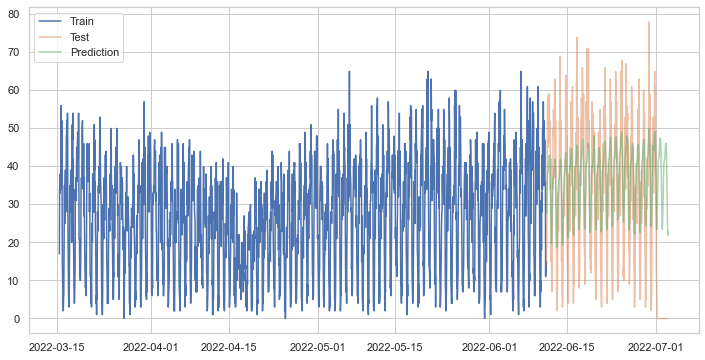

In [60]:
#Plot the train and test data on top the forecast
plt.plot(data_train.set_index('ds')['y'], label='Train')
plt.plot(data_test.set_index('ds')['y'], label='Test',alpha=0.5)
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',alpha=0.5)
plt.legend()

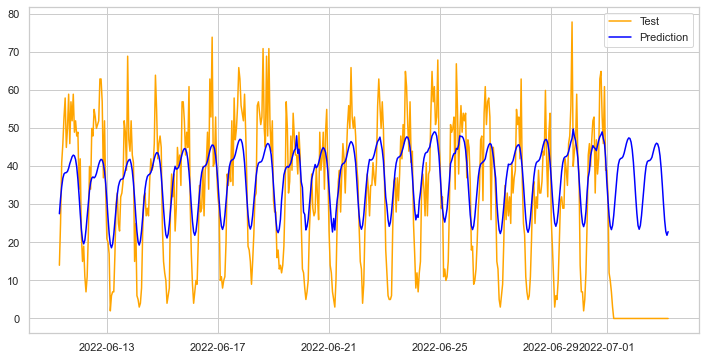

In [61]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
plt.legend()

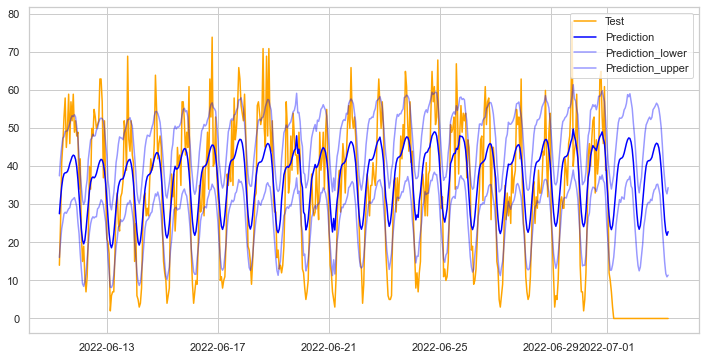

In [62]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
lower=plt.plot(forecast.set_index('ds')['yhat_lower'], label='Prediction_lower',alpha=0.4,color='blue')
upper=plt.plot(forecast.set_index('ds')['yhat_upper'], label='Prediction_upper',alpha=0.4,color='blue')
plt.legend()

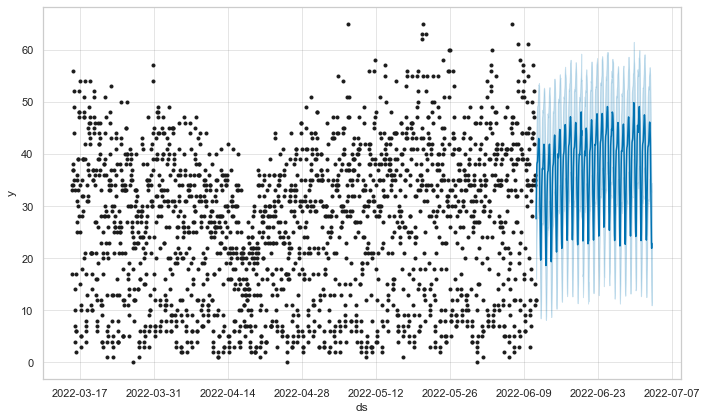

In [63]:
fig1 = m.plot(forecast)

In [64]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [65]:
plot_components_plotly(m, forecast)

In [66]:
# Cross validation
#Train on the first 200 days, aply to next 5 days and loop each 5 days to reach final data
from prophet.diagnostics import cross_validation

df_cv = cross_validation(m, initial='20 days', period='5 days', horizon = '20 days', parallel="processes")

INFO:prophet:Making 10 forecasts with cutoffs between 2022-04-07 06:00:00 and 2022-05-22 06:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fd958c789d0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -37.3195
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -37.3195             0       542.285       1e-12       0.001       19   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -202.817
Initial log joint probability = -44.1461
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1      -44.1461             0       660.335       1e-12       0.001       22   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -319.917
Initial log joint probability = -43.9887
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

       1      -43.9887             0       770.078       1e-12       0.001       26   
Optimization terminated with error: 
  Line search failed to achieve a sufficient decrease, no more progress can be made

Initial log joint probability = -430.032
Initial log joint probability = -47.26
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -47.0536
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -54.4411
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration  1. Log joint probability =    314.544. Improved by 517.362.
Initial log joint probability = -61.2624
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -44.3536
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      62        

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      77       1650.25   3.02208e-09       4971.26      0.4757      0.4757      103   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
      90       1103.12   8.32938e-06       4964.15   1.648e-09       0.001      148  LS failed, Hessian reset 
      67       939.124   2.08356e-05       5173.66   4.459e-09       0.001      126  LS failed, Hessian reset 
Iteration  1. Log joint probability =    153.152. Improved by 473.069.
      99       1472.11   3.25436e-06       5030.07      0.2111           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1103.16   4.06274e-07       5020.21       0.332       0.332      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       1103.16   2.88975e-09       4938.67      0.1826      0.1826      178   
Optimization terminated normally: 
  Convergence detected: absolute pa

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     180       939.362   5.55318e-06       4792.61   1.087e-09       0.001      391  LS failed, Hessian reset 
     199       939.387   7.29671e-08       4866.22      0.2543           1      414   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       939.387   5.26964e-09       4897.07      0.2954      0.2954      421   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration  2. Log joint probability =     529.71. Improved by 376.558.
Iteration  3. Log joint probability =     366.58. Improved by 18.4659.
Iteration  2. Log joint probability =    684.332. Improved by 648.365.
Iteration  4. Log joint probability =    500.096. Improved by 133.516.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration  3. Log joint probability =    611.101. Improved by 81.3912.
Iteration  5. Log joint probability =    512.733. Improved by 12.6368.
Iteration  4. Log joint probability =    648.899. Improved by 37.7978.
Iteration  3. Log joint probability =    793.802. Improved by 109.47.
Iteration  6. Log joint probability =    530.407. Improved by 17.6738.
Iteration  5. Log joint probability =    658.955. Improved by 10.0555.
Iteration  4. Log joint probability =    808.339. Improved by 14.537.
Iteration  7. Log joint probability =      532.4. Improved by 1.99335.
Iteration  6. Log joint probability =    666.615. Improved by 7.66002.
Iteration  8. Log joint probability =    532.524. Improved by 0.123722.
Iteration  5. Log joint probability =    820.645. Improved by 12.3057.
Iteration  7. Log joint probability =     669.62. Improved by 3.00537.
Iteration  9. Log joint probability =     532.56. Improved by 0.0356047.
Iteration  6. Log joint probability =    822.467. Improved by 1.82271.
Itera

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 25. Log joint probability =    825.665. Improved by 0.000364825.
Iteration 30. Log joint probability =    673.224. Improved by 0.000230178.
Iteration 26. Log joint probability =    825.665. Improved by 0.000237417.
Iteration 31. Log joint probability =    673.224. Improved by 7.32265e-05.
Iteration 27. Log joint probability =    825.665. Improved by 0.0002381.
Iteration 32. Log joint probability =    673.224. Improved by 0.000123224.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -68.9321
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -65.3183
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Iteration 28. Log joint probability =    825.665. Improved by 9.34538e-05.
      88       1819.69   3.63299e-09       5037.66      0.4098      0.4098      116   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 33. Log joint probability =    673.224. Improved by 8.3353e-05.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      75       1960.49   1.26557e-06       5077.89   2.528e-10       0.001      141  LS failed, Hessian reset 
Iteration 29. Log joint probability =    825.665. Improved by 3.54199e-05.
      95        1960.5    3.1281e-09       5141.75      0.1987      0.1987      167   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Iteration 34. Log joint probability =    673.224. Improved by 3.2221e-05.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Iteration 35. Log joint probability =    673.224. Improved by 1.71043e-05.
Iteration 30. Log joint probability =    825.665. Improved by 5.43319e-05.
Iteration 36. Log joint probability =    673.224. Improved by 1.0198e-06.
Iteration 31. Log joint probability =    825.665. Improved by 1.17546e-05.
Iteration 37. Log joint probability =    673.224. Improved by 9.29867e-06.
Iteration 32. Log joint probability =    825.665. Improved by 3.56342e-05.
Iteration 38. Log joint probability =    673.224. Improved by 5.57969e-06.
Iteration 33. Log joint probability =    825.665. Improved by 1.68887e-05.
Iteration 39. Log joint probability =    673.224. Improved by 1.62485e-06.
Iteration 34. Log joint probability =    825.665. Improved by 1.07098e-05.
Iteration 40. Log joint probability =    673.224. Improved by 1.06357e-07.
Iteration 35. Log joint probability =    825.665. Improved by 4.07809e-06.
Iteration 41. Log joint probability =    673.224. Improved by 1.28968e-06.
Iteration 42. Log joint pr

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Iteration 45. Log joint probability =    825.665. Improved by 2.21637e-08.
Iteration 46. Log joint probability =    825.665. Improved by 6.19741e-09.


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

In [67]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2022-04-07 07:00:00,24.788664,10.033823,40.882913,20,2022-04-07 06:00:00
1,2022-04-07 08:00:00,24.479659,7.987054,39.336421,27,2022-04-07 06:00:00
2,2022-04-07 09:00:00,25.027019,8.722879,41.939010,15,2022-04-07 06:00:00
3,2022-04-07 10:00:00,25.375659,10.050201,40.479636,16,2022-04-07 06:00:00
4,2022-04-07 11:00:00,26.436016,10.074345,42.370064,25,2022-04-07 06:00:00


In [68]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

INFO:prophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,smape,coverage
0,2 days 00:00:00,137.827587,11.739999,9.771562,0.290908,0.475275,0.768750
1,2 days 01:00:00,136.997969,11.704613,9.757151,0.293134,0.473898,0.770833
2,2 days 02:00:00,136.879136,11.699536,9.756535,0.290908,0.473259,0.770833
3,2 days 03:00:00,136.793847,11.695890,9.749244,0.288689,0.472670,0.770833
4,2 days 04:00:00,137.012437,11.705231,9.770129,0.293134,0.473606,0.770833


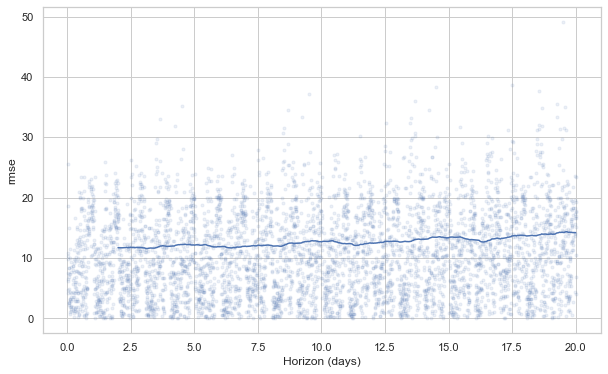

In [69]:
from prophet.plot import plot_cross_validation_metric

fig = plot_cross_validation_metric(df_cv, metric='rmse')

In [70]:
#calculate Root Mean Square  Error(RMSE)
from math import sqrt
from sklearn.metrics import mean_squared_error

rms = sqrt(mean_squared_error(data_test['y'],forecast['yhat']))

print('The root mean square error score for the model is: ', rms)

The root mean square error score for the model is:  15.955703312292338
